In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('fivethirtyeight')
from datetime import timedelta
from datetime import datetime as dt
from matplotlib.ticker import FuncFormatter
%matplotlib inline

In [2]:
import matplotlib.pylab as pylab
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (15, 9),
         'axes.labelsize': 'x-large',
         'axes.titlesize':'xx-large',
         'xtick.labelsize':'x-large',
         'ytick.labelsize':'x-large'}
pylab.rcParams.update(params)

# Load data

### Errors encountered when loading in data:

- **ParserError**: Error tokenizing data. C error: Expected 13 fields in line 30, saw 14

 Reason: <br>
 - The were erroneous values such as 'Moccasins & Boat Shoes' in the `order_created_at` column, and as a result shifted the data for the `order_created_at` and `order_status` columns to the right by 1 column, resulting in 14 columns.

 - This 14th column had a blank header, which resulted in ParserError.

 Solution: <br>
 - Specify a list of 14 column names before reading in csv; extra column named as 'error'.<br><br>

- **UnicodeDecodeError**: 'utf-8' codec can't decode byte 0xc9 in position 82: invalid continuation byte

 Solution:
  - When reading in csv, include parameter `encoding='latin-1'`

In [3]:
col_names = ['zuid','gender','birthday','cohort','order_nr','environment','voucher_code',
             'order_value','brand','category','sub_category','order_created_at','order_status', 'error']

df = pd.read_csv('sales.csv', names=col_names, skipinitialspace=True, encoding='latin-1', low_memory=False)

In [4]:
df.head()

,zuid,gender,birthday,cohort,order_nr,environment,voucher_code,order_value,brand,category,sub_category,order_created_at,order_status,error
0,zuid,gender,birthday,cohort,order_nr,environment,voucher_code,order_value,brand,category,sub_category,order_created_at,order_status,NaN
1,213794755865817,male,(null),2016-07,205926117,mobileTheme,NaN,27.10,Burton Menswear London,apparel,Shirts,2016-08-02 00:52:44,net,NaN
2,213794755865817,male,(null),2016-07,207816617,mobileTheme,NaN,23.03,Bellfield,apparel,T-Shirts,2016-07-22 13:06:46,net,NaN
3,213794755865817,male,(null),2016-07,205926117,mobileTheme,NaN,13.93,ZALORA,apparel,T-Shirts,2016-08-02 00:52:44,net,NaN
4,213794755865817,male,(null),2016-07,508943717,NaN,NaN,14.02,ZALORA,apparel,Shorts,2016-07-30 11:07:31,net,NaN


In [5]:
# Drop first row containing original headers from csv file
df.drop(df.index[0], inplace=True)
df.head(10)

,zuid,gender,birthday,cohort,order_nr,environment,voucher_code,order_value,brand,category,sub_category,order_created_at,order_status,error
1,213794755865817,male,(null),2016-07,205926117,mobileTheme,NaN,27.10,Burton Menswear London,apparel,Shirts,2016-08-02 00:52:44,net,NaN
2,213794755865817,male,(null),2016-07,207816617,mobileTheme,NaN,23.03,Bellfield,apparel,T-Shirts,2016-07-22 13:06:46,net,NaN
3,213794755865817,male,(null),2016-07,205926117,mobileTheme,NaN,13.93,ZALORA,apparel,T-Shirts,2016-08-02 00:52:44,net,NaN
4,213794755865817,male,(null),2016-07,508943717,NaN,NaN,14.02,ZALORA,apparel,Shorts,2016-07-30 11:07:31,net,NaN
5,213794755865817,male,(null),2016-07,205926117,mobileTheme,NaN,13.93,ZALORA,apparel,T-Shirts,2016-08-02 00:52:44,net,NaN
6,213794755865817,male,(null),2016-07,207816617,mobileTheme,NaN,14.02,ZALORA,apparel,Shorts,2016-07-22 13:06:46,returned,NaN
7,213794755865817,male,(null),2016-07,205926117,mobileTheme,NaN,13.93,ZALORA,apparel,T-Shirts,2016-08-02 00:52:44,net,NaN
8,213794755865817,male,(null),2016-07,207816617,mobileTheme,NaN,14.02,ZALORA,apparel,T-Shirts,2016-07-22 13:06:46,net,NaN
9,214675390286375,male,1997-09-22,2016-11,203527495,iosApp,NaN,41.96,ZALORA,footwear,Heels,2016-11-15 23:38:27,net,NaN
10,214710036824959,female,1983-04-06,2016-08,207723237,desktop,NaN,28.01,Rubi,footwear,Boots,2016-08-12 20:19:20,net,NaN


# Data Cleaning

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 929476 entries, 1 to 929476
Data columns (total 14 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   zuid              929476 non-null  object
 1   gender            927614 non-null  object
 2   birthday          929476 non-null  object
 3   cohort            929476 non-null  object
 4   order_nr          929476 non-null  object
 5   environment       910165 non-null  object
 6   voucher_code      371045 non-null  object
 7   order_value       929476 non-null  object
 8   brand             929327 non-null  object
 9   category          929476 non-null  object
 10  sub_category      929344 non-null  object
 11  order_created_at  929476 non-null  object
 12  order_status      929476 non-null  object
 13  error             9234 non-null    object
dtypes: object(14)
memory usage: 106.4+ MB


Concerns with datatypes:

- `order_value` should be `float64`
- `order_created_at` should be `datetime64`
- `birthday` should be `datetime64`

### Fix 'order_created_at' column

In [7]:
# Find all erroneous text values in the 'order_created_at' column and replace with 
# the correct dates in the 'order_status' column
df['order_created_at'] = np.where(df['order_created_at'].str.contains('[A-Za-z]'), 
                                  df['order_status'], df['order_created_at'])

# Shift the order_status values in the temporary 'error' column back to the order_status column
df['order_status'] = np.where(df['order_created_at'].str.contains('[A-Za-z]'), 
                              df['error'], df['order_status'])

In [8]:
# Check the dataset
df

,zuid,gender,birthday,cohort,order_nr,environment,voucher_code,order_value,brand,category,sub_category,order_created_at,order_status,error
1,213794755865817,male,(null),2016-07,205926117,mobileTheme,NaN,27.10,Burton Menswear London,apparel,Shirts,2016-08-02 00:52:44,net,NaN
2,213794755865817,male,(null),2016-07,207816617,mobileTheme,NaN,23.03,Bellfield,apparel,T-Shirts,2016-07-22 13:06:46,net,NaN
3,213794755865817,male,(null),2016-07,205926117,mobileTheme,NaN,13.93,ZALORA,apparel,T-Shirts,2016-08-02 00:52:44,net,NaN
4,213794755865817,male,(null),2016-07,508943717,NaN,NaN,14.02,ZALORA,apparel,Shorts,2016-07-30 11:07:31,net,NaN
5,213794755865817,male,(null),2016-07,205926117,mobileTheme,NaN,13.93,ZALORA,apparel,T-Shirts,2016-08-02 00:52:44,net,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
929472,214674382676104,male,1981-05-05,2017-03,209837635,mobileTheme,5INMARCH,12.11,ZALORA,apparel,Tops,2017-03-02 17:02:48,returned,NaN
929473,214674382676104,male,1981-05-05,2017-03,209837635,mobileTheme,5INMARCH,10.49,ZALORA,apparel,Tops,2017-03-02 17:02:48,returned,NaN
929474,214674382676104,male,1981-05-05,2017-03,209837635,mobileTheme,5INMARCH,12.93,Penshoppe,apparel,Tops,2017-03-02 17:02:48,net,NaN
929475,214674382676104,male,1981-05-05,2017-03,209837635,mobileTheme,5INMARCH,10.49,ZALORA,apparel,Tops,2017-03-02 17:02:48,net,NaN


In [9]:
# Now, we can drop the 'error' column
df.drop('error', axis=1, inplace=True)

### Standardise NA values to np.nan

In [10]:
# Replace irregular null values with np.nan 
faulty_values = ['(null)', 'nan']
df.replace(faulty_values, np.nan, inplace=True)

In [11]:
df

,zuid,gender,birthday,cohort,order_nr,environment,voucher_code,order_value,brand,category,sub_category,order_created_at,order_status
1,213794755865817,male,NaN,2016-07,205926117,mobileTheme,NaN,27.10,Burton Menswear London,apparel,Shirts,2016-08-02 00:52:44,net
2,213794755865817,male,NaN,2016-07,207816617,mobileTheme,NaN,23.03,Bellfield,apparel,T-Shirts,2016-07-22 13:06:46,net
3,213794755865817,male,NaN,2016-07,205926117,mobileTheme,NaN,13.93,ZALORA,apparel,T-Shirts,2016-08-02 00:52:44,net
4,213794755865817,male,NaN,2016-07,508943717,NaN,NaN,14.02,ZALORA,apparel,Shorts,2016-07-30 11:07:31,net
5,213794755865817,male,NaN,2016-07,205926117,mobileTheme,NaN,13.93,ZALORA,apparel,T-Shirts,2016-08-02 00:52:44,net
...,...,...,...,...,...,...,...,...,...,...,...,...,...
929472,214674382676104,male,1981-05-05,2017-03,209837635,mobileTheme,5INMARCH,12.11,ZALORA,apparel,Tops,2017-03-02 17:02:48,returned
929473,214674382676104,male,1981-05-05,2017-03,209837635,mobileTheme,5INMARCH,10.49,ZALORA,apparel,Tops,2017-03-02 17:02:48,returned
929474,214674382676104,male,1981-05-05,2017-03,209837635,mobileTheme,5INMARCH,12.93,Penshoppe,apparel,Tops,2017-03-02 17:02:48,net
929475,214674382676104,male,1981-05-05,2017-03,209837635,mobileTheme,5INMARCH,10.49,ZALORA,apparel,Tops,2017-03-02 17:02:48,net


In [12]:
# Check number of na values in each column:
df.isna().sum()

zuid                     0
gender                1862
birthday            345425
cohort                   0
order_nr                 0
environment          19311
voucher_code        558431
order_value              0
brand                  149
category             22515
sub_category           132
order_created_at         0
order_status             0
dtype: int64

### Convert datatypes

In [13]:
# Convert datatypes for columns, and assign it back to the column since the astype() function only returns a copy.
df['order_value'] = df['order_value'].astype(float)
df['birthday'] = pd.to_datetime(df['birthday'])

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 929476 entries, 1 to 929476
Data columns (total 13 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   zuid              929476 non-null  object        
 1   gender            927614 non-null  object        
 2   birthday          584051 non-null  datetime64[ns]
 3   cohort            929476 non-null  object        
 4   order_nr          929476 non-null  object        
 5   environment       910165 non-null  object        
 6   voucher_code      371045 non-null  object        
 7   order_value       929476 non-null  float64       
 8   brand             929327 non-null  object        
 9   category          906961 non-null  object        
 10  sub_category      929344 non-null  object        
 11  order_created_at  929476 non-null  object        
 12  order_status      929476 non-null  object        
dtypes: datetime64[ns](1), float64(1), object(11)
memory usage: 

### Create new date/time columns

In [15]:
# Extract out order time
df['order_time'] = pd.to_datetime(df['order_created_at']).dt.time

In [16]:
# Extract hour
df['order_hour'] = pd.to_datetime(df['order_time'], format='%H:%M:%S').dt.hour

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 929476 entries, 1 to 929476
Data columns (total 15 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   zuid              929476 non-null  object        
 1   gender            927614 non-null  object        
 2   birthday          584051 non-null  datetime64[ns]
 3   cohort            929476 non-null  object        
 4   order_nr          929476 non-null  object        
 5   environment       910165 non-null  object        
 6   voucher_code      371045 non-null  object        
 7   order_value       929476 non-null  float64       
 8   brand             929327 non-null  object        
 9   category          906961 non-null  object        
 10  sub_category      929344 non-null  object        
 11  order_created_at  929476 non-null  object        
 12  order_status      929476 non-null  object        
 13  order_time        929476 non-null  object        
 14  orde

In [18]:
# Extract out YYYY-MM of order
df['order_year_mth'] = df['order_created_at'].str[0:7]

In [19]:
# Convert to datetime dtype
df['order_created_at'] = pd.to_datetime(df['order_created_at'])

In [20]:
# Extract out the month 
# code is different from the others above because we have already converted order_created_at to datetime format
df['order_month'] = df.order_created_at.dt.month

In [21]:
# Extract day of week
df['order_day'] = df['order_created_at'].dt.dayofweek  # Monday=0, Sunday=6

In [22]:
df

,zuid,gender,birthday,cohort,order_nr,environment,voucher_code,order_value,brand,category,sub_category,order_created_at,order_status,order_time,order_hour,order_year_mth,order_month,order_day
1,213794755865817,male,NaT,2016-07,205926117,mobileTheme,NaN,27.10,Burton Menswear London,apparel,Shirts,2016-08-02 00:52:44,net,00:52:44,0,2016-08,8,1
2,213794755865817,male,NaT,2016-07,207816617,mobileTheme,NaN,23.03,Bellfield,apparel,T-Shirts,2016-07-22 13:06:46,net,13:06:46,13,2016-07,7,4
3,213794755865817,male,NaT,2016-07,205926117,mobileTheme,NaN,13.93,ZALORA,apparel,T-Shirts,2016-08-02 00:52:44,net,00:52:44,0,2016-08,8,1
4,213794755865817,male,NaT,2016-07,508943717,NaN,NaN,14.02,ZALORA,apparel,Shorts,2016-07-30 11:07:31,net,11:07:31,11,2016-07,7,5
5,213794755865817,male,NaT,2016-07,205926117,mobileTheme,NaN,13.93,ZALORA,apparel,T-Shirts,2016-08-02 00:52:44,net,00:52:44,0,2016-08,8,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
929472,214674382676104,male,1981-05-05,2017-03,209837635,mobileTheme,5INMARCH,12.11,ZALORA,apparel,Tops,2017-03-02 17:02:48,returned,17:02:48,17,2017-03,3,3
929473,214674382676104,male,1981-05-05,2017-03,209837635,mobileTheme,5INMARCH,10.49,ZALORA,apparel,Tops,2017-03-02 17:02:48,returned,17:02:48,17,2017-03,3,3
929474,214674382676104,male,1981-05-05,2017-03,209837635,mobileTheme,5INMARCH,12.93,Penshoppe,apparel,Tops,2017-03-02 17:02:48,net,17:02:48,17,2017-03,3,3
929475,214674382676104,male,1981-05-05,2017-03,209837635,mobileTheme,5INMARCH,10.49,ZALORA,apparel,Tops,2017-03-02 17:02:48,net,17:02:48,17,2017-03,3,3


In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 929476 entries, 1 to 929476
Data columns (total 18 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   zuid              929476 non-null  object        
 1   gender            927614 non-null  object        
 2   birthday          584051 non-null  datetime64[ns]
 3   cohort            929476 non-null  object        
 4   order_nr          929476 non-null  object        
 5   environment       910165 non-null  object        
 6   voucher_code      371045 non-null  object        
 7   order_value       929476 non-null  float64       
 8   brand             929327 non-null  object        
 9   category          906961 non-null  object        
 10  sub_category      929344 non-null  object        
 11  order_created_at  929476 non-null  datetime64[ns]
 12  order_status      929476 non-null  object        
 13  order_time        929476 non-null  object        
 14  orde

### Update values in 'environment' column

In [24]:
df.environment.unique()

array(['mobileTheme', nan, 'iosApp', 'desktop', 'tabletTheme',
       'androidApp'], dtype=object)

For easier analysis, I will combine 'mobileTheme', 'iosApp', and 'androidApp' together under 'mobile'.

In [25]:
# Lump 'mobileTheme', 'iosApp', and 'androidApp' together under 'mobile'
df.replace({'environment': {'mobileTheme':'mobile', 'iosApp':'mobile', 'androidApp':'mobile'}}, inplace=True)

# Rename 'tabletTheme' to 'tablet'
df.environment.replace('tabletTheme', 'tablet', inplace=True)

df.environment.unique()

array(['mobile', nan, 'desktop', 'tablet'], dtype=object)

# Exploratory Data Analysis

In [26]:
df.head()

,zuid,gender,birthday,cohort,order_nr,environment,voucher_code,order_value,brand,category,sub_category,order_created_at,order_status,order_time,order_hour,order_year_mth,order_month,order_day
1,213794755865817,male,NaT,2016-07,205926117,mobile,NaN,27.10,Burton Menswear London,apparel,Shirts,2016-08-02 00:52:44,net,00:52:44,0,2016-08,8,1
2,213794755865817,male,NaT,2016-07,207816617,mobile,NaN,23.03,Bellfield,apparel,T-Shirts,2016-07-22 13:06:46,net,13:06:46,13,2016-07,7,4
3,213794755865817,male,NaT,2016-07,205926117,mobile,NaN,13.93,ZALORA,apparel,T-Shirts,2016-08-02 00:52:44,net,00:52:44,0,2016-08,8,1
4,213794755865817,male,NaT,2016-07,508943717,NaN,NaN,14.02,ZALORA,apparel,Shorts,2016-07-30 11:07:31,net,11:07:31,11,2016-07,7,5
5,213794755865817,male,NaT,2016-07,205926117,mobile,NaN,13.93,ZALORA,apparel,T-Shirts,2016-08-02 00:52:44,net,00:52:44,0,2016-08,8,1


In [27]:
print("Number of customers:", df['zuid'].nunique())
print("Number of successful orders: ", df['order_nr'].nunique())

Number of customers: 137415
Number of successful orders:  326618


### Percentage of successful orders

In [28]:
df_order_stat = df.groupby('order_status', as_index=False).agg({'order_nr': pd.Series.nunique})

In [29]:
df_order_stat

,order_status,order_nr
0,2012-06-11 19:08:54,1
1,2012-06-15 08:24:18,1
2,2012-06-15 08:24:37,1
3,2012-07-23 22:52:46,1
4,2012-12-18 19:59:56,1
...,...,...
8054,canceled,12557
8055,invalid,25468
8056,net,267262
8057,rejected,3834


There seems to be many rows with erroneous date values in the order_status column. We will ignore those rows and focus on the ones with a proper order status. 

#### drop rows with dates

In [30]:
# Filter out rows with date values
df_order_stat = df_order_stat[df_order_stat.order_status.str[0:2] != '20']
df_order_stat

,order_status,order_nr
8054,canceled,12557
8055,invalid,25468
8056,net,267262
8057,rejected,3834
8058,returned,73453


In [31]:
# Total orders made, including unsuccessful ones
df_order_stat.sum()

order_status    canceledinvalidnetrejectedreturned
order_nr                                    382574
dtype: object

In [32]:
# percentage of successful orders
267262/382574

0.6985890311416876

### Keep only the successful orders for further analysis

In [33]:
df = df[df.order_status == 'net']
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 646680 entries, 1 to 929476
Data columns (total 18 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   zuid              646680 non-null  object        
 1   gender            645371 non-null  object        
 2   birthday          397118 non-null  datetime64[ns]
 3   cohort            646680 non-null  object        
 4   order_nr          646680 non-null  object        
 5   environment       631877 non-null  object        
 6   voucher_code      238108 non-null  object        
 7   order_value       646680 non-null  float64       
 8   brand             646561 non-null  object        
 9   category          628265 non-null  object        
 10  sub_category      646574 non-null  object        
 11  order_created_at  646680 non-null  datetime64[ns]
 12  order_status      646680 non-null  object        
 13  order_time        646680 non-null  object        
 14  orde

In [34]:
# check 
df.order_status.unique()

array(['net'], dtype=object)

In [35]:
df.describe()

,order_value,order_hour,order_month,order_day
count,646680.000000,646680.000000,646680.000000,646680.000000
mean,28.755141,14.470434,6.227955,2.976239
std,28.066380,6.833077,3.451763,2.062516
min,-24.730000,0.000000,1.000000,0.000000
25%,13.930000,11.000000,3.000000,1.000000
50%,21.660000,15.000000,6.000000,3.000000
75%,32.620000,21.000000,9.000000,5.000000
max,1316.360000,23.000000,12.000000,6.000000


### Average age of Zalora's customers?

In [36]:
# check that there are no rubbish values
df_birthday = df[df.birthday.notnull()]

for birthday in df_birthday.birthday:
    print(birthday)

1997-09-22 00:00:00
1983-04-06 00:00:00
1987-12-26 00:00:00
1992-08-30 00:00:00
1992-08-30 00:00:00
1987-12-24 00:00:00
1987-12-24 00:00:00
1987-12-24 00:00:00
1987-12-24 00:00:00
2000-08-15 00:00:00
2000-08-15 00:00:00
2000-08-15 00:00:00
2000-08-15 00:00:00
2000-08-15 00:00:00
2000-08-15 00:00:00
2000-08-15 00:00:00
2000-08-15 00:00:00
1996-04-16 00:00:00
1978-04-17 00:00:00
1993-03-26 00:00:00
1988-12-23 00:00:00
2015-03-31 00:00:00
2015-03-31 00:00:00
1961-08-20 00:00:00
1961-08-20 00:00:00
1961-08-20 00:00:00
1998-07-25 00:00:00
1998-07-25 00:00:00
1998-07-25 00:00:00
1998-07-25 00:00:00
1998-07-25 00:00:00
1986-12-18 00:00:00
1986-12-18 00:00:00
1986-12-18 00:00:00
1986-12-18 00:00:00
1986-12-18 00:00:00
1986-12-18 00:00:00
2001-03-05 00:00:00
2001-03-05 00:00:00
2001-03-05 00:00:00
1996-10-10 00:00:00
1996-10-10 00:00:00
1996-10-10 00:00:00
1996-10-10 00:00:00
1996-10-10 00:00:00
1996-10-10 00:00:00
1996-10-10 00:00:00
1990-02-24 00:00:00
1990-02-24 00:00:00
1994-10-11 00:00:00


1993-08-14 00:00:00
1993-08-14 00:00:00
1993-08-14 00:00:00
1993-08-14 00:00:00
1993-08-14 00:00:00
1993-08-14 00:00:00
1993-08-14 00:00:00
1993-08-14 00:00:00
1993-08-14 00:00:00
1993-08-14 00:00:00
1993-08-14 00:00:00
1996-04-29 00:00:00
1996-04-29 00:00:00
1996-04-29 00:00:00
1989-08-05 00:00:00
1989-08-05 00:00:00
1998-12-25 00:00:00
1988-03-21 00:00:00
1988-03-21 00:00:00
1984-03-06 00:00:00
1990-06-29 00:00:00
1990-02-02 00:00:00
1990-02-02 00:00:00
1990-02-02 00:00:00
1990-02-02 00:00:00
1990-02-02 00:00:00
1990-02-02 00:00:00
1990-02-02 00:00:00
1996-06-27 00:00:00
1995-12-25 00:00:00
1995-12-25 00:00:00
1992-05-14 00:00:00
1992-05-14 00:00:00
1992-05-14 00:00:00
1992-05-14 00:00:00
1998-03-05 00:00:00
1998-03-05 00:00:00
1998-03-05 00:00:00
1998-03-05 00:00:00
1998-03-05 00:00:00
1998-03-05 00:00:00
1944-02-08 00:00:00
1944-02-08 00:00:00
1944-02-08 00:00:00
1944-02-08 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00


1990-03-22 00:00:00
1990-03-22 00:00:00
1981-08-21 00:00:00
1981-08-21 00:00:00
1992-06-19 00:00:00
1994-08-27 00:00:00
1998-08-15 00:00:00
1998-08-15 00:00:00
1987-04-08 00:00:00
1987-04-08 00:00:00
1996-03-26 00:00:00
1996-03-26 00:00:00
1996-03-26 00:00:00
1996-03-26 00:00:00
1997-09-29 00:00:00
1997-09-29 00:00:00
1970-01-16 00:00:00
1970-01-16 00:00:00
1970-01-16 00:00:00
2000-09-08 00:00:00
1982-09-07 00:00:00
2000-02-23 00:00:00
1998-10-29 00:00:00
1998-10-29 00:00:00
1988-02-18 00:00:00
1988-02-18 00:00:00
1988-02-18 00:00:00
1988-02-18 00:00:00
1988-02-18 00:00:00
1988-02-18 00:00:00
1988-02-18 00:00:00
1988-02-18 00:00:00
1972-04-23 00:00:00
1972-04-23 00:00:00
1972-04-23 00:00:00
1972-04-23 00:00:00
1972-04-23 00:00:00
1972-04-23 00:00:00
1988-08-07 00:00:00
1980-10-06 00:00:00
1991-05-18 00:00:00
1991-05-18 00:00:00
1989-12-19 00:00:00
1980-07-01 00:00:00
1980-07-01 00:00:00
1980-07-01 00:00:00
1980-07-01 00:00:00
1980-07-01 00:00:00
1989-07-17 00:00:00
1989-07-17 00:00:00


1975-12-04 00:00:00
1990-02-10 00:00:00
1990-02-10 00:00:00
1990-02-10 00:00:00
1990-02-10 00:00:00
1990-02-10 00:00:00
1990-02-10 00:00:00
1990-02-10 00:00:00
1993-04-13 00:00:00
1993-04-13 00:00:00
1993-04-13 00:00:00
1993-04-13 00:00:00
1993-04-13 00:00:00
1993-04-13 00:00:00
1993-04-13 00:00:00
1993-04-13 00:00:00
1993-04-13 00:00:00
1993-04-13 00:00:00
1993-04-13 00:00:00
1990-04-23 00:00:00
1990-04-23 00:00:00
1990-04-23 00:00:00
1999-08-04 00:00:00
1981-06-11 00:00:00
1981-06-11 00:00:00
1981-06-11 00:00:00
1997-11-19 00:00:00
1997-11-19 00:00:00
1989-09-22 00:00:00
1990-10-27 00:00:00
1990-10-27 00:00:00
1990-10-27 00:00:00
1990-10-27 00:00:00
1990-10-27 00:00:00
1990-10-27 00:00:00
1990-10-27 00:00:00
1990-10-28 00:00:00
1990-10-28 00:00:00
1990-10-28 00:00:00
1990-10-28 00:00:00
1990-10-28 00:00:00
1990-10-28 00:00:00
1990-10-28 00:00:00
1990-10-28 00:00:00
1990-10-28 00:00:00
1997-11-04 00:00:00
1997-11-04 00:00:00
1997-11-04 00:00:00
1997-11-04 00:00:00
1996-06-05 00:00:00


1988-06-20 00:00:00
1988-06-20 00:00:00
1988-06-20 00:00:00
1988-06-20 00:00:00
1988-06-20 00:00:00
1988-06-20 00:00:00
1988-06-20 00:00:00
1988-06-20 00:00:00
1988-06-20 00:00:00
1988-06-20 00:00:00
1988-06-20 00:00:00
1988-06-20 00:00:00
1999-04-11 00:00:00
1991-09-20 00:00:00
1991-09-20 00:00:00
1991-09-20 00:00:00
1991-09-20 00:00:00
1991-09-20 00:00:00
1991-09-20 00:00:00
1991-09-20 00:00:00
1991-09-20 00:00:00
1991-09-20 00:00:00
1991-09-20 00:00:00
1991-09-20 00:00:00
1991-09-20 00:00:00
1991-09-20 00:00:00
1991-09-20 00:00:00
1991-09-20 00:00:00
1986-01-11 00:00:00
1986-01-11 00:00:00
1986-01-11 00:00:00
1986-01-11 00:00:00
1986-01-11 00:00:00
1996-01-13 00:00:00
1996-01-13 00:00:00
1992-07-03 00:00:00
1995-04-25 00:00:00
1996-05-29 00:00:00
1996-05-29 00:00:00
1995-12-29 00:00:00
1985-04-09 00:00:00
1985-04-09 00:00:00
1998-06-23 00:00:00
1998-08-18 00:00:00
1998-08-18 00:00:00
1978-10-13 00:00:00
1978-10-13 00:00:00
1978-10-13 00:00:00
1978-10-13 00:00:00
1978-10-13 00:00:00


1984-12-30 00:00:00
1984-12-30 00:00:00
1984-12-30 00:00:00
1984-12-30 00:00:00
1984-12-30 00:00:00
1984-12-30 00:00:00
1984-12-30 00:00:00
1984-12-30 00:00:00
1979-08-04 00:00:00
1979-08-04 00:00:00
1979-08-04 00:00:00
1979-08-04 00:00:00
1979-08-04 00:00:00
1979-08-04 00:00:00
1979-08-04 00:00:00
1979-08-04 00:00:00
1979-08-04 00:00:00
1979-08-04 00:00:00
1979-08-04 00:00:00
1979-08-04 00:00:00
1982-07-01 00:00:00
1982-07-01 00:00:00
1982-07-01 00:00:00
1982-07-01 00:00:00
1982-07-01 00:00:00
1982-07-01 00:00:00
1982-07-01 00:00:00
1982-07-01 00:00:00
1982-07-01 00:00:00
1982-07-01 00:00:00
1982-07-01 00:00:00
1982-07-01 00:00:00
1990-07-19 00:00:00
1990-07-19 00:00:00
1999-05-10 00:00:00
1969-03-01 00:00:00
1969-03-01 00:00:00
1969-03-01 00:00:00
1999-02-15 00:00:00
1999-02-15 00:00:00
1999-02-15 00:00:00
1999-02-15 00:00:00
1999-02-15 00:00:00
1999-02-15 00:00:00
1999-02-15 00:00:00
1970-11-28 00:00:00
1970-11-28 00:00:00
1970-11-28 00:00:00
1970-11-28 00:00:00
1993-07-29 00:00:00


1992-10-17 00:00:00
1997-02-04 00:00:00
1997-02-04 00:00:00
1997-02-04 00:00:00
1992-07-21 00:00:00
1992-07-21 00:00:00
1992-07-21 00:00:00
1979-06-01 00:00:00
1979-06-01 00:00:00
1997-10-22 00:00:00
1997-10-22 00:00:00
1997-10-22 00:00:00
1997-10-22 00:00:00
1997-10-22 00:00:00
1997-10-22 00:00:00
1997-10-22 00:00:00
1997-10-22 00:00:00
1997-10-22 00:00:00
1997-10-22 00:00:00
1997-10-22 00:00:00
1998-02-17 00:00:00
1998-02-17 00:00:00
1980-09-10 00:00:00
1980-09-10 00:00:00
1980-09-10 00:00:00
1980-09-10 00:00:00
1999-02-04 00:00:00
1999-02-04 00:00:00
1999-02-04 00:00:00
1999-02-04 00:00:00
1999-02-04 00:00:00
1999-02-04 00:00:00
1999-02-04 00:00:00
1999-02-04 00:00:00
1999-02-04 00:00:00
1999-02-04 00:00:00
1998-11-11 00:00:00
1998-11-11 00:00:00
1998-11-11 00:00:00
1999-06-20 00:00:00
1999-06-20 00:00:00
1992-08-17 00:00:00
1979-03-21 00:00:00
1979-03-21 00:00:00
1979-03-21 00:00:00
1979-03-21 00:00:00
1979-03-21 00:00:00
1979-03-21 00:00:00
1979-03-21 00:00:00
1979-03-21 00:00:00


1999-03-27 00:00:00
1999-03-27 00:00:00
1999-03-27 00:00:00
1999-03-27 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00
1974-01-15 00:00:00


1997-02-06 00:00:00
1997-02-06 00:00:00
1997-02-06 00:00:00
1997-02-06 00:00:00
1997-02-06 00:00:00
1997-02-06 00:00:00
1998-05-26 00:00:00
1998-05-26 00:00:00
1998-05-26 00:00:00
1998-05-26 00:00:00
1998-05-26 00:00:00
1998-05-26 00:00:00
1998-05-26 00:00:00
1998-05-26 00:00:00
1986-04-21 00:00:00
1986-04-21 00:00:00
1986-04-21 00:00:00
1998-07-08 00:00:00
1997-10-19 00:00:00
1997-10-19 00:00:00
1975-09-14 00:00:00
1975-09-14 00:00:00
1975-09-14 00:00:00
1990-08-08 00:00:00
1996-01-26 00:00:00
1997-02-05 00:00:00
1991-09-11 00:00:00
1995-12-31 00:00:00
1995-12-31 00:00:00
1997-07-11 00:00:00
1997-07-11 00:00:00
1993-06-09 00:00:00
1993-06-09 00:00:00
1993-06-09 00:00:00
1993-06-09 00:00:00
1993-06-09 00:00:00
1993-06-09 00:00:00
1993-06-09 00:00:00
1993-06-09 00:00:00
1993-06-09 00:00:00
1993-06-09 00:00:00
1993-06-09 00:00:00
1993-06-09 00:00:00
1993-06-09 00:00:00
1993-06-09 00:00:00
1993-06-09 00:00:00
1993-06-09 00:00:00
1998-11-29 00:00:00
1993-01-11 00:00:00
1993-01-11 00:00:00


1982-08-13 00:00:00
1982-08-13 00:00:00
1994-05-03 00:00:00
1994-05-03 00:00:00
1994-05-03 00:00:00
1994-05-03 00:00:00
1996-01-05 00:00:00
1996-01-05 00:00:00
1995-12-26 00:00:00
1995-12-26 00:00:00
1995-12-26 00:00:00
1995-12-26 00:00:00
1995-12-26 00:00:00
1995-12-26 00:00:00
1995-12-26 00:00:00
1995-12-26 00:00:00
1984-11-11 00:00:00
1984-11-11 00:00:00
1984-11-11 00:00:00
1984-11-11 00:00:00
1990-03-09 00:00:00
1990-03-09 00:00:00
1990-03-09 00:00:00
1993-11-01 00:00:00
1993-11-01 00:00:00
1984-02-10 00:00:00
1988-11-05 00:00:00
1988-11-05 00:00:00
1988-11-05 00:00:00
1988-11-05 00:00:00
1988-11-05 00:00:00
1988-11-05 00:00:00
1988-11-05 00:00:00
1988-11-05 00:00:00
1988-11-05 00:00:00
1991-03-20 00:00:00
1991-03-20 00:00:00
1991-03-20 00:00:00
1991-03-20 00:00:00
1978-05-03 00:00:00
1991-01-16 00:00:00
1991-01-16 00:00:00
1996-08-10 00:00:00
1996-08-10 00:00:00
1996-08-10 00:00:00
1990-02-21 00:00:00
1990-02-21 00:00:00
1990-02-21 00:00:00
1999-03-18 00:00:00
1999-03-18 00:00:00


1968-08-04 00:00:00
1968-08-04 00:00:00
1968-08-04 00:00:00
1968-08-04 00:00:00
1968-08-04 00:00:00
1968-08-04 00:00:00
1968-08-04 00:00:00
1968-08-04 00:00:00
1974-12-27 00:00:00
2000-04-24 00:00:00
2000-04-24 00:00:00
1998-10-02 00:00:00
1998-10-02 00:00:00
1992-03-07 00:00:00
1992-03-07 00:00:00
1992-07-03 00:00:00
1992-07-03 00:00:00
1992-07-03 00:00:00
1992-07-03 00:00:00
1985-03-17 00:00:00
1997-05-22 00:00:00
1997-05-22 00:00:00
1997-05-22 00:00:00
1997-05-22 00:00:00
1997-05-22 00:00:00
1997-05-22 00:00:00
1997-05-22 00:00:00
1997-05-22 00:00:00
1997-05-22 00:00:00
1997-05-22 00:00:00
1997-05-22 00:00:00
1997-05-22 00:00:00
1997-05-22 00:00:00
1997-05-22 00:00:00
1997-05-22 00:00:00
1997-05-22 00:00:00
1997-05-22 00:00:00
1997-05-22 00:00:00
1997-05-22 00:00:00
1997-05-22 00:00:00
1997-05-22 00:00:00
1980-05-26 00:00:00
1980-05-26 00:00:00
1980-05-26 00:00:00
1980-05-26 00:00:00
1980-05-26 00:00:00
1996-07-13 00:00:00
1996-07-13 00:00:00
1996-07-13 00:00:00
1992-11-30 00:00:00


1983-08-30 00:00:00
1989-09-17 00:00:00
1989-09-17 00:00:00
1989-09-17 00:00:00
1989-09-17 00:00:00
1989-09-17 00:00:00
1989-09-17 00:00:00
1989-09-17 00:00:00
1989-09-17 00:00:00
1989-09-17 00:00:00
1989-09-17 00:00:00
1994-09-28 00:00:00
1994-09-28 00:00:00
1994-09-28 00:00:00
1994-09-28 00:00:00
1994-09-28 00:00:00
1994-09-28 00:00:00
1994-09-28 00:00:00
1992-08-12 00:00:00
1992-08-12 00:00:00
1992-08-12 00:00:00
1997-01-25 00:00:00
1992-07-17 00:00:00
1987-06-24 00:00:00
1970-10-17 00:00:00
1970-10-17 00:00:00
1970-10-17 00:00:00
1970-10-17 00:00:00
1970-10-17 00:00:00
1970-10-17 00:00:00
1970-10-17 00:00:00
1970-10-17 00:00:00
1970-10-17 00:00:00
2002-03-13 00:00:00
2002-03-13 00:00:00
2002-03-13 00:00:00
1986-07-06 00:00:00
1986-07-06 00:00:00
1997-11-02 00:00:00
1997-11-02 00:00:00
1997-11-02 00:00:00
1999-12-03 00:00:00
1991-02-19 00:00:00
1991-02-19 00:00:00
1991-02-19 00:00:00
1998-08-20 00:00:00
1988-01-29 00:00:00
1981-05-23 00:00:00
1981-05-23 00:00:00
1981-05-23 00:00:00


1998-10-07 00:00:00
1998-10-07 00:00:00
1998-10-07 00:00:00
1998-10-07 00:00:00
1998-10-07 00:00:00
1986-10-14 00:00:00
1986-10-14 00:00:00
1986-10-14 00:00:00
1986-10-14 00:00:00
1986-10-14 00:00:00
1986-10-14 00:00:00
1986-10-14 00:00:00
1986-10-14 00:00:00
1986-10-14 00:00:00
1986-10-14 00:00:00
1986-10-14 00:00:00
1986-10-14 00:00:00
1986-10-14 00:00:00
1986-10-14 00:00:00
1986-10-14 00:00:00
1986-10-14 00:00:00
1986-10-14 00:00:00
1994-09-28 00:00:00
1994-09-28 00:00:00
1981-05-22 00:00:00
1981-05-22 00:00:00
1981-05-22 00:00:00
1981-05-22 00:00:00
1981-05-22 00:00:00
1996-03-28 00:00:00
1996-03-28 00:00:00
1991-07-20 00:00:00
1991-07-20 00:00:00
1991-07-20 00:00:00
1991-07-20 00:00:00
1991-07-20 00:00:00
1991-07-20 00:00:00
1991-07-20 00:00:00
1991-07-20 00:00:00
1991-07-20 00:00:00
1991-07-20 00:00:00
1991-07-20 00:00:00
1991-07-20 00:00:00
1991-07-20 00:00:00
1991-07-20 00:00:00
1991-07-20 00:00:00
1991-07-20 00:00:00
1991-07-20 00:00:00
1991-07-20 00:00:00
1976-11-28 00:00:00


1990-02-11 00:00:00
1990-02-11 00:00:00
1990-02-11 00:00:00
1990-02-11 00:00:00
1990-02-11 00:00:00
1990-02-11 00:00:00
1993-03-11 00:00:00
1989-07-12 00:00:00
1989-07-12 00:00:00
1989-07-12 00:00:00
1989-07-12 00:00:00
1989-07-12 00:00:00
1989-07-12 00:00:00
1989-07-12 00:00:00
1989-03-06 00:00:00
1989-03-06 00:00:00
1978-07-25 00:00:00
1978-07-25 00:00:00
1978-07-25 00:00:00
1978-07-25 00:00:00
1978-07-25 00:00:00
1978-07-25 00:00:00
1978-07-25 00:00:00
1978-07-25 00:00:00
1978-07-25 00:00:00
1978-07-25 00:00:00
1978-07-25 00:00:00
1978-07-25 00:00:00
1978-07-25 00:00:00
1978-07-25 00:00:00
1978-07-25 00:00:00
1978-07-25 00:00:00
1978-07-25 00:00:00
1978-07-25 00:00:00
1978-07-25 00:00:00
1998-12-02 00:00:00
1998-12-02 00:00:00
1998-12-02 00:00:00
1969-06-04 00:00:00
2000-09-11 00:00:00
1992-07-01 00:00:00
1992-07-01 00:00:00
1992-07-01 00:00:00
1992-07-01 00:00:00
1985-11-07 00:00:00
1974-06-18 00:00:00
1974-06-18 00:00:00
1974-06-18 00:00:00
1974-06-18 00:00:00
1982-04-16 00:00:00


1987-10-31 00:00:00
1987-10-31 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00


1967-04-29 00:00:00
1967-04-29 00:00:00
1967-04-29 00:00:00
1967-04-29 00:00:00
1967-04-29 00:00:00
1967-04-29 00:00:00
1967-04-29 00:00:00
1967-04-29 00:00:00
1967-04-29 00:00:00
1967-04-29 00:00:00
1967-04-29 00:00:00
1967-04-29 00:00:00
1967-04-29 00:00:00
1967-04-29 00:00:00
1967-04-29 00:00:00
1967-04-29 00:00:00
1967-04-29 00:00:00
1967-04-29 00:00:00
1967-04-29 00:00:00
1967-04-29 00:00:00
1967-04-29 00:00:00
1967-04-29 00:00:00
1967-04-29 00:00:00
1967-04-29 00:00:00
1967-04-29 00:00:00
1967-04-29 00:00:00
1967-04-29 00:00:00
1997-03-30 00:00:00
1997-03-30 00:00:00
1997-03-30 00:00:00
1997-03-30 00:00:00
1997-03-30 00:00:00
1997-03-30 00:00:00
1998-08-06 00:00:00
1986-03-07 00:00:00
1986-03-07 00:00:00
1986-03-07 00:00:00
1986-03-07 00:00:00
1986-03-07 00:00:00
1986-03-07 00:00:00
1986-03-07 00:00:00
1986-03-07 00:00:00
1986-03-07 00:00:00
1986-03-07 00:00:00
1986-03-07 00:00:00
1986-03-07 00:00:00
1986-03-07 00:00:00
1986-03-07 00:00:00
1986-03-07 00:00:00
1986-03-07 00:00:00


1972-03-15 00:00:00
1972-03-15 00:00:00
1972-03-15 00:00:00
1972-03-15 00:00:00
1987-10-25 00:00:00
1986-02-16 00:00:00
1986-02-16 00:00:00
1990-04-17 00:00:00
1990-04-17 00:00:00
1991-12-05 00:00:00
1995-07-08 00:00:00
1993-11-21 00:00:00
1993-11-21 00:00:00
1993-11-21 00:00:00
1978-10-03 00:00:00
1978-10-03 00:00:00
1978-10-03 00:00:00
1978-10-03 00:00:00
1978-10-03 00:00:00
1978-10-03 00:00:00
1995-10-18 00:00:00
1995-10-18 00:00:00
1995-10-18 00:00:00
1974-03-11 00:00:00
1974-03-11 00:00:00
1974-03-11 00:00:00
1974-03-11 00:00:00
2000-05-26 00:00:00
2000-05-26 00:00:00
2000-05-26 00:00:00
2000-05-26 00:00:00
2000-05-26 00:00:00
1986-08-28 00:00:00
1986-08-28 00:00:00
1985-06-18 00:00:00
1985-06-18 00:00:00
1985-06-18 00:00:00
1987-07-18 00:00:00
1990-10-13 00:00:00
1990-10-13 00:00:00
1990-10-13 00:00:00
1986-01-02 00:00:00
1986-01-02 00:00:00
1986-01-02 00:00:00
1986-01-02 00:00:00
1986-01-02 00:00:00
1986-01-02 00:00:00
1986-01-02 00:00:00
1986-01-02 00:00:00
1986-01-02 00:00:00


1989-05-29 00:00:00
1989-05-29 00:00:00
1984-05-21 00:00:00
1984-05-21 00:00:00
1984-05-21 00:00:00
1984-05-21 00:00:00
1984-05-21 00:00:00
1990-06-12 00:00:00
1990-06-12 00:00:00
1990-06-12 00:00:00
1990-06-12 00:00:00
1990-06-12 00:00:00
1990-06-12 00:00:00
1990-06-12 00:00:00
1990-06-12 00:00:00
1990-06-12 00:00:00
1990-06-12 00:00:00
1990-06-12 00:00:00
1990-06-12 00:00:00
1990-06-12 00:00:00
1999-08-24 00:00:00
1999-08-24 00:00:00
1999-08-24 00:00:00
1999-08-24 00:00:00
1999-08-24 00:00:00
1999-08-24 00:00:00
1999-08-24 00:00:00
1999-08-24 00:00:00
1999-08-24 00:00:00
1999-08-24 00:00:00
1999-08-24 00:00:00
1980-10-13 00:00:00
1990-02-19 00:00:00
1990-02-19 00:00:00
1990-02-19 00:00:00
1990-02-19 00:00:00
1990-02-19 00:00:00
1995-08-27 00:00:00
1995-08-27 00:00:00
1995-08-27 00:00:00
1993-12-06 00:00:00
2000-03-04 00:00:00
2000-03-04 00:00:00
2000-03-04 00:00:00
1990-10-08 00:00:00
1976-04-09 00:00:00
1984-01-06 00:00:00
1984-01-06 00:00:00
1984-01-06 00:00:00
1984-01-06 00:00:00


1985-06-06 00:00:00
1985-06-06 00:00:00
1985-06-06 00:00:00
1985-06-06 00:00:00
1988-09-10 00:00:00
1988-09-10 00:00:00
1986-05-02 00:00:00
1986-05-02 00:00:00
1986-05-02 00:00:00
1986-05-02 00:00:00
1986-05-02 00:00:00
1986-05-02 00:00:00
1986-05-02 00:00:00
1986-05-02 00:00:00
1986-05-02 00:00:00
1986-05-02 00:00:00
1986-05-02 00:00:00
2000-07-18 00:00:00
2000-07-18 00:00:00
2000-07-18 00:00:00
2000-07-18 00:00:00
1990-08-09 00:00:00
1990-08-09 00:00:00
1990-08-09 00:00:00
1990-08-09 00:00:00
1990-08-09 00:00:00
1990-02-24 00:00:00
1990-02-24 00:00:00
1975-10-16 00:00:00
1975-10-16 00:00:00
1988-10-30 00:00:00
1988-10-30 00:00:00
1988-10-30 00:00:00
1998-05-29 00:00:00
1998-05-29 00:00:00
1998-05-29 00:00:00
1974-08-21 00:00:00
1974-08-21 00:00:00
1974-08-21 00:00:00
1974-08-21 00:00:00
1974-08-21 00:00:00
1974-08-21 00:00:00
1974-08-21 00:00:00
1974-08-21 00:00:00
1974-08-21 00:00:00
1974-08-21 00:00:00
1974-08-21 00:00:00
1974-08-21 00:00:00
1995-10-19 00:00:00
1957-12-25 00:00:00


1995-04-10 00:00:00
1989-11-11 00:00:00
1989-11-11 00:00:00
1989-11-11 00:00:00
1989-11-11 00:00:00
1994-05-08 00:00:00
1982-06-27 00:00:00
1995-09-21 00:00:00
1998-04-23 00:00:00
1998-04-23 00:00:00
1996-03-27 00:00:00
1994-12-26 00:00:00
1994-12-26 00:00:00
1994-12-26 00:00:00
1994-12-26 00:00:00
1994-12-26 00:00:00
1994-12-26 00:00:00
1994-12-26 00:00:00
1992-04-24 00:00:00
1992-04-24 00:00:00
1992-04-24 00:00:00
1992-04-24 00:00:00
1992-04-24 00:00:00
1992-04-24 00:00:00
1992-04-24 00:00:00
1992-04-24 00:00:00
1992-04-24 00:00:00
1992-04-24 00:00:00
1992-04-24 00:00:00
1992-04-24 00:00:00
1992-04-24 00:00:00
1992-04-24 00:00:00
1992-04-24 00:00:00
1992-04-24 00:00:00
1992-04-24 00:00:00
1992-04-24 00:00:00
1992-04-24 00:00:00
1992-04-24 00:00:00
1992-04-24 00:00:00
1992-04-24 00:00:00
1992-04-24 00:00:00
1992-04-24 00:00:00
1992-04-24 00:00:00
1992-04-24 00:00:00
1992-04-24 00:00:00
1992-04-24 00:00:00
1992-04-24 00:00:00
1992-04-24 00:00:00
1992-04-24 00:00:00
1992-04-24 00:00:00


1993-12-04 00:00:00
1993-12-04 00:00:00
1993-12-04 00:00:00
1993-12-04 00:00:00
1993-12-04 00:00:00
1993-12-04 00:00:00
1993-12-04 00:00:00
1993-12-04 00:00:00
1993-12-04 00:00:00
1993-12-04 00:00:00
1993-12-04 00:00:00
1993-12-04 00:00:00
1993-12-04 00:00:00
1993-12-04 00:00:00
1990-11-29 00:00:00
1990-11-29 00:00:00
1990-11-29 00:00:00
1986-03-27 00:00:00
1986-03-27 00:00:00
1986-03-27 00:00:00
1988-02-09 00:00:00
1990-04-23 00:00:00
1990-04-23 00:00:00
1968-10-02 00:00:00
1968-10-02 00:00:00
1986-12-02 00:00:00
1986-12-02 00:00:00
1986-12-02 00:00:00
1986-12-02 00:00:00
1986-12-02 00:00:00
1986-12-02 00:00:00
1986-12-02 00:00:00
1986-12-02 00:00:00
1986-12-02 00:00:00
1986-12-02 00:00:00
1986-12-02 00:00:00
1986-12-02 00:00:00
1986-12-02 00:00:00
1986-12-02 00:00:00
1986-12-02 00:00:00
1986-12-02 00:00:00
1986-12-02 00:00:00
1986-12-02 00:00:00
1989-06-29 00:00:00
1969-09-13 00:00:00
1969-09-13 00:00:00
1969-09-13 00:00:00
1969-09-13 00:00:00
1990-03-20 00:00:00
1990-03-20 00:00:00


1984-05-18 00:00:00
1988-06-13 00:00:00
1988-06-13 00:00:00
1988-06-13 00:00:00
1988-06-13 00:00:00
1988-06-13 00:00:00
1988-06-13 00:00:00
1988-06-13 00:00:00
1983-12-24 00:00:00
1983-12-24 00:00:00
1993-04-01 00:00:00
2001-04-16 00:00:00
2001-04-16 00:00:00
2001-04-16 00:00:00
2001-04-16 00:00:00
2001-04-16 00:00:00
2001-04-16 00:00:00
2001-04-16 00:00:00
2001-04-16 00:00:00
2001-04-16 00:00:00
2001-04-16 00:00:00
2001-04-16 00:00:00
2001-04-16 00:00:00
1977-01-22 00:00:00
1992-07-05 00:00:00
1975-01-11 00:00:00
1975-01-11 00:00:00
1975-01-11 00:00:00
1975-01-11 00:00:00
1975-01-11 00:00:00
1975-01-11 00:00:00
1975-01-11 00:00:00
1975-01-11 00:00:00
1975-01-11 00:00:00
1982-01-19 00:00:00
1982-01-19 00:00:00
1985-08-22 00:00:00
1985-08-22 00:00:00
1995-02-27 00:00:00
1995-02-27 00:00:00
1995-02-27 00:00:00
1995-02-27 00:00:00
1995-02-27 00:00:00
1995-02-27 00:00:00
1995-02-27 00:00:00
1995-02-27 00:00:00
1995-02-27 00:00:00
1996-01-06 00:00:00
1996-01-06 00:00:00
1996-01-06 00:00:00


1988-03-14 00:00:00
1988-03-14 00:00:00
1979-07-27 00:00:00
1979-07-27 00:00:00
1979-06-06 00:00:00
1979-06-06 00:00:00
1979-06-06 00:00:00
1979-06-06 00:00:00
1964-06-11 00:00:00
1964-06-11 00:00:00
1997-02-07 00:00:00
1997-02-07 00:00:00
1997-02-07 00:00:00
1997-02-07 00:00:00
1995-01-16 00:00:00
1956-10-30 00:00:00
1956-10-30 00:00:00
1956-10-30 00:00:00
1956-10-30 00:00:00
1956-10-30 00:00:00
1956-10-30 00:00:00
1956-10-30 00:00:00
1956-10-30 00:00:00
1956-10-30 00:00:00
1956-10-30 00:00:00
1956-10-30 00:00:00
1956-10-30 00:00:00
1956-10-30 00:00:00
1956-10-30 00:00:00
1956-10-30 00:00:00
1956-10-30 00:00:00
1972-10-13 00:00:00
1972-10-13 00:00:00
1972-10-13 00:00:00
1997-01-07 00:00:00
1997-01-07 00:00:00
1997-01-07 00:00:00
1997-01-07 00:00:00
1998-08-09 00:00:00
1998-08-09 00:00:00
1999-01-14 00:00:00
1999-01-14 00:00:00
1999-01-14 00:00:00
1992-01-26 00:00:00
1992-01-26 00:00:00
1992-01-26 00:00:00
2002-12-03 00:00:00
1999-01-29 00:00:00
1999-01-29 00:00:00
1999-01-29 00:00:00


1963-03-03 00:00:00
1963-03-03 00:00:00
1963-03-03 00:00:00
1963-03-03 00:00:00
1963-03-03 00:00:00
1963-03-03 00:00:00
1963-03-03 00:00:00
1963-03-03 00:00:00
1963-03-03 00:00:00
1963-03-03 00:00:00
1987-06-16 00:00:00
1987-06-16 00:00:00
1987-06-16 00:00:00
1983-08-16 00:00:00
1983-08-16 00:00:00
1983-08-16 00:00:00
1983-08-16 00:00:00
1983-08-16 00:00:00
1983-08-16 00:00:00
1983-08-16 00:00:00
1983-08-16 00:00:00
1983-08-16 00:00:00
1983-08-16 00:00:00
1983-08-16 00:00:00
1983-08-16 00:00:00
1983-08-16 00:00:00
1983-08-16 00:00:00
1983-08-16 00:00:00
1971-02-26 00:00:00
1971-02-26 00:00:00
1971-02-26 00:00:00
1971-02-26 00:00:00
1971-02-26 00:00:00
1971-02-26 00:00:00
1971-02-26 00:00:00
1971-02-26 00:00:00
1971-02-26 00:00:00
1971-02-26 00:00:00
1971-02-26 00:00:00
1971-02-26 00:00:00
1971-02-26 00:00:00
1971-02-26 00:00:00
1971-02-26 00:00:00
1971-02-26 00:00:00
1997-08-20 00:00:00
1997-08-20 00:00:00
1997-08-20 00:00:00
1997-08-20 00:00:00
1988-04-01 00:00:00
1988-04-01 00:00:00


1997-07-29 00:00:00
1997-07-29 00:00:00
1992-03-11 00:00:00
1992-03-11 00:00:00
1971-12-11 00:00:00
1971-12-11 00:00:00
1971-12-11 00:00:00
1993-04-08 00:00:00
1993-04-08 00:00:00
1993-04-08 00:00:00
1993-04-08 00:00:00
1997-09-27 00:00:00
1997-09-27 00:00:00
1993-10-29 00:00:00
1993-10-29 00:00:00
1993-10-29 00:00:00
1993-10-29 00:00:00
1997-05-12 00:00:00
1997-05-12 00:00:00
1997-05-12 00:00:00
1992-10-22 00:00:00
1992-10-22 00:00:00
1992-10-22 00:00:00
1992-10-22 00:00:00
1992-10-22 00:00:00
1998-11-23 00:00:00
1998-11-23 00:00:00
1998-11-23 00:00:00
1998-11-23 00:00:00
1975-07-11 00:00:00
1975-07-11 00:00:00
1975-07-11 00:00:00
1975-07-11 00:00:00
1975-07-11 00:00:00
1994-08-29 00:00:00
1992-07-27 00:00:00
1992-07-27 00:00:00
1992-07-27 00:00:00
1992-07-27 00:00:00
1992-07-27 00:00:00
1992-07-27 00:00:00
1992-07-27 00:00:00
1992-07-27 00:00:00
1992-07-27 00:00:00
1986-06-23 00:00:00
1986-06-23 00:00:00
1986-06-23 00:00:00
1986-06-23 00:00:00
1986-06-23 00:00:00
1986-06-23 00:00:00


1972-02-16 00:00:00
1972-02-16 00:00:00
1979-03-11 00:00:00
1979-03-11 00:00:00
1979-03-11 00:00:00
1979-03-11 00:00:00
1979-03-11 00:00:00
1979-03-11 00:00:00
1979-03-11 00:00:00
1979-03-11 00:00:00
1979-03-11 00:00:00
1979-03-11 00:00:00
1979-03-11 00:00:00
1979-03-11 00:00:00
1979-03-11 00:00:00
1979-03-11 00:00:00
2001-11-15 00:00:00
2001-11-15 00:00:00
2001-11-15 00:00:00
1971-02-09 00:00:00
1997-05-25 00:00:00
1997-05-25 00:00:00
1997-05-25 00:00:00
1997-05-25 00:00:00
1997-05-25 00:00:00
1997-05-25 00:00:00
1969-12-20 00:00:00
1994-04-21 00:00:00
1987-03-23 00:00:00
1987-03-23 00:00:00
1987-03-23 00:00:00
1987-03-23 00:00:00
1987-03-23 00:00:00
1987-03-23 00:00:00
1976-04-15 00:00:00
1976-04-15 00:00:00
1987-03-12 00:00:00
1993-01-09 00:00:00
1993-01-09 00:00:00
1993-01-09 00:00:00
1987-11-23 00:00:00
1984-08-02 00:00:00
1984-08-02 00:00:00
1984-08-02 00:00:00
1984-08-02 00:00:00
1984-08-02 00:00:00
1984-08-02 00:00:00
1984-08-02 00:00:00
1984-08-02 00:00:00
1984-08-02 00:00:00


1992-03-18 00:00:00
1992-03-18 00:00:00
1992-03-18 00:00:00
1992-03-18 00:00:00
1992-03-18 00:00:00
1992-03-18 00:00:00
1992-03-18 00:00:00
1992-03-18 00:00:00
1992-03-18 00:00:00
1992-03-18 00:00:00
1992-03-18 00:00:00
1992-03-18 00:00:00
1992-03-18 00:00:00
1992-03-18 00:00:00
1992-03-18 00:00:00
1992-03-18 00:00:00
1992-03-18 00:00:00
1992-03-18 00:00:00
1992-03-18 00:00:00
1992-03-18 00:00:00
1984-08-20 00:00:00
1984-08-20 00:00:00
1989-06-29 00:00:00
1989-06-29 00:00:00
1989-06-29 00:00:00
1993-05-30 00:00:00
1993-05-30 00:00:00
1993-05-30 00:00:00
1985-07-07 00:00:00
1985-07-07 00:00:00
1985-07-07 00:00:00
1985-07-07 00:00:00
1975-11-23 00:00:00
1975-11-23 00:00:00
1975-11-23 00:00:00
1975-11-23 00:00:00
1975-11-23 00:00:00
1999-08-17 00:00:00
1991-05-02 00:00:00
1991-05-02 00:00:00
1991-05-02 00:00:00
1991-05-02 00:00:00
1991-05-02 00:00:00
1991-05-02 00:00:00
1991-05-02 00:00:00
1991-05-02 00:00:00
1991-05-02 00:00:00
1991-05-02 00:00:00
1991-05-02 00:00:00
1985-11-22 00:00:00


1989-01-29 00:00:00
1989-01-07 00:00:00
1989-01-07 00:00:00
1989-01-07 00:00:00
1989-01-07 00:00:00
1989-01-07 00:00:00
1989-01-07 00:00:00
1989-01-07 00:00:00
1989-01-07 00:00:00
1969-11-07 00:00:00
1969-11-07 00:00:00
1969-11-07 00:00:00
1969-11-07 00:00:00
1992-10-29 00:00:00
1992-10-29 00:00:00
1992-10-29 00:00:00
1980-12-24 00:00:00
1980-12-24 00:00:00
1992-09-04 00:00:00
1992-09-04 00:00:00
1980-04-02 00:00:00
1980-04-02 00:00:00
1980-04-02 00:00:00
1980-04-02 00:00:00
1980-04-02 00:00:00
1980-04-02 00:00:00
1980-04-02 00:00:00
1980-04-02 00:00:00
1980-04-02 00:00:00
1985-11-20 00:00:00
1985-11-20 00:00:00
1985-11-20 00:00:00
1996-11-12 00:00:00
1996-11-12 00:00:00
1996-11-12 00:00:00
1996-11-12 00:00:00
1996-11-12 00:00:00
1986-03-28 00:00:00
1990-02-28 00:00:00
1990-02-28 00:00:00
1990-02-28 00:00:00
1990-02-28 00:00:00
1990-02-28 00:00:00
1990-02-28 00:00:00
1990-02-28 00:00:00
1990-02-28 00:00:00
1990-02-28 00:00:00
1990-02-28 00:00:00
1990-02-28 00:00:00
1990-02-28 00:00:00


1984-02-27 00:00:00
1984-02-27 00:00:00
1984-02-27 00:00:00
1976-10-10 00:00:00
1976-10-10 00:00:00
1999-11-29 00:00:00
1999-11-29 00:00:00
1999-11-29 00:00:00
1999-11-29 00:00:00
1987-12-31 00:00:00
1996-11-28 00:00:00
1996-11-28 00:00:00
1996-11-28 00:00:00
1996-11-28 00:00:00
1996-11-28 00:00:00
1996-11-28 00:00:00
1996-11-28 00:00:00
1996-11-28 00:00:00
1996-11-28 00:00:00
1996-11-28 00:00:00
1996-11-28 00:00:00
1996-11-28 00:00:00
1996-11-28 00:00:00
1996-11-28 00:00:00
1996-11-28 00:00:00
1996-11-28 00:00:00
1996-11-28 00:00:00
1988-08-12 00:00:00
1994-12-07 00:00:00
1994-12-07 00:00:00
1994-12-07 00:00:00
1990-12-07 00:00:00
1990-12-07 00:00:00
2000-01-11 00:00:00
1996-08-08 00:00:00
1996-08-08 00:00:00
1996-08-08 00:00:00
1962-02-17 00:00:00
1962-02-17 00:00:00
1962-02-17 00:00:00
1998-09-10 00:00:00
1988-03-03 00:00:00
1988-03-03 00:00:00
1988-03-03 00:00:00
1988-03-03 00:00:00
1988-03-03 00:00:00
1983-11-24 00:00:00
1983-11-24 00:00:00
1983-11-24 00:00:00
1983-11-24 00:00:00


2000-04-16 00:00:00
1999-12-30 00:00:00
1999-12-30 00:00:00
1999-12-30 00:00:00
1999-12-30 00:00:00
1999-12-30 00:00:00
1999-12-30 00:00:00
1999-12-30 00:00:00
1999-12-30 00:00:00
1999-12-30 00:00:00
1999-12-30 00:00:00
1999-12-30 00:00:00
1991-02-22 00:00:00
1991-02-22 00:00:00
1978-04-17 00:00:00
1978-04-17 00:00:00
1988-01-01 00:00:00
1995-07-05 00:00:00
1992-06-29 00:00:00
1992-06-29 00:00:00
1973-10-09 00:00:00
1965-04-29 00:00:00
1965-04-29 00:00:00
1977-01-29 00:00:00
1977-01-29 00:00:00
1995-03-24 00:00:00
1976-10-13 00:00:00
1976-10-13 00:00:00
1976-10-13 00:00:00
1976-10-13 00:00:00
1976-10-13 00:00:00
1980-07-22 00:00:00
1980-07-22 00:00:00
1980-07-22 00:00:00
1982-10-14 00:00:00
1982-10-14 00:00:00
1982-10-14 00:00:00
1994-06-30 00:00:00
1994-06-30 00:00:00
1994-06-30 00:00:00
1962-12-01 00:00:00
1998-09-22 00:00:00
1998-09-22 00:00:00
1998-09-22 00:00:00
1993-07-27 00:00:00
1993-07-27 00:00:00
1997-12-28 00:00:00
1994-07-08 00:00:00
1994-07-08 00:00:00
1994-07-08 00:00:00


1995-03-29 00:00:00
1995-03-29 00:00:00
1995-03-29 00:00:00
1995-03-29 00:00:00
1984-11-07 00:00:00
1984-11-07 00:00:00
1984-11-07 00:00:00
1984-11-07 00:00:00
1984-11-07 00:00:00
1984-11-07 00:00:00
1984-11-07 00:00:00
1984-11-07 00:00:00
1984-11-07 00:00:00
1984-11-07 00:00:00
1984-11-07 00:00:00
1984-11-07 00:00:00
1984-11-07 00:00:00
1984-11-07 00:00:00
1984-11-07 00:00:00
1984-11-07 00:00:00
1992-08-06 00:00:00
1992-08-06 00:00:00
1993-11-19 00:00:00
1993-11-19 00:00:00
1993-11-19 00:00:00
2001-11-16 00:00:00
1991-09-29 00:00:00
1991-09-29 00:00:00
1991-09-29 00:00:00
1987-04-19 00:00:00
1987-04-19 00:00:00
1987-04-19 00:00:00
1987-04-19 00:00:00
1997-11-14 00:00:00
1997-11-14 00:00:00
1991-07-01 00:00:00
1982-05-06 00:00:00
1997-06-21 00:00:00
1997-06-21 00:00:00
1997-06-21 00:00:00
1997-06-21 00:00:00
1997-06-21 00:00:00
1997-06-21 00:00:00
1997-06-21 00:00:00
1997-06-21 00:00:00
1997-06-21 00:00:00
1997-06-21 00:00:00
1997-06-21 00:00:00
1997-06-21 00:00:00
1997-06-21 00:00:00


1996-09-13 00:00:00
1996-09-13 00:00:00
1996-09-13 00:00:00
1996-09-13 00:00:00
1996-09-13 00:00:00
1996-09-13 00:00:00
1996-09-13 00:00:00
1996-09-13 00:00:00
1996-09-13 00:00:00
2000-05-29 00:00:00
2000-05-29 00:00:00
2000-05-29 00:00:00
1993-07-19 00:00:00
1993-07-19 00:00:00
1993-07-19 00:00:00
1993-07-19 00:00:00
1993-07-19 00:00:00
1993-07-19 00:00:00
1993-07-19 00:00:00
1993-07-19 00:00:00
1993-07-19 00:00:00
2000-03-15 00:00:00
1996-03-18 00:00:00
1990-09-12 00:00:00
1992-10-08 00:00:00
1992-10-08 00:00:00
1992-10-08 00:00:00
1992-10-08 00:00:00
1992-10-08 00:00:00
1992-10-08 00:00:00
1992-10-08 00:00:00
1992-10-08 00:00:00
1992-10-08 00:00:00
1998-05-28 00:00:00
1998-05-28 00:00:00
1998-05-28 00:00:00
1990-08-27 00:00:00
1990-08-27 00:00:00
1990-08-27 00:00:00
1999-05-08 00:00:00
1999-05-08 00:00:00
1999-05-08 00:00:00
1999-05-08 00:00:00
1999-05-08 00:00:00
1999-05-08 00:00:00
1999-05-08 00:00:00
1999-05-08 00:00:00
1999-05-08 00:00:00
1999-05-08 00:00:00
1986-02-22 00:00:00


1992-03-12 00:00:00
1992-03-12 00:00:00
1992-03-12 00:00:00
1992-03-12 00:00:00
1992-03-12 00:00:00
1986-04-27 00:00:00
1994-08-18 00:00:00
1994-08-18 00:00:00
1994-08-18 00:00:00
1994-08-18 00:00:00
1994-08-18 00:00:00
1994-08-18 00:00:00
1986-09-24 00:00:00
1996-03-12 00:00:00
1996-03-12 00:00:00
1996-03-12 00:00:00
1996-03-12 00:00:00
1996-03-12 00:00:00
1978-09-29 00:00:00
1961-03-02 00:00:00
1961-03-02 00:00:00
1961-03-02 00:00:00
1961-03-02 00:00:00
1961-03-02 00:00:00
1961-03-02 00:00:00
1961-03-02 00:00:00
1961-03-02 00:00:00
1991-07-03 00:00:00
1993-02-24 00:00:00
1993-02-24 00:00:00
1993-02-24 00:00:00
1993-02-24 00:00:00
1993-02-24 00:00:00
1993-02-24 00:00:00
1993-02-24 00:00:00
1993-02-24 00:00:00
1986-01-15 00:00:00
1986-01-15 00:00:00
1986-01-15 00:00:00
1986-01-15 00:00:00
1986-01-15 00:00:00
1986-01-15 00:00:00
1986-01-15 00:00:00
1986-01-15 00:00:00
1986-01-15 00:00:00
1986-01-15 00:00:00
1986-01-15 00:00:00
1986-01-15 00:00:00
1985-04-05 00:00:00
1985-04-05 00:00:00


1991-03-03 00:00:00
1991-03-03 00:00:00
1991-03-03 00:00:00
1991-03-03 00:00:00
1991-03-03 00:00:00
1991-03-03 00:00:00
1991-03-03 00:00:00
1991-03-03 00:00:00
1991-03-03 00:00:00
1991-03-03 00:00:00
1991-03-03 00:00:00
1991-03-03 00:00:00
1991-03-03 00:00:00
1991-03-03 00:00:00
1991-03-03 00:00:00
1991-03-03 00:00:00
1991-03-03 00:00:00
1991-03-03 00:00:00
1991-03-03 00:00:00
1991-03-03 00:00:00
1991-03-03 00:00:00
1991-03-03 00:00:00
1991-03-03 00:00:00
1991-03-03 00:00:00
1991-03-03 00:00:00
1991-03-03 00:00:00
1991-03-03 00:00:00
1991-03-03 00:00:00
1991-03-03 00:00:00
1991-03-03 00:00:00
1991-03-03 00:00:00
1991-03-03 00:00:00
1991-03-03 00:00:00
1991-03-03 00:00:00
1991-03-03 00:00:00
1991-03-03 00:00:00
1991-03-03 00:00:00
1991-03-03 00:00:00
1991-03-03 00:00:00
1991-03-03 00:00:00
1991-03-03 00:00:00
1991-03-03 00:00:00
1991-03-03 00:00:00
1991-03-03 00:00:00
1994-07-03 00:00:00
1994-07-03 00:00:00
2001-03-20 00:00:00
1972-12-31 00:00:00
1988-04-04 00:00:00
1988-04-04 00:00:00


1980-05-01 00:00:00
1980-05-01 00:00:00
1980-05-01 00:00:00
1980-05-01 00:00:00
1980-05-01 00:00:00
1980-05-01 00:00:00
1980-05-01 00:00:00
1980-05-01 00:00:00
1980-05-01 00:00:00
1980-05-01 00:00:00
1980-05-01 00:00:00
1980-05-01 00:00:00
1980-05-01 00:00:00
1980-05-01 00:00:00
1980-05-01 00:00:00
1980-05-01 00:00:00
1980-05-01 00:00:00
1980-05-01 00:00:00
1980-05-01 00:00:00
1980-05-01 00:00:00
1980-05-01 00:00:00
1980-05-01 00:00:00
1980-05-01 00:00:00
1980-05-01 00:00:00
1976-02-09 00:00:00
1976-02-09 00:00:00
1976-02-09 00:00:00
1976-02-09 00:00:00
1976-02-09 00:00:00
1976-02-09 00:00:00
1976-02-09 00:00:00
1976-02-09 00:00:00
1976-02-09 00:00:00
1976-02-09 00:00:00
1976-02-09 00:00:00
1992-05-01 00:00:00
1992-05-01 00:00:00
1992-05-01 00:00:00
1992-05-01 00:00:00
1986-04-01 00:00:00
1986-04-01 00:00:00
1986-04-01 00:00:00
1986-04-01 00:00:00
1981-03-16 00:00:00
1981-03-16 00:00:00
1981-03-16 00:00:00
1999-11-28 00:00:00
1999-11-28 00:00:00
1999-11-28 00:00:00
1999-11-28 00:00:00


1994-11-04 00:00:00
1994-11-04 00:00:00
1982-04-30 00:00:00
1982-04-30 00:00:00
1986-05-29 00:00:00
1987-06-07 00:00:00
1987-06-07 00:00:00
1987-06-07 00:00:00
1987-06-07 00:00:00
1987-06-07 00:00:00
1991-02-18 00:00:00
1991-02-18 00:00:00
1991-02-18 00:00:00
1991-02-18 00:00:00
1991-02-18 00:00:00
1992-02-29 00:00:00
1992-02-29 00:00:00
1997-07-11 00:00:00
1997-07-11 00:00:00
1997-07-11 00:00:00
1997-07-11 00:00:00
1997-07-11 00:00:00
1997-07-11 00:00:00
1997-07-11 00:00:00
1997-07-11 00:00:00
1997-07-11 00:00:00
1984-12-17 00:00:00
1984-12-17 00:00:00
1984-12-17 00:00:00
1984-12-17 00:00:00
1984-12-17 00:00:00
1984-12-17 00:00:00
1984-12-17 00:00:00
1997-08-26 00:00:00
1980-02-16 00:00:00
1980-02-16 00:00:00
1974-08-22 00:00:00
1974-08-22 00:00:00
2000-11-09 00:00:00
1993-06-24 00:00:00
1993-06-24 00:00:00
1993-06-24 00:00:00
1989-09-09 00:00:00
1985-12-31 00:00:00
1985-12-31 00:00:00
1985-12-31 00:00:00
1991-02-24 00:00:00
1991-02-24 00:00:00
1983-01-10 00:00:00
2001-02-28 00:00:00


1970-05-25 00:00:00
1970-05-25 00:00:00
1970-05-25 00:00:00
1970-05-25 00:00:00
1970-05-25 00:00:00
1990-12-10 00:00:00
1985-04-12 00:00:00
1985-04-12 00:00:00
1985-04-12 00:00:00
1985-04-12 00:00:00
1985-04-12 00:00:00
1975-11-30 00:00:00
1975-11-30 00:00:00
1975-11-30 00:00:00
1997-10-06 00:00:00
1978-10-24 00:00:00
1984-09-12 00:00:00
1997-05-21 00:00:00
1997-05-21 00:00:00
1997-05-21 00:00:00
1990-05-09 00:00:00
1990-05-09 00:00:00
1990-05-09 00:00:00
1998-12-24 00:00:00
1998-12-24 00:00:00
1998-12-24 00:00:00
1994-02-15 00:00:00
1994-02-15 00:00:00
1994-02-15 00:00:00
1998-03-24 00:00:00
1998-03-24 00:00:00
1998-03-24 00:00:00
1998-03-24 00:00:00
1997-11-04 00:00:00
1998-07-25 00:00:00
1998-07-25 00:00:00
1998-07-25 00:00:00
1985-04-20 00:00:00
2002-01-04 00:00:00
2002-01-04 00:00:00
2000-07-18 00:00:00
1982-11-02 00:00:00
1982-11-02 00:00:00
1982-11-02 00:00:00
1982-11-02 00:00:00
1982-11-02 00:00:00
1982-11-02 00:00:00
1982-11-02 00:00:00
1979-10-31 00:00:00
1984-10-12 00:00:00


1982-10-10 00:00:00
1982-10-10 00:00:00
1982-10-10 00:00:00
1998-07-20 00:00:00
1998-07-20 00:00:00
1998-07-20 00:00:00
1998-07-20 00:00:00
1998-07-20 00:00:00
1982-02-08 00:00:00
1982-02-08 00:00:00
1982-02-08 00:00:00
1982-02-08 00:00:00
1981-11-18 00:00:00
1981-11-18 00:00:00
1981-07-20 00:00:00
1981-07-20 00:00:00
1981-07-20 00:00:00
1997-12-09 00:00:00
1997-12-09 00:00:00
1997-12-09 00:00:00
1997-12-09 00:00:00
1997-12-09 00:00:00
1997-12-09 00:00:00
1997-12-09 00:00:00
1997-12-09 00:00:00
1997-12-09 00:00:00
1972-05-15 00:00:00
1972-05-15 00:00:00
1972-05-15 00:00:00
1989-02-07 00:00:00
1989-02-07 00:00:00
1989-02-07 00:00:00
1989-02-07 00:00:00
1998-02-09 00:00:00
1998-02-09 00:00:00
1998-02-09 00:00:00
1998-02-09 00:00:00
1998-02-09 00:00:00
1998-02-09 00:00:00
1998-02-09 00:00:00
1995-10-28 00:00:00
1995-10-28 00:00:00
1995-10-28 00:00:00
1997-09-13 00:00:00
1993-01-21 00:00:00
1993-01-21 00:00:00
1993-01-21 00:00:00
1982-06-09 00:00:00
1982-06-09 00:00:00
1985-01-24 00:00:00


1993-08-10 00:00:00
1993-08-10 00:00:00
1993-08-10 00:00:00
1993-08-10 00:00:00
1993-08-10 00:00:00
1993-08-10 00:00:00
1993-08-10 00:00:00
1983-10-27 00:00:00
1983-10-27 00:00:00
1983-10-27 00:00:00
1983-10-27 00:00:00
1983-10-27 00:00:00
1983-10-27 00:00:00
1983-10-27 00:00:00
1999-06-14 00:00:00
1999-06-14 00:00:00
1990-06-01 00:00:00
1990-06-01 00:00:00
1990-06-01 00:00:00
1990-06-01 00:00:00
1976-06-26 00:00:00
1976-06-26 00:00:00
1995-07-15 00:00:00
1995-07-15 00:00:00
1995-07-15 00:00:00
1995-07-15 00:00:00
1995-07-15 00:00:00
1995-07-15 00:00:00
1995-07-15 00:00:00
1995-07-15 00:00:00
1995-07-15 00:00:00
1995-07-15 00:00:00
1995-07-15 00:00:00
1995-07-15 00:00:00
1995-07-15 00:00:00
1995-07-15 00:00:00
1995-07-15 00:00:00
1995-07-15 00:00:00
1995-07-15 00:00:00
1995-07-15 00:00:00
1995-07-15 00:00:00
1995-07-15 00:00:00
2000-09-25 00:00:00
2000-09-25 00:00:00
2000-09-25 00:00:00
2000-09-25 00:00:00
2000-09-25 00:00:00
1972-11-02 00:00:00
1972-11-02 00:00:00
1998-07-01 00:00:00


1998-09-28 00:00:00
1998-09-28 00:00:00
1998-09-28 00:00:00
1998-09-28 00:00:00
1998-09-28 00:00:00
1998-09-28 00:00:00
1998-09-28 00:00:00
1974-07-17 00:00:00
1991-12-06 00:00:00
1991-11-21 00:00:00
1991-11-21 00:00:00
1976-12-04 00:00:00
1976-12-04 00:00:00
1976-12-04 00:00:00
1976-12-04 00:00:00
1976-12-04 00:00:00
1974-11-02 00:00:00
1974-11-02 00:00:00
1974-11-02 00:00:00
1986-04-05 00:00:00
1988-01-15 00:00:00
1992-05-16 00:00:00
1992-05-16 00:00:00
1992-05-16 00:00:00
1984-10-10 00:00:00
1984-10-10 00:00:00
1984-10-10 00:00:00
1984-10-10 00:00:00
1984-10-10 00:00:00
1984-10-10 00:00:00
1984-10-10 00:00:00
1993-10-13 00:00:00
1994-05-14 00:00:00
1994-05-14 00:00:00
1994-05-14 00:00:00
1992-09-09 00:00:00
1992-09-09 00:00:00
1992-09-09 00:00:00
1992-09-09 00:00:00
1992-09-09 00:00:00
1992-09-09 00:00:00
1992-09-09 00:00:00
1992-09-09 00:00:00
1992-09-09 00:00:00
1995-07-12 00:00:00
1995-07-12 00:00:00
1995-06-20 00:00:00
1995-06-20 00:00:00
1999-07-31 00:00:00
1999-07-31 00:00:00


1982-03-14 00:00:00
1988-10-20 00:00:00
1988-10-20 00:00:00
1988-10-20 00:00:00
1988-10-20 00:00:00
1998-12-02 00:00:00
1998-12-02 00:00:00
1998-12-02 00:00:00
1998-12-02 00:00:00
1998-12-02 00:00:00
1998-07-20 00:00:00
1998-07-20 00:00:00
1998-07-20 00:00:00
1998-07-20 00:00:00
1998-07-20 00:00:00
1998-07-20 00:00:00
1998-07-20 00:00:00
1996-09-22 00:00:00
1996-09-22 00:00:00
1996-09-22 00:00:00
1990-05-14 00:00:00
1979-06-07 00:00:00
2000-01-13 00:00:00
1970-05-31 00:00:00
1970-05-31 00:00:00
1988-12-25 00:00:00
1970-10-15 00:00:00
1970-10-15 00:00:00
1998-11-17 00:00:00
1998-11-17 00:00:00
1998-11-17 00:00:00
1996-01-09 00:00:00
1969-07-14 00:00:00
1991-05-29 00:00:00
1991-05-29 00:00:00
1991-05-29 00:00:00
1991-05-29 00:00:00
1991-05-29 00:00:00
1991-05-29 00:00:00
1991-05-29 00:00:00
1991-05-29 00:00:00
1991-05-29 00:00:00
1991-05-29 00:00:00
1991-05-29 00:00:00
1991-05-29 00:00:00
1991-05-29 00:00:00
1991-05-29 00:00:00
1991-05-29 00:00:00
1991-05-29 00:00:00
1991-05-29 00:00:00


1963-11-25 00:00:00
1963-11-25 00:00:00
1963-11-25 00:00:00
1963-11-25 00:00:00
1963-11-25 00:00:00
1963-11-25 00:00:00
1963-11-25 00:00:00
1963-11-25 00:00:00
1963-11-25 00:00:00
1963-11-25 00:00:00
1963-11-25 00:00:00
1963-11-25 00:00:00
1963-11-25 00:00:00
1963-11-25 00:00:00
1963-11-25 00:00:00
1963-11-25 00:00:00
1963-11-25 00:00:00
1963-11-25 00:00:00
1963-11-25 00:00:00
1963-11-25 00:00:00
1963-11-25 00:00:00
1963-11-25 00:00:00
1963-11-25 00:00:00
1963-11-25 00:00:00
1963-11-25 00:00:00
1963-11-25 00:00:00
1963-11-25 00:00:00
1963-11-25 00:00:00
1963-11-25 00:00:00
1963-11-25 00:00:00
1963-11-25 00:00:00
1963-11-25 00:00:00
1963-11-25 00:00:00
1963-11-25 00:00:00
1963-11-25 00:00:00
1963-11-25 00:00:00
1963-11-25 00:00:00
1963-11-25 00:00:00
1963-11-25 00:00:00
1963-11-25 00:00:00
1963-11-25 00:00:00
1963-11-25 00:00:00
1987-08-23 00:00:00
1987-08-23 00:00:00
1987-08-23 00:00:00
1987-08-23 00:00:00
1987-08-23 00:00:00
1991-03-12 00:00:00
1991-03-12 00:00:00
1991-03-12 00:00:00


1979-10-23 00:00:00
1979-10-23 00:00:00
1979-10-23 00:00:00
2000-12-31 00:00:00
2000-12-31 00:00:00
2000-12-31 00:00:00
1997-09-26 00:00:00
1976-12-10 00:00:00
1976-12-10 00:00:00
1976-12-10 00:00:00
1976-12-10 00:00:00
1976-12-10 00:00:00
1976-12-10 00:00:00
1976-12-10 00:00:00
1976-12-10 00:00:00
1976-12-10 00:00:00
1976-12-10 00:00:00
1976-12-10 00:00:00
1987-07-28 00:00:00
1987-07-28 00:00:00
1987-07-28 00:00:00
1987-07-28 00:00:00
1987-07-28 00:00:00
1987-07-28 00:00:00
1987-07-28 00:00:00
1987-07-28 00:00:00
1987-07-28 00:00:00
1987-07-28 00:00:00
1987-07-28 00:00:00
1987-07-28 00:00:00
1987-07-28 00:00:00
1991-02-18 00:00:00
1970-01-01 00:00:00
1970-01-01 00:00:00
1970-01-01 00:00:00
1970-01-01 00:00:00
1970-01-01 00:00:00
1970-01-01 00:00:00
1970-01-01 00:00:00
2000-05-01 00:00:00
2000-05-01 00:00:00
1969-01-13 00:00:00
1969-01-13 00:00:00
1969-01-13 00:00:00
1969-01-13 00:00:00
1969-01-13 00:00:00
1969-01-13 00:00:00
1969-01-13 00:00:00
1969-01-13 00:00:00
1969-01-13 00:00:00


1997-09-08 00:00:00
1997-09-08 00:00:00
1997-09-08 00:00:00
1965-09-13 00:00:00
1965-09-13 00:00:00
1965-09-13 00:00:00
1965-09-13 00:00:00
1985-10-07 00:00:00
1985-10-07 00:00:00
1985-10-07 00:00:00
1985-10-07 00:00:00
1985-10-07 00:00:00
1985-10-07 00:00:00
1985-10-07 00:00:00
1997-04-15 00:00:00
1997-04-15 00:00:00
1997-04-15 00:00:00
1997-04-15 00:00:00
1997-04-15 00:00:00
1997-04-15 00:00:00
1988-01-22 00:00:00
1988-01-22 00:00:00
2000-11-22 00:00:00
2001-08-22 00:00:00
2001-08-22 00:00:00
2001-08-22 00:00:00
2001-08-22 00:00:00
2001-08-22 00:00:00
2001-08-22 00:00:00
2001-08-22 00:00:00
1999-06-07 00:00:00
1980-01-01 00:00:00
1988-02-19 00:00:00
1988-02-19 00:00:00
1971-11-10 00:00:00
1971-11-10 00:00:00
1986-05-30 00:00:00
1986-05-30 00:00:00
1973-01-10 00:00:00
1973-01-10 00:00:00
1973-01-10 00:00:00
1973-01-10 00:00:00
1973-01-10 00:00:00
1973-01-10 00:00:00
1967-04-11 00:00:00
1967-04-11 00:00:00
1967-04-11 00:00:00
1967-04-11 00:00:00
1992-08-19 00:00:00
1992-08-19 00:00:00


1982-08-01 00:00:00
1992-09-24 00:00:00
1973-09-29 00:00:00
1973-09-29 00:00:00
1973-09-29 00:00:00
2001-02-24 00:00:00
2001-02-24 00:00:00
2001-02-24 00:00:00
2001-02-24 00:00:00
2001-02-24 00:00:00
2001-02-24 00:00:00
2001-02-24 00:00:00
2001-02-24 00:00:00
2000-07-03 00:00:00
1991-08-04 00:00:00
1991-08-04 00:00:00
1991-08-04 00:00:00
1991-08-04 00:00:00
1991-08-04 00:00:00
1991-08-04 00:00:00
1991-08-04 00:00:00
1991-08-04 00:00:00
1991-08-04 00:00:00
1991-08-04 00:00:00
1991-08-04 00:00:00
1991-08-04 00:00:00
1951-09-20 00:00:00
1986-12-03 00:00:00
1992-11-16 00:00:00
1990-05-29 00:00:00
1990-05-29 00:00:00
1990-05-29 00:00:00
1990-05-29 00:00:00
1990-05-29 00:00:00
1982-01-12 00:00:00
2000-02-09 00:00:00
2000-02-09 00:00:00
2000-02-09 00:00:00
2000-02-09 00:00:00
2000-02-09 00:00:00
1987-04-14 00:00:00
1987-04-14 00:00:00
1988-08-18 00:00:00
1988-08-18 00:00:00
1988-08-18 00:00:00
1988-08-18 00:00:00
1988-08-18 00:00:00
1988-08-18 00:00:00
1988-08-18 00:00:00
1988-08-18 00:00:00


1988-01-04 00:00:00
1995-01-18 00:00:00
1995-01-18 00:00:00
1995-01-18 00:00:00
1995-01-18 00:00:00
1999-01-09 00:00:00
1991-10-20 00:00:00
1991-10-20 00:00:00
1991-10-20 00:00:00
1991-10-20 00:00:00
1991-10-20 00:00:00
1991-10-20 00:00:00
1991-10-20 00:00:00
1991-10-20 00:00:00
1991-10-20 00:00:00
1991-10-20 00:00:00
1991-10-20 00:00:00
1991-10-20 00:00:00
1991-10-20 00:00:00
1991-10-20 00:00:00
1991-10-20 00:00:00
1991-10-20 00:00:00
1991-10-20 00:00:00
1991-10-20 00:00:00
1991-10-20 00:00:00
1991-10-20 00:00:00
1991-10-20 00:00:00
1991-10-20 00:00:00
1997-06-12 00:00:00
1997-06-12 00:00:00
1997-06-12 00:00:00
1997-06-12 00:00:00
1997-06-12 00:00:00
1997-06-12 00:00:00
1997-06-12 00:00:00
1992-09-26 00:00:00
1992-09-26 00:00:00
1988-01-13 00:00:00
1988-01-13 00:00:00
1988-01-13 00:00:00
1988-01-13 00:00:00
1988-01-13 00:00:00
1988-01-13 00:00:00
1988-01-13 00:00:00
1991-12-31 00:00:00
1991-12-31 00:00:00
1991-12-31 00:00:00
1982-12-06 00:00:00
1982-12-06 00:00:00
1982-12-06 00:00:00


1987-05-14 00:00:00
1987-05-14 00:00:00
1995-03-25 00:00:00
1991-10-11 00:00:00
1991-10-11 00:00:00
1985-08-06 00:00:00
1981-02-19 00:00:00
1981-02-19 00:00:00
1994-05-29 00:00:00
1994-05-29 00:00:00
1994-05-29 00:00:00
1994-05-29 00:00:00
1994-05-29 00:00:00
1971-08-22 00:00:00
1971-08-22 00:00:00
1971-08-22 00:00:00
1971-08-22 00:00:00
1971-08-22 00:00:00
1971-08-22 00:00:00
1971-08-22 00:00:00
1995-08-09 00:00:00
1995-08-09 00:00:00
1981-08-11 00:00:00
1978-01-09 00:00:00
1978-01-09 00:00:00
2000-11-14 00:00:00
1993-09-29 00:00:00
1993-09-29 00:00:00
1993-09-29 00:00:00
1983-08-05 00:00:00
1994-07-24 00:00:00
1995-10-19 00:00:00
1995-10-19 00:00:00
1995-10-19 00:00:00
1997-01-29 00:00:00
1997-01-29 00:00:00
1990-06-24 00:00:00
1997-07-12 00:00:00
1971-07-21 00:00:00
1971-07-21 00:00:00
1971-07-21 00:00:00
1971-07-21 00:00:00
1994-11-12 00:00:00
1994-11-12 00:00:00
1994-11-12 00:00:00
1969-07-29 00:00:00
1969-07-29 00:00:00
1994-11-16 00:00:00
1994-11-16 00:00:00
1994-11-16 00:00:00


1995-01-18 00:00:00
1989-05-08 00:00:00
1987-09-25 00:00:00
1987-09-25 00:00:00
1976-07-20 00:00:00
1976-07-20 00:00:00
1976-07-20 00:00:00
1976-07-20 00:00:00
1976-07-20 00:00:00
1976-07-20 00:00:00
1976-07-20 00:00:00
1976-07-20 00:00:00
1976-07-20 00:00:00
1976-07-20 00:00:00
1976-07-20 00:00:00
1976-07-20 00:00:00
1968-05-26 00:00:00
1968-05-26 00:00:00
1968-05-26 00:00:00
1968-05-26 00:00:00
1968-05-26 00:00:00
1968-05-26 00:00:00
1968-05-26 00:00:00
1968-05-26 00:00:00
2000-11-13 00:00:00
2000-11-13 00:00:00
1984-11-13 00:00:00
1984-11-13 00:00:00
1979-05-29 00:00:00
1979-05-29 00:00:00
1979-05-29 00:00:00
1979-05-29 00:00:00
1979-05-29 00:00:00
1984-07-05 00:00:00
1984-07-05 00:00:00
1984-07-05 00:00:00
1984-07-05 00:00:00
1982-08-10 00:00:00
1982-08-10 00:00:00
1982-08-10 00:00:00
1991-03-09 00:00:00
1991-09-13 00:00:00
1973-09-12 00:00:00
1973-09-12 00:00:00
1973-09-12 00:00:00
1990-06-27 00:00:00
1990-06-27 00:00:00
1990-06-27 00:00:00
1990-06-27 00:00:00
1991-08-13 00:00:00


1979-05-09 00:00:00
1979-05-09 00:00:00
1979-05-09 00:00:00
1979-05-09 00:00:00
1979-05-09 00:00:00
1979-05-09 00:00:00
1979-05-09 00:00:00
1979-05-09 00:00:00
1979-05-09 00:00:00
1979-05-09 00:00:00
1979-05-09 00:00:00
1979-05-09 00:00:00
1979-05-09 00:00:00
1979-05-09 00:00:00
1979-05-09 00:00:00
1979-05-09 00:00:00
1979-05-09 00:00:00
1979-05-09 00:00:00
1979-05-09 00:00:00
1979-05-09 00:00:00
1979-05-09 00:00:00
1979-05-09 00:00:00
1979-05-09 00:00:00
1979-05-09 00:00:00
1979-05-09 00:00:00
1979-05-09 00:00:00
1979-05-09 00:00:00
1979-05-09 00:00:00
1979-05-09 00:00:00
1979-05-09 00:00:00
1979-05-09 00:00:00
1979-05-09 00:00:00
1979-05-09 00:00:00
1979-05-09 00:00:00
1979-05-09 00:00:00
1979-05-09 00:00:00
1979-05-09 00:00:00
1979-05-09 00:00:00
1979-05-09 00:00:00
1979-05-09 00:00:00
1979-05-09 00:00:00
1979-05-09 00:00:00
1979-05-09 00:00:00
1979-05-09 00:00:00
1973-09-01 00:00:00
1973-09-01 00:00:00
1973-09-01 00:00:00
1973-09-01 00:00:00
1980-09-06 00:00:00
1980-09-06 00:00:00


1985-06-29 00:00:00
1985-06-29 00:00:00
1985-06-29 00:00:00
1985-06-29 00:00:00
1985-06-29 00:00:00
1985-06-29 00:00:00
1985-06-29 00:00:00
1985-06-29 00:00:00
1980-09-02 00:00:00
1990-07-17 00:00:00
1999-12-25 00:00:00
1999-12-25 00:00:00
1992-09-17 00:00:00
1992-09-17 00:00:00
1992-09-17 00:00:00
1981-01-22 00:00:00
1981-01-22 00:00:00
1981-01-22 00:00:00
1992-12-17 00:00:00
1992-12-17 00:00:00
1992-12-17 00:00:00
1992-12-17 00:00:00
1992-12-17 00:00:00
1998-07-20 00:00:00
1994-11-24 00:00:00
1994-11-24 00:00:00
1990-01-24 00:00:00
1990-01-24 00:00:00
1992-05-08 00:00:00
1992-05-08 00:00:00
1992-05-08 00:00:00
1992-05-08 00:00:00
1992-05-08 00:00:00
1992-05-08 00:00:00
1992-05-08 00:00:00
1992-05-08 00:00:00
1992-05-08 00:00:00
1992-05-08 00:00:00
1992-05-08 00:00:00
1992-05-08 00:00:00
1992-05-08 00:00:00
1992-05-08 00:00:00
1992-05-08 00:00:00
1992-05-08 00:00:00
1992-05-08 00:00:00
1992-05-08 00:00:00
2000-10-17 00:00:00
2000-10-17 00:00:00
2000-10-17 00:00:00
1989-07-18 00:00:00


1990-05-22 00:00:00
1990-05-22 00:00:00
1990-05-22 00:00:00
1988-03-26 00:00:00
1988-03-26 00:00:00
1988-03-26 00:00:00
1988-03-26 00:00:00
1993-12-10 00:00:00
1993-12-10 00:00:00
1993-12-10 00:00:00
1993-12-10 00:00:00
1993-12-10 00:00:00
1993-12-10 00:00:00
1993-12-10 00:00:00
1979-10-25 00:00:00
1979-10-25 00:00:00
1998-12-22 00:00:00
1976-09-09 00:00:00
1976-09-09 00:00:00
1976-09-09 00:00:00
1976-09-09 00:00:00
1993-10-27 00:00:00
1993-10-27 00:00:00
1993-10-27 00:00:00
1993-10-27 00:00:00
1993-10-27 00:00:00
1993-10-27 00:00:00
1993-10-27 00:00:00
1974-11-11 00:00:00
1974-11-11 00:00:00
1974-11-11 00:00:00
1993-12-01 00:00:00
1989-10-24 00:00:00
1989-10-24 00:00:00
1989-10-24 00:00:00
1989-10-24 00:00:00
1989-10-24 00:00:00
1989-10-24 00:00:00
1989-10-24 00:00:00
1989-10-24 00:00:00
1989-10-24 00:00:00
1989-10-24 00:00:00
1980-02-28 00:00:00
1980-02-28 00:00:00
1980-02-28 00:00:00
1980-02-28 00:00:00
1980-02-28 00:00:00
1980-02-28 00:00:00
1980-02-28 00:00:00
1995-03-29 00:00:00


2000-05-14 00:00:00
2000-05-14 00:00:00
2000-05-14 00:00:00
2000-05-14 00:00:00
1984-09-05 00:00:00
1984-09-05 00:00:00
1984-09-05 00:00:00
1984-09-05 00:00:00
1984-09-05 00:00:00
1984-09-05 00:00:00
1984-09-05 00:00:00
1984-09-05 00:00:00
1984-09-05 00:00:00
1945-08-21 00:00:00
2001-06-29 00:00:00
1986-08-12 00:00:00
1997-01-08 00:00:00
1997-01-08 00:00:00
1997-01-08 00:00:00
1988-03-22 00:00:00
1988-03-22 00:00:00
1988-03-22 00:00:00
1988-03-22 00:00:00
1970-11-25 00:00:00
1970-11-25 00:00:00
1970-11-25 00:00:00
1970-11-25 00:00:00
1970-11-25 00:00:00
1970-11-25 00:00:00
1970-11-25 00:00:00
1970-11-25 00:00:00
1970-11-25 00:00:00
1970-11-25 00:00:00
1970-11-25 00:00:00
1970-11-25 00:00:00
1970-11-25 00:00:00
1970-11-25 00:00:00
1970-11-25 00:00:00
1970-11-25 00:00:00
1970-11-25 00:00:00
1986-04-01 00:00:00
1986-04-01 00:00:00
1986-04-01 00:00:00
1990-12-21 00:00:00
1992-12-10 00:00:00
1992-12-10 00:00:00
1992-12-10 00:00:00
1992-12-10 00:00:00
1992-12-10 00:00:00
1992-12-10 00:00:00


1998-12-14 00:00:00
1984-03-04 00:00:00
1984-03-04 00:00:00
1984-03-04 00:00:00
1984-03-04 00:00:00
1984-03-04 00:00:00
1984-03-04 00:00:00
1984-03-04 00:00:00
1984-03-04 00:00:00
1984-03-04 00:00:00
2002-02-23 00:00:00
2002-02-23 00:00:00
1992-12-09 00:00:00
1992-12-09 00:00:00
1992-12-09 00:00:00
1992-12-09 00:00:00
1985-02-18 00:00:00
1985-02-18 00:00:00
1985-02-18 00:00:00
1985-02-18 00:00:00
1985-02-18 00:00:00
1985-02-18 00:00:00
1985-02-18 00:00:00
1985-02-18 00:00:00
1985-02-18 00:00:00
1985-02-18 00:00:00
1985-02-18 00:00:00
1996-03-07 00:00:00
2001-06-16 00:00:00
2001-06-16 00:00:00
2001-06-16 00:00:00
2001-06-16 00:00:00
2001-06-16 00:00:00
2001-06-16 00:00:00
1993-08-14 00:00:00
1993-08-14 00:00:00
1993-04-06 00:00:00
1993-04-06 00:00:00
1978-09-17 00:00:00
1981-05-12 00:00:00
1993-11-04 00:00:00
1990-07-01 00:00:00
1998-03-25 00:00:00
1998-03-25 00:00:00
1997-09-02 00:00:00
1988-10-10 00:00:00
1988-10-10 00:00:00
1993-10-20 00:00:00
1993-10-20 00:00:00
1997-06-02 00:00:00


1970-06-16 00:00:00
1970-06-16 00:00:00
1999-09-01 00:00:00
1992-05-25 00:00:00
1999-11-16 00:00:00
1999-11-16 00:00:00
1999-11-16 00:00:00
1999-11-16 00:00:00
1999-11-16 00:00:00
1999-11-16 00:00:00
1999-11-16 00:00:00
1999-11-16 00:00:00
1999-11-16 00:00:00
1999-11-16 00:00:00
1992-01-07 00:00:00
1978-04-04 00:00:00
1999-04-23 00:00:00
1999-04-23 00:00:00
1999-04-23 00:00:00
1999-04-23 00:00:00
1999-04-23 00:00:00
1999-04-23 00:00:00
1999-04-23 00:00:00
1999-04-23 00:00:00
1999-04-23 00:00:00
1999-04-23 00:00:00
2000-09-09 00:00:00
1998-06-23 00:00:00
1992-08-03 00:00:00
1963-03-27 00:00:00
1963-03-27 00:00:00
1963-03-27 00:00:00
1963-03-27 00:00:00
1963-03-27 00:00:00
1987-09-28 00:00:00
1987-09-28 00:00:00
1987-09-28 00:00:00
1987-09-28 00:00:00
1987-09-28 00:00:00
1987-09-28 00:00:00
1987-09-28 00:00:00
1987-09-28 00:00:00
1987-09-28 00:00:00
1987-09-28 00:00:00
1987-09-28 00:00:00
1987-09-28 00:00:00
1987-09-28 00:00:00
1987-09-28 00:00:00
1987-09-28 00:00:00
1987-09-28 00:00:00


1990-11-13 00:00:00
1990-11-13 00:00:00
1990-11-13 00:00:00
1963-07-30 00:00:00
1963-07-30 00:00:00
1963-07-30 00:00:00
1963-07-30 00:00:00
1993-03-22 00:00:00
1993-03-22 00:00:00
1993-03-22 00:00:00
1993-03-22 00:00:00
1993-03-22 00:00:00
1993-03-22 00:00:00
1993-03-22 00:00:00
1993-03-22 00:00:00
1993-03-22 00:00:00
1993-03-22 00:00:00
1993-03-22 00:00:00
1993-03-22 00:00:00
1993-03-22 00:00:00
1993-03-22 00:00:00
1993-03-22 00:00:00
1992-05-20 00:00:00
1992-05-20 00:00:00
1992-05-20 00:00:00
1992-08-23 00:00:00
1992-08-23 00:00:00
1992-08-23 00:00:00
1992-08-23 00:00:00
1992-08-23 00:00:00
1992-08-23 00:00:00
1992-08-23 00:00:00
1992-08-23 00:00:00
1988-10-25 00:00:00
1989-03-10 00:00:00
1989-03-10 00:00:00
1991-08-15 00:00:00
2002-08-22 00:00:00
2002-08-22 00:00:00
2002-08-22 00:00:00
2002-08-22 00:00:00
2002-08-22 00:00:00
2002-08-22 00:00:00
2002-08-22 00:00:00
2002-08-22 00:00:00
1989-09-12 00:00:00
1987-12-01 00:00:00
1998-10-08 00:00:00
1998-10-08 00:00:00
1998-10-08 00:00:00


1982-05-04 00:00:00
1982-05-04 00:00:00
1982-05-04 00:00:00
1982-05-04 00:00:00
1982-05-04 00:00:00
1982-05-04 00:00:00
1982-05-04 00:00:00
1986-08-05 00:00:00
1986-08-05 00:00:00
1986-08-05 00:00:00
1986-08-05 00:00:00
1986-08-05 00:00:00
1986-08-05 00:00:00
1999-03-22 00:00:00
1996-06-28 00:00:00
1984-06-02 00:00:00
1984-06-02 00:00:00
1971-10-06 00:00:00
1971-10-06 00:00:00
1995-02-03 00:00:00
1994-12-04 00:00:00
1994-12-04 00:00:00
1994-12-04 00:00:00
1994-12-04 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1982-11-07 00:00:00
1994-10-11 00:00:00
1994-10-11 00:00:00
1994-10-11 00:00:00
1994-10-11 00:00:00
1994-10-11 00:00:00
1994-10-11 00:00:00
1994-10-11 00:00:00
1994-10-11 00:00:00
1992-09-17 00:00:00
1992-09-17 00:00:00
1992-09-17 00:00:00
1992-09-17 00:00:00
1992-09-17 00:00:00
1992-09-17 00:00:00
1992-09-17 00:00:00
1992-09-17 00:00:00
1992-09-17 00:00:00
1992-09-17 00:00:00
1992-09-17 00:00:00
1992-09-17 00:00:00
1992-09-17 00:00:00
1992-09-17 00:00:00
1992-09-17 00:00:00


1971-04-06 00:00:00
1971-04-06 00:00:00
1971-04-06 00:00:00
1971-04-06 00:00:00
1982-12-24 00:00:00
1982-12-24 00:00:00
1982-12-24 00:00:00
1982-12-24 00:00:00
1982-12-24 00:00:00
1982-12-24 00:00:00
1982-12-24 00:00:00
1982-12-24 00:00:00
1982-12-24 00:00:00
1982-12-24 00:00:00
1982-12-24 00:00:00
1982-12-24 00:00:00
1982-12-24 00:00:00
1982-12-24 00:00:00
1982-12-24 00:00:00
1979-12-21 00:00:00
1980-08-06 00:00:00
1980-08-06 00:00:00
1971-08-28 00:00:00
1971-08-28 00:00:00
1986-09-22 00:00:00
1986-09-22 00:00:00
1986-09-22 00:00:00
1986-09-22 00:00:00
1986-09-22 00:00:00
1986-09-22 00:00:00
1986-09-22 00:00:00
1986-09-22 00:00:00
1986-09-22 00:00:00
1986-09-22 00:00:00
1986-09-22 00:00:00
1999-04-30 00:00:00
1999-04-30 00:00:00
1999-04-30 00:00:00
1999-04-30 00:00:00
1986-10-27 00:00:00
1986-10-27 00:00:00
1986-10-27 00:00:00
1986-10-27 00:00:00
1986-10-27 00:00:00
1986-10-27 00:00:00
1986-10-27 00:00:00
1986-10-27 00:00:00
1986-10-27 00:00:00
1986-10-27 00:00:00
1986-10-27 00:00:00


1982-08-02 00:00:00
1998-06-22 00:00:00
1998-06-22 00:00:00
1998-06-22 00:00:00
1998-06-22 00:00:00
1998-06-22 00:00:00
1998-06-22 00:00:00
1998-06-22 00:00:00
1998-06-22 00:00:00
1998-06-22 00:00:00
1998-06-22 00:00:00
1998-06-22 00:00:00
1998-06-22 00:00:00
1998-06-22 00:00:00
1998-06-22 00:00:00
1998-06-22 00:00:00
1998-06-22 00:00:00
1998-06-22 00:00:00
1998-06-22 00:00:00
1998-06-22 00:00:00
1998-06-22 00:00:00
1998-06-22 00:00:00
1998-06-22 00:00:00
1998-06-22 00:00:00
1998-06-22 00:00:00
1998-06-22 00:00:00
1998-06-22 00:00:00
1998-06-22 00:00:00
1998-06-22 00:00:00
1998-06-22 00:00:00
1998-06-22 00:00:00
1998-06-22 00:00:00
1998-06-22 00:00:00
1998-06-22 00:00:00
1998-06-22 00:00:00
1996-01-07 00:00:00
1996-01-07 00:00:00
1996-01-07 00:00:00
1996-01-07 00:00:00
1996-01-07 00:00:00
1996-01-07 00:00:00
1996-01-07 00:00:00
1996-01-07 00:00:00
1996-01-07 00:00:00
1996-01-07 00:00:00
1998-04-13 00:00:00
1984-03-14 00:00:00
1984-03-14 00:00:00
1984-03-14 00:00:00
1984-03-14 00:00:00


1995-03-18 00:00:00
1995-03-18 00:00:00
1995-03-18 00:00:00
1995-03-18 00:00:00
1995-03-18 00:00:00
1994-02-02 00:00:00
1994-02-02 00:00:00
1994-02-02 00:00:00
1994-02-02 00:00:00
1994-02-02 00:00:00
1994-02-02 00:00:00
1994-02-02 00:00:00
1994-02-02 00:00:00
1994-02-02 00:00:00
1979-11-26 00:00:00
1979-11-26 00:00:00
1979-11-26 00:00:00
1979-11-26 00:00:00
1979-11-26 00:00:00
1979-11-26 00:00:00
1979-11-26 00:00:00
1979-11-26 00:00:00
1979-11-26 00:00:00
1979-11-26 00:00:00
1979-11-26 00:00:00
1979-11-26 00:00:00
1979-11-26 00:00:00
1979-11-26 00:00:00
1979-11-26 00:00:00
1979-11-26 00:00:00
1996-04-30 00:00:00
1996-04-30 00:00:00
1996-04-30 00:00:00
1996-04-30 00:00:00
1996-04-30 00:00:00
1996-04-30 00:00:00
1996-04-30 00:00:00
1996-04-30 00:00:00
1996-04-30 00:00:00
1996-04-30 00:00:00
1996-04-30 00:00:00
1996-04-30 00:00:00
1996-04-30 00:00:00
1996-04-30 00:00:00
1993-12-23 00:00:00
1993-12-23 00:00:00
1993-12-23 00:00:00
1993-12-23 00:00:00
1993-12-23 00:00:00
2000-08-15 00:00:00


1981-08-30 00:00:00
1981-08-30 00:00:00
1981-08-30 00:00:00
1981-08-30 00:00:00
1981-08-30 00:00:00
1995-11-26 00:00:00
2001-12-24 00:00:00
2001-12-24 00:00:00
2000-07-04 00:00:00
2000-07-02 00:00:00
2000-07-02 00:00:00
2000-07-02 00:00:00
2000-07-02 00:00:00
2000-07-02 00:00:00
2000-07-02 00:00:00
2000-07-02 00:00:00
2000-07-02 00:00:00
2000-07-02 00:00:00
2000-07-02 00:00:00
2000-07-02 00:00:00
2000-07-02 00:00:00
2000-07-02 00:00:00
2000-07-02 00:00:00
2000-07-02 00:00:00
2000-07-02 00:00:00
2000-07-02 00:00:00
2000-07-02 00:00:00
2000-07-02 00:00:00
2000-07-02 00:00:00
2000-07-02 00:00:00
2000-07-02 00:00:00
2000-07-02 00:00:00
2000-07-02 00:00:00
2000-07-02 00:00:00
2000-07-02 00:00:00
2000-07-02 00:00:00
2000-07-02 00:00:00
2000-07-02 00:00:00
2000-07-02 00:00:00
2000-07-02 00:00:00
2000-07-02 00:00:00
2000-07-02 00:00:00
2000-07-02 00:00:00
2000-07-02 00:00:00
2000-07-02 00:00:00
2000-07-02 00:00:00
2000-05-19 00:00:00
1995-07-16 00:00:00
1995-07-16 00:00:00
1995-07-16 00:00:00


1993-06-10 00:00:00
1993-06-10 00:00:00
1990-01-03 00:00:00
1990-01-03 00:00:00
1990-01-03 00:00:00
1990-01-03 00:00:00
1990-01-03 00:00:00
1990-01-03 00:00:00
1990-01-03 00:00:00
1990-01-03 00:00:00
1990-01-03 00:00:00
1990-01-03 00:00:00
1990-01-03 00:00:00
1990-01-03 00:00:00
1990-01-03 00:00:00
1990-01-03 00:00:00
1990-01-03 00:00:00
1990-01-03 00:00:00
1990-01-03 00:00:00
1990-01-03 00:00:00
1990-01-03 00:00:00
1990-01-03 00:00:00
1990-01-03 00:00:00
1990-01-03 00:00:00
1990-01-03 00:00:00
1990-01-03 00:00:00
1990-01-03 00:00:00
1990-01-03 00:00:00
1990-01-03 00:00:00
1990-01-03 00:00:00
1990-01-03 00:00:00
1990-01-03 00:00:00
1990-01-03 00:00:00
1990-01-03 00:00:00
1990-01-03 00:00:00
1990-01-03 00:00:00
1990-01-03 00:00:00
1990-01-03 00:00:00
1990-01-03 00:00:00
1990-01-03 00:00:00
1990-01-03 00:00:00
1990-01-03 00:00:00
1990-01-03 00:00:00
1990-01-03 00:00:00
1974-09-18 00:00:00
1982-04-13 00:00:00
1982-04-13 00:00:00
1982-04-13 00:00:00
1982-04-13 00:00:00
1982-04-13 00:00:00


1933-08-12 00:00:00
1933-08-12 00:00:00
1933-08-12 00:00:00
1933-08-12 00:00:00
1933-08-12 00:00:00
1981-01-01 00:00:00
1991-11-22 00:00:00
1991-11-22 00:00:00
1991-11-22 00:00:00
1991-11-22 00:00:00
1975-03-22 00:00:00
1975-03-22 00:00:00
1975-03-22 00:00:00
1993-09-19 00:00:00
1993-09-19 00:00:00
1987-10-04 00:00:00
1987-10-04 00:00:00
1987-10-04 00:00:00
1987-10-04 00:00:00
1987-10-04 00:00:00
1984-07-04 00:00:00
1984-07-04 00:00:00
1984-07-04 00:00:00
1984-07-04 00:00:00
1984-07-04 00:00:00
1984-07-04 00:00:00
1984-07-04 00:00:00
1984-07-04 00:00:00
1986-03-04 00:00:00
1986-03-04 00:00:00
1986-03-04 00:00:00
1986-03-04 00:00:00
1990-07-31 00:00:00
1990-07-31 00:00:00
1998-08-15 00:00:00
1998-08-15 00:00:00
1998-08-15 00:00:00
1998-08-15 00:00:00
1998-08-15 00:00:00
1998-08-15 00:00:00
1995-11-12 00:00:00
1995-11-12 00:00:00
1995-11-12 00:00:00
1987-06-29 00:00:00
1987-06-29 00:00:00
1972-12-01 00:00:00
1972-12-01 00:00:00
1972-12-01 00:00:00
1992-06-02 00:00:00
1992-06-02 00:00:00


1982-03-07 00:00:00
1974-07-01 00:00:00
1974-07-01 00:00:00
1974-07-01 00:00:00
1974-07-01 00:00:00
1974-07-01 00:00:00
2000-04-24 00:00:00
2000-04-24 00:00:00
1996-02-02 00:00:00
1996-02-02 00:00:00
1996-02-02 00:00:00
1996-02-02 00:00:00
1996-02-02 00:00:00
1996-02-02 00:00:00
1996-02-02 00:00:00
1996-02-02 00:00:00
1996-02-02 00:00:00
1996-02-02 00:00:00
1996-02-02 00:00:00
1996-02-02 00:00:00
1996-02-02 00:00:00
1996-02-02 00:00:00
1996-02-02 00:00:00
1996-02-02 00:00:00
1996-02-02 00:00:00
1995-07-19 00:00:00
1995-07-19 00:00:00
1995-07-19 00:00:00
1995-07-19 00:00:00
1995-07-19 00:00:00
1995-07-19 00:00:00
1995-07-19 00:00:00
1995-07-19 00:00:00
1995-07-19 00:00:00
1995-07-19 00:00:00
1995-07-19 00:00:00
1977-08-21 00:00:00
1996-11-27 00:00:00
1996-11-27 00:00:00
1999-04-05 00:00:00
1999-04-05 00:00:00
1999-04-05 00:00:00
1999-04-05 00:00:00
1996-11-15 00:00:00
1996-11-15 00:00:00
1996-11-15 00:00:00
1996-11-15 00:00:00
1996-11-15 00:00:00
1987-11-07 00:00:00
1987-11-07 00:00:00


1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1989-01-18 00:00:00
1986-01-31 00:00:00
1983-12-03 00:00:00
1983-12-03 00:00:00
1994-03-10 00:00:00
1994-08-14 00:00:00
1994-08-14 00:00:00
1994-08-14 00:00:00
1994-08-14 00:00:00
1994-08-14 00:00:00
1994-08-14 00:00:00
1994-08-14 00:00:00
1994-08-14 00:00:00
1994-08-14 00:00:00
1994-08-14 00:00:00
1994-08-14 00:00:00
1994-08-14 00:00:00
1994-08-14 00:00:00
1994-08-14 00:00:00
1994-08-14 00:00:00
1994-08-14 00:00:00
1994-08-14 00:00:00


1986-08-09 00:00:00
1986-08-09 00:00:00
1986-08-09 00:00:00
1986-08-09 00:00:00
1986-08-09 00:00:00
1986-08-09 00:00:00
1986-08-09 00:00:00
1986-08-09 00:00:00
1986-08-09 00:00:00
1986-08-09 00:00:00
1986-08-09 00:00:00
1986-08-09 00:00:00
1990-05-10 00:00:00
1990-05-10 00:00:00
1990-05-10 00:00:00
1990-05-10 00:00:00
1990-05-10 00:00:00
1990-05-10 00:00:00
1990-05-10 00:00:00
1990-05-10 00:00:00
1990-05-10 00:00:00
1990-05-10 00:00:00
1990-05-10 00:00:00
2000-08-19 00:00:00
1983-04-08 00:00:00
1983-04-08 00:00:00
1992-05-30 00:00:00
1987-11-29 00:00:00
1987-11-29 00:00:00
1987-11-29 00:00:00
1987-11-29 00:00:00
1991-07-25 00:00:00
1991-07-25 00:00:00
1990-12-13 00:00:00
1990-12-13 00:00:00
1990-12-13 00:00:00
1990-12-13 00:00:00
1996-06-11 00:00:00
1996-06-11 00:00:00
1998-01-04 00:00:00
1998-01-04 00:00:00
1998-01-04 00:00:00
1998-01-04 00:00:00
1998-01-04 00:00:00
1998-01-04 00:00:00
1998-01-04 00:00:00
1998-01-04 00:00:00
1998-01-04 00:00:00
1998-01-04 00:00:00
1998-01-04 00:00:00


2000-02-19 00:00:00
2000-02-19 00:00:00
1982-05-13 00:00:00
1982-05-13 00:00:00
1982-05-13 00:00:00
1982-05-13 00:00:00
1982-05-13 00:00:00
1982-05-13 00:00:00
1982-05-13 00:00:00
1982-05-13 00:00:00
1982-05-13 00:00:00
1964-02-22 00:00:00
1992-03-01 00:00:00
1992-03-01 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1981-11-25 00:00:00
1995-02-22 00:00:00
1995-02-22 00:00:00
1995-02-22 00:00:00
1975-12-13 00:00:00
1975-12-13 00:00:00
1975-12-13 00:00:00
1992-08-12 00:00:00
1992-08-12 00:00:00
1992-08-12 00:00:00
1992-08-12 00:00:00
1992-08-12 00:00:00
1992-08-12 00:00:00
1992-08-12 00:00:00
1992-08-12 00:00:00


1979-10-31 00:00:00
1979-10-31 00:00:00
1979-10-31 00:00:00
1979-10-31 00:00:00
1979-10-31 00:00:00
1979-10-31 00:00:00
1979-10-31 00:00:00
1979-10-31 00:00:00
1979-10-31 00:00:00
1979-10-31 00:00:00
1979-10-31 00:00:00
1979-10-31 00:00:00
1979-10-31 00:00:00
1979-10-31 00:00:00
1979-10-31 00:00:00
1979-10-31 00:00:00
1979-10-31 00:00:00
2001-06-29 00:00:00
1984-06-30 00:00:00
1984-06-30 00:00:00
1984-06-30 00:00:00
1984-06-30 00:00:00
1984-04-05 00:00:00
1993-01-14 00:00:00
1992-05-20 00:00:00
1997-08-05 00:00:00
1983-01-01 00:00:00
1998-05-09 00:00:00
1991-01-13 00:00:00
1991-01-13 00:00:00
1991-01-13 00:00:00
1991-01-13 00:00:00
1991-01-13 00:00:00
1991-01-13 00:00:00
1969-08-09 00:00:00
1988-04-04 00:00:00
1988-04-04 00:00:00
1988-04-04 00:00:00
1959-10-02 00:00:00
1959-10-02 00:00:00
1996-03-08 00:00:00
1996-03-08 00:00:00
1996-03-08 00:00:00
1996-03-08 00:00:00
1996-03-08 00:00:00
1996-03-08 00:00:00
1996-03-08 00:00:00
1996-03-08 00:00:00
1996-03-08 00:00:00
1996-03-08 00:00:00


1991-10-18 00:00:00
1991-10-18 00:00:00
1990-11-04 00:00:00
1995-12-23 00:00:00
1981-02-16 00:00:00
1981-02-16 00:00:00
1981-02-16 00:00:00
2000-05-21 00:00:00
2000-05-21 00:00:00
1990-07-16 00:00:00
1990-07-16 00:00:00
1990-07-16 00:00:00
1990-07-16 00:00:00
1990-07-16 00:00:00
1970-01-11 00:00:00
1970-01-11 00:00:00
1970-01-11 00:00:00
1970-01-11 00:00:00
1970-01-11 00:00:00
1970-01-11 00:00:00
1986-06-22 00:00:00
1986-06-22 00:00:00
1986-06-22 00:00:00
1986-06-22 00:00:00
1986-06-22 00:00:00
1986-06-22 00:00:00
1988-09-20 00:00:00
1988-09-20 00:00:00
1988-09-20 00:00:00
1992-12-01 00:00:00
1993-05-27 00:00:00
1993-05-27 00:00:00
1993-05-27 00:00:00
1993-05-27 00:00:00
1993-05-27 00:00:00
1993-05-27 00:00:00
1993-05-27 00:00:00
1993-05-27 00:00:00
1993-05-27 00:00:00
1993-05-27 00:00:00
1993-05-27 00:00:00
1993-05-27 00:00:00
1993-05-27 00:00:00
1993-05-27 00:00:00
1993-05-27 00:00:00
1993-05-27 00:00:00
1993-05-27 00:00:00
1984-09-21 00:00:00
1997-02-08 00:00:00
1997-02-08 00:00:00


1988-09-09 00:00:00
1988-09-09 00:00:00
1988-09-09 00:00:00
1988-09-09 00:00:00
1988-09-09 00:00:00
1988-09-09 00:00:00
1988-09-09 00:00:00
1988-09-09 00:00:00
1988-09-09 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1991-02-21 00:00:00
1993-03-08 00:00:00
1998-07-23 00:00:00
1998-07-23 00:00:00
1998-07-23 00:00:00
1998-07-23 00:00:00
1998-07-23 00:00:00
1998-07-23 00:00:00
1998-07-23 00:00:00
1998-07-23 00:00:00
1998-07-23 00:00:00
1998-07-23 00:00:00
1988-06-09 00:00:00
1988-06-09 00:00:00
1988-06-09 00:00:00
1988-06-09 00:00:00
1988-06-09 00:00:00
1988-06-09 00:00:00
1988-06-09 00:00:00
1988-06-09 00:00:00
1988-06-09 00:00:00
1988-06-09 00:00:00


1998-09-18 00:00:00
1998-09-18 00:00:00
1995-03-11 00:00:00
1995-03-11 00:00:00
1995-03-11 00:00:00
1997-03-18 00:00:00
1991-03-22 00:00:00
1997-01-08 00:00:00
1997-01-08 00:00:00
1990-09-09 00:00:00
1976-05-15 00:00:00
1976-05-15 00:00:00
1976-05-15 00:00:00
1994-06-10 00:00:00
1994-06-10 00:00:00
1994-06-10 00:00:00
1993-02-18 00:00:00
1993-02-18 00:00:00
1988-03-18 00:00:00
1988-03-18 00:00:00
1988-03-18 00:00:00
1991-12-19 00:00:00
1991-12-19 00:00:00
1991-12-19 00:00:00
1991-12-19 00:00:00
1991-12-19 00:00:00
1989-07-06 00:00:00
1989-07-06 00:00:00
1995-10-06 00:00:00
1995-10-06 00:00:00
1995-10-06 00:00:00
1995-10-06 00:00:00
1995-10-06 00:00:00
1995-10-06 00:00:00
1995-10-06 00:00:00
1995-10-06 00:00:00
1995-10-06 00:00:00
1995-10-06 00:00:00
1995-10-06 00:00:00
1991-01-13 00:00:00
1991-01-13 00:00:00
1984-11-22 00:00:00
1991-10-24 00:00:00
1991-10-24 00:00:00
1991-10-24 00:00:00
1991-10-24 00:00:00
1991-10-24 00:00:00
1969-03-21 00:00:00
1969-03-21 00:00:00
1988-02-09 00:00:00


1975-04-08 00:00:00
1975-04-08 00:00:00
1975-04-08 00:00:00
1975-04-08 00:00:00
1975-04-08 00:00:00
1975-04-08 00:00:00
1975-04-08 00:00:00
1988-01-25 00:00:00
1988-01-25 00:00:00
1988-01-25 00:00:00
1988-01-25 00:00:00
1988-01-25 00:00:00
1988-01-25 00:00:00
1988-01-25 00:00:00
1988-01-25 00:00:00
1988-01-25 00:00:00
1988-01-25 00:00:00
1988-01-25 00:00:00
1988-01-25 00:00:00
1988-01-25 00:00:00
1988-01-25 00:00:00
1988-01-25 00:00:00
2000-02-12 00:00:00
1982-10-20 00:00:00
1982-10-20 00:00:00
1982-10-20 00:00:00
1982-10-20 00:00:00
1982-10-20 00:00:00
1982-10-20 00:00:00
1982-10-20 00:00:00
1982-10-20 00:00:00
1982-10-20 00:00:00
1982-10-20 00:00:00
1982-10-20 00:00:00
1982-10-20 00:00:00
1982-10-20 00:00:00
1982-10-20 00:00:00
1982-10-20 00:00:00
1982-10-20 00:00:00
1982-10-20 00:00:00
1982-10-20 00:00:00
1982-10-20 00:00:00
1982-10-20 00:00:00
1982-10-20 00:00:00
1982-10-20 00:00:00
1982-10-20 00:00:00
1982-10-20 00:00:00
1982-10-20 00:00:00
1982-10-20 00:00:00
1982-10-20 00:00:00


1993-08-06 00:00:00
1993-08-06 00:00:00
1970-10-18 00:00:00
1970-10-18 00:00:00
1970-10-18 00:00:00
1970-10-18 00:00:00
2000-04-26 00:00:00
2000-04-26 00:00:00
2000-04-26 00:00:00
2000-04-26 00:00:00
2000-04-26 00:00:00
2000-04-26 00:00:00
2000-04-26 00:00:00
2000-04-26 00:00:00
2000-04-26 00:00:00
2000-04-26 00:00:00
2000-04-26 00:00:00
2000-04-26 00:00:00
2000-04-26 00:00:00
2000-04-26 00:00:00
2000-04-26 00:00:00
1997-02-14 00:00:00
1997-02-14 00:00:00
1997-02-14 00:00:00
1973-02-09 00:00:00
1973-02-09 00:00:00
1973-02-09 00:00:00
1973-02-09 00:00:00
1973-02-09 00:00:00
1973-02-09 00:00:00
1973-02-09 00:00:00
1990-11-15 00:00:00
1992-10-23 00:00:00
1972-04-18 00:00:00
1983-02-05 00:00:00
1985-03-17 00:00:00
1985-03-17 00:00:00
1985-03-17 00:00:00
1985-03-17 00:00:00
1991-10-27 00:00:00
1991-10-27 00:00:00
1991-10-27 00:00:00
1991-10-27 00:00:00
1986-08-20 00:00:00
1983-04-22 00:00:00
1983-04-22 00:00:00
1995-11-22 00:00:00
1995-11-22 00:00:00
1995-11-22 00:00:00
1995-11-22 00:00:00


1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00
1989-02-16 00:00:00


1986-02-20 00:00:00
1986-02-20 00:00:00
1986-02-20 00:00:00
1994-11-10 00:00:00
1994-11-10 00:00:00
1994-11-10 00:00:00
1987-01-20 00:00:00
1987-01-20 00:00:00
1987-01-20 00:00:00
1987-01-20 00:00:00
1987-01-20 00:00:00
1987-01-20 00:00:00
1987-01-20 00:00:00
1987-01-20 00:00:00
1987-01-20 00:00:00
1991-01-01 00:00:00
1991-01-01 00:00:00
1991-01-01 00:00:00
1991-01-01 00:00:00
1991-01-01 00:00:00
1991-01-01 00:00:00
1991-01-01 00:00:00
1994-03-07 00:00:00
1994-03-07 00:00:00
1994-09-04 00:00:00
1994-09-04 00:00:00
1994-09-04 00:00:00
1994-09-04 00:00:00
1994-09-04 00:00:00
1994-09-04 00:00:00
1994-09-04 00:00:00
1994-09-04 00:00:00
1994-09-04 00:00:00
1994-09-04 00:00:00
2000-09-15 00:00:00
2000-09-15 00:00:00
2000-09-15 00:00:00
2000-09-15 00:00:00
2000-03-03 00:00:00
1982-10-15 00:00:00
1982-10-15 00:00:00
1982-10-15 00:00:00
1982-10-15 00:00:00
1982-10-15 00:00:00
1982-10-15 00:00:00
1982-10-15 00:00:00
1982-10-15 00:00:00
1981-04-01 00:00:00
1981-04-01 00:00:00
1981-04-01 00:00:00


1991-05-26 00:00:00
1991-05-26 00:00:00
1991-05-26 00:00:00
1985-09-08 00:00:00
1985-09-08 00:00:00
1987-02-27 00:00:00
1987-02-27 00:00:00
1987-02-27 00:00:00
1987-02-27 00:00:00
1987-02-27 00:00:00
1987-02-27 00:00:00
1989-11-28 00:00:00
1978-11-01 00:00:00
1970-09-23 00:00:00
1970-09-23 00:00:00
1970-09-23 00:00:00
1970-09-23 00:00:00
1970-09-23 00:00:00
1970-09-23 00:00:00
1970-09-23 00:00:00
1970-09-23 00:00:00
1970-09-23 00:00:00
1970-09-23 00:00:00
1970-09-23 00:00:00
1970-09-23 00:00:00
1970-09-23 00:00:00
1970-09-23 00:00:00
1970-09-23 00:00:00
1970-09-23 00:00:00
1970-09-23 00:00:00
1970-09-23 00:00:00
1970-09-23 00:00:00
1970-09-23 00:00:00
1970-09-23 00:00:00
1998-03-02 00:00:00
1999-07-24 00:00:00
1999-07-24 00:00:00
1990-09-07 00:00:00
1990-09-07 00:00:00
1990-09-07 00:00:00
1990-09-07 00:00:00
1990-09-07 00:00:00
1988-06-22 00:00:00
1988-06-22 00:00:00
1988-06-22 00:00:00
1988-06-22 00:00:00
1988-06-22 00:00:00
1988-06-22 00:00:00
1988-06-22 00:00:00
1988-06-22 00:00:00


1992-03-16 00:00:00
1992-03-16 00:00:00
1992-03-16 00:00:00
1992-03-16 00:00:00
1992-03-16 00:00:00
1992-03-16 00:00:00
1992-03-16 00:00:00
1992-03-16 00:00:00
1992-03-16 00:00:00
1992-03-16 00:00:00
1992-03-16 00:00:00
1985-10-20 00:00:00
1985-10-20 00:00:00
1985-10-20 00:00:00
1985-10-20 00:00:00
1985-10-20 00:00:00
1985-10-20 00:00:00
1985-10-20 00:00:00
1985-10-20 00:00:00
1985-10-20 00:00:00
1985-10-20 00:00:00
1985-10-20 00:00:00
1985-10-20 00:00:00
1991-04-18 00:00:00
1982-04-27 00:00:00
1982-04-27 00:00:00
1982-04-27 00:00:00
1982-04-27 00:00:00
1982-04-27 00:00:00
1982-04-27 00:00:00
1982-04-27 00:00:00
1982-04-27 00:00:00
1982-04-27 00:00:00
1996-07-12 00:00:00
1996-07-12 00:00:00
1996-07-12 00:00:00
1996-07-12 00:00:00
1996-07-12 00:00:00
1990-12-01 00:00:00
1990-12-01 00:00:00
1995-03-04 00:00:00
1989-11-13 00:00:00
1981-10-09 00:00:00
1981-10-09 00:00:00
1981-10-09 00:00:00
1981-10-09 00:00:00
1981-10-09 00:00:00
1961-02-26 00:00:00
1961-02-26 00:00:00
1961-02-26 00:00:00


1969-11-03 00:00:00
1969-11-03 00:00:00
1969-11-03 00:00:00
1969-11-03 00:00:00
1976-07-04 00:00:00
1998-09-01 00:00:00
1998-09-01 00:00:00
1998-09-01 00:00:00
1998-09-01 00:00:00
1998-09-01 00:00:00
1998-09-01 00:00:00
1998-09-01 00:00:00
1998-09-01 00:00:00
1998-09-01 00:00:00
1998-09-01 00:00:00
1998-09-01 00:00:00
1998-09-01 00:00:00
1998-09-01 00:00:00
1974-11-13 00:00:00
1974-11-13 00:00:00
1974-11-13 00:00:00
1974-11-13 00:00:00
1974-11-13 00:00:00
1974-11-13 00:00:00
1974-11-13 00:00:00
1974-11-13 00:00:00
1974-11-13 00:00:00
1974-11-13 00:00:00
1974-11-13 00:00:00
1974-11-13 00:00:00
1995-04-23 00:00:00
1994-08-14 00:00:00
1994-08-14 00:00:00
1994-08-14 00:00:00
1994-08-14 00:00:00
1998-08-15 00:00:00
1998-08-15 00:00:00
1998-08-15 00:00:00
1998-08-15 00:00:00
1991-06-15 00:00:00
1991-06-15 00:00:00
1997-07-04 00:00:00
1997-07-04 00:00:00
1997-07-04 00:00:00
1997-07-04 00:00:00
1975-04-24 00:00:00
1975-04-24 00:00:00
1975-04-24 00:00:00
1975-04-24 00:00:00
1975-04-24 00:00:00


1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00
1990-07-30 00:00:00


1978-01-17 00:00:00
1977-09-15 00:00:00
1977-09-15 00:00:00
1977-09-15 00:00:00
1979-03-31 00:00:00
1979-03-31 00:00:00
1979-03-31 00:00:00
1979-03-31 00:00:00
1979-03-31 00:00:00
1979-03-31 00:00:00
1979-03-31 00:00:00
1979-03-31 00:00:00
1997-09-12 00:00:00
1997-09-12 00:00:00
1997-09-12 00:00:00
1997-09-12 00:00:00
1997-09-12 00:00:00
1981-01-26 00:00:00
1981-01-26 00:00:00
1981-01-26 00:00:00
1981-01-26 00:00:00
1981-01-26 00:00:00
1990-04-21 00:00:00
1990-04-21 00:00:00
1986-04-26 00:00:00
1986-04-26 00:00:00
1986-04-26 00:00:00
1986-04-26 00:00:00
1986-04-26 00:00:00
1986-04-26 00:00:00
1986-04-26 00:00:00
1974-10-24 00:00:00
1974-10-24 00:00:00
1988-09-23 00:00:00
1988-09-23 00:00:00
1973-11-13 00:00:00
1973-11-13 00:00:00
1973-11-13 00:00:00
1997-12-10 00:00:00
1991-05-13 00:00:00
1984-02-23 00:00:00
1984-02-23 00:00:00
1984-02-23 00:00:00
1984-02-23 00:00:00
1984-02-23 00:00:00
1986-07-16 00:00:00
1986-07-16 00:00:00
1996-06-04 00:00:00
1996-06-04 00:00:00
1994-06-25 00:00:00


1992-01-23 00:00:00
1992-01-23 00:00:00
1992-01-23 00:00:00
1992-01-23 00:00:00
1992-01-23 00:00:00
1994-11-14 00:00:00
1994-11-14 00:00:00
1994-11-14 00:00:00
1994-11-14 00:00:00
1994-11-14 00:00:00
1999-12-23 00:00:00
1999-12-23 00:00:00
1999-12-23 00:00:00
1999-12-23 00:00:00
1999-12-23 00:00:00
1999-12-23 00:00:00
1999-12-23 00:00:00
1999-12-23 00:00:00
1999-12-23 00:00:00
1999-12-23 00:00:00
1982-11-05 00:00:00
1984-12-10 00:00:00
1984-12-10 00:00:00
1984-12-10 00:00:00
1984-12-10 00:00:00
1984-12-10 00:00:00
1984-12-10 00:00:00
1984-12-10 00:00:00
1984-12-10 00:00:00
1984-12-10 00:00:00
1984-12-10 00:00:00
1972-12-23 00:00:00
1972-12-23 00:00:00
1983-08-18 00:00:00
1983-08-18 00:00:00
1983-08-18 00:00:00
1983-08-18 00:00:00
1983-08-18 00:00:00
1983-08-18 00:00:00
1983-08-18 00:00:00
1983-08-18 00:00:00
1983-08-18 00:00:00
1983-08-18 00:00:00
1983-08-18 00:00:00
1968-12-01 00:00:00
1987-12-22 00:00:00
1987-12-22 00:00:00
1987-12-22 00:00:00
1993-06-05 00:00:00
1993-06-05 00:00:00


1991-04-14 00:00:00
1976-03-21 00:00:00
1976-03-21 00:00:00
1976-03-21 00:00:00
2001-03-20 00:00:00
2001-03-20 00:00:00
2001-03-20 00:00:00
2001-03-20 00:00:00
2001-03-20 00:00:00
2001-03-20 00:00:00
2001-03-20 00:00:00
2001-03-20 00:00:00
2001-03-20 00:00:00
2001-03-20 00:00:00
2001-03-20 00:00:00
2001-03-20 00:00:00
2001-03-20 00:00:00
1994-11-05 00:00:00
1998-06-16 00:00:00
1980-01-01 00:00:00
1980-01-01 00:00:00
1980-01-01 00:00:00
1980-01-01 00:00:00
1980-01-01 00:00:00
1980-01-01 00:00:00
1980-01-01 00:00:00
1980-01-01 00:00:00
1980-01-01 00:00:00
1980-01-01 00:00:00
1980-01-01 00:00:00
1980-01-01 00:00:00
1980-01-01 00:00:00
1980-01-01 00:00:00
1980-01-01 00:00:00
1994-06-12 00:00:00
1994-06-12 00:00:00
1994-06-12 00:00:00
1994-06-12 00:00:00
1994-06-12 00:00:00
1994-06-12 00:00:00
1994-06-12 00:00:00
1968-06-16 00:00:00
1993-06-08 00:00:00
1993-06-08 00:00:00
1993-06-08 00:00:00
1993-06-08 00:00:00
1999-01-29 00:00:00
1999-01-29 00:00:00
1999-01-29 00:00:00
1999-01-29 00:00:00


1993-08-07 00:00:00
1993-08-07 00:00:00
1993-08-07 00:00:00
1993-08-07 00:00:00
1993-08-07 00:00:00
1993-08-07 00:00:00
1993-08-07 00:00:00
1993-08-07 00:00:00
1993-08-07 00:00:00
1993-08-07 00:00:00
1989-01-30 00:00:00
1996-05-21 00:00:00
1996-05-21 00:00:00
1996-05-21 00:00:00
1996-05-21 00:00:00
1996-05-21 00:00:00
1977-05-05 00:00:00
1977-05-05 00:00:00
1977-05-05 00:00:00
1993-09-09 00:00:00
1993-09-09 00:00:00
1993-09-09 00:00:00
1993-09-09 00:00:00
1993-09-09 00:00:00
1993-09-09 00:00:00
1993-09-09 00:00:00
1992-01-13 00:00:00
1992-01-13 00:00:00
1992-01-13 00:00:00
1994-01-22 00:00:00
1994-01-22 00:00:00
1994-01-22 00:00:00
1994-01-22 00:00:00
1994-01-22 00:00:00
1994-01-22 00:00:00
1994-01-22 00:00:00
1994-01-22 00:00:00
1994-01-22 00:00:00
1994-01-22 00:00:00
1989-11-12 00:00:00
1967-01-11 00:00:00
1990-07-14 00:00:00
1990-07-14 00:00:00
1990-07-14 00:00:00
1990-07-14 00:00:00
1990-07-14 00:00:00
1990-07-14 00:00:00
1990-07-14 00:00:00
1990-07-14 00:00:00
1990-07-14 00:00:00


1995-09-22 00:00:00
1995-09-22 00:00:00
1995-01-11 00:00:00
1995-01-11 00:00:00
1995-01-11 00:00:00
1995-01-11 00:00:00
1968-01-16 00:00:00
1968-01-16 00:00:00
1968-01-16 00:00:00
1968-01-16 00:00:00
1968-01-16 00:00:00
1968-01-16 00:00:00
1984-01-16 00:00:00
1984-01-16 00:00:00
1984-01-16 00:00:00
1984-01-16 00:00:00
1984-01-16 00:00:00
1964-04-25 00:00:00
1964-04-25 00:00:00
1964-04-25 00:00:00
1964-04-25 00:00:00
1997-08-28 00:00:00
1997-11-29 00:00:00
1997-11-29 00:00:00
1997-11-29 00:00:00
1997-11-29 00:00:00
1997-11-29 00:00:00
1997-11-29 00:00:00
1997-11-29 00:00:00
1997-11-29 00:00:00
1984-05-24 00:00:00
1984-05-24 00:00:00
1984-05-24 00:00:00
2000-04-26 00:00:00
2000-04-26 00:00:00
2000-04-26 00:00:00
2000-04-26 00:00:00
2000-04-26 00:00:00
2000-04-26 00:00:00
2000-04-26 00:00:00
2000-04-26 00:00:00
2000-04-26 00:00:00
2000-04-26 00:00:00
2000-04-26 00:00:00
2000-04-26 00:00:00
2000-04-26 00:00:00
2000-04-26 00:00:00
2000-04-26 00:00:00
2000-04-26 00:00:00
2000-04-26 00:00:00


1966-03-08 00:00:00
1966-03-08 00:00:00
1966-03-08 00:00:00
1966-03-08 00:00:00
1966-03-08 00:00:00
1995-07-12 00:00:00
1995-07-12 00:00:00
1988-04-15 00:00:00
1988-04-15 00:00:00
1988-04-15 00:00:00
1988-04-15 00:00:00
1988-04-15 00:00:00
1997-12-08 00:00:00
1997-12-08 00:00:00
1997-12-08 00:00:00
1997-12-08 00:00:00
1997-12-08 00:00:00
1994-06-26 00:00:00
1994-06-26 00:00:00
1994-06-26 00:00:00
1989-01-19 00:00:00
1989-01-19 00:00:00
1989-01-19 00:00:00
1988-10-01 00:00:00
1988-10-01 00:00:00
1988-10-01 00:00:00
1988-10-01 00:00:00
1965-06-27 00:00:00
1965-06-27 00:00:00
1965-06-27 00:00:00
1996-03-13 00:00:00
1996-03-13 00:00:00
1996-03-13 00:00:00
1996-03-13 00:00:00
1996-03-13 00:00:00
1996-03-13 00:00:00
1977-12-27 00:00:00
1977-12-27 00:00:00
1977-12-27 00:00:00
1977-12-27 00:00:00
1977-12-27 00:00:00
1977-12-27 00:00:00
1977-12-27 00:00:00
1977-12-27 00:00:00
1994-06-14 00:00:00
1990-02-02 00:00:00
1990-02-02 00:00:00
1990-02-02 00:00:00
1990-02-02 00:00:00
1990-04-18 00:00:00


1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1984-05-10 00:00:00
1984-05-10 00:00:00
1984-05-10 00:00:00
1984-05-10 00:00:00
1984-05-10 00:00:00
1984-05-10 00:00:00
1984-05-10 00:00:00
1984-05-10 00:00:00
1984-05-10 00:00:00
1984-05-10 00:00:00
1984-05-10 00:00:00
1984-05-10 00:00:00
1984-05-10 00:00:00
1997-03-07 00:00:00
1997-03-07 00:00:00
1997-03-07 00:00:00
1985-04-26 00:00:00
1985-04-26 00:00:00
1994-04-29 00:00:00
1994-04-29 00:00:00
1994-04-29 00:00:00
1994-04-29 00:00:00
1994-04-29 00:00:00
1994-04-29 00:00:00
1994-04-29 00:00:00
1994-04-29 00:00:00
1994-04-29 00:00:00


1998-01-06 00:00:00
1998-01-06 00:00:00
1998-01-06 00:00:00
1998-01-06 00:00:00
1980-05-27 00:00:00
1981-11-20 00:00:00
1981-11-20 00:00:00
1993-08-31 00:00:00
1993-08-31 00:00:00
1984-09-11 00:00:00
1984-09-11 00:00:00
1984-07-27 00:00:00
1979-09-22 00:00:00
1979-09-22 00:00:00
1996-01-07 00:00:00
1996-01-07 00:00:00
1996-01-07 00:00:00
1990-10-03 00:00:00
1994-11-06 00:00:00
1994-11-06 00:00:00
1994-11-06 00:00:00
2001-02-24 00:00:00
2001-02-24 00:00:00
2001-02-24 00:00:00
2001-02-24 00:00:00
2001-02-24 00:00:00
2001-02-24 00:00:00
1979-10-21 00:00:00
1979-10-21 00:00:00
1979-10-21 00:00:00
1979-10-21 00:00:00
1988-10-18 00:00:00
1996-05-22 00:00:00
1996-05-22 00:00:00
1991-09-06 00:00:00
1996-09-08 00:00:00
1996-09-08 00:00:00
1996-09-08 00:00:00
1996-09-08 00:00:00
1996-09-08 00:00:00
1996-09-08 00:00:00
1985-03-13 00:00:00
1997-09-23 00:00:00
1997-09-23 00:00:00
1997-09-23 00:00:00
1997-09-23 00:00:00
1980-04-02 00:00:00
1989-02-08 00:00:00
1989-02-08 00:00:00
1988-09-07 00:00:00


1988-03-18 00:00:00
1988-03-18 00:00:00
1988-03-18 00:00:00
1982-06-12 00:00:00
1982-06-12 00:00:00
1982-06-12 00:00:00
1979-08-13 00:00:00
1979-08-13 00:00:00
1979-08-13 00:00:00
1997-06-25 00:00:00
1996-11-07 00:00:00
1996-11-07 00:00:00
1996-11-07 00:00:00
1996-11-07 00:00:00
1996-11-07 00:00:00
1996-11-07 00:00:00
1996-11-07 00:00:00
1996-11-07 00:00:00
1980-08-05 00:00:00
1981-10-29 00:00:00
1981-10-29 00:00:00
1981-10-29 00:00:00
1995-03-20 00:00:00
1995-03-20 00:00:00
1995-03-20 00:00:00
1986-05-14 00:00:00
1986-05-14 00:00:00
1986-05-14 00:00:00
1986-05-14 00:00:00
1986-05-14 00:00:00
1986-05-14 00:00:00
1986-05-14 00:00:00
1986-05-14 00:00:00
1986-05-14 00:00:00
1986-05-14 00:00:00
1986-05-14 00:00:00
1986-05-14 00:00:00
1986-05-14 00:00:00
1986-05-14 00:00:00
1969-12-21 00:00:00
1969-12-21 00:00:00
1999-10-17 00:00:00
1980-06-26 00:00:00
2000-10-19 00:00:00
1998-01-04 00:00:00
1998-01-04 00:00:00
1998-01-04 00:00:00
1995-02-25 00:00:00
1995-02-25 00:00:00
1988-09-26 00:00:00


1988-10-06 00:00:00
1988-10-06 00:00:00
1988-10-06 00:00:00
1988-10-06 00:00:00
1988-10-06 00:00:00
1988-10-06 00:00:00
1988-10-06 00:00:00
1990-07-16 00:00:00
1990-07-16 00:00:00
1999-01-23 00:00:00
1999-01-23 00:00:00
1999-01-23 00:00:00
1999-01-23 00:00:00
1999-01-23 00:00:00
1999-01-23 00:00:00
1987-10-26 00:00:00
1987-10-26 00:00:00
1987-10-26 00:00:00
1987-10-26 00:00:00
1987-10-26 00:00:00
1996-02-21 00:00:00
1996-02-21 00:00:00
1996-02-21 00:00:00
1996-02-21 00:00:00
1996-02-21 00:00:00
1996-02-21 00:00:00
1996-02-21 00:00:00
1996-12-27 00:00:00
1996-12-27 00:00:00
1996-12-27 00:00:00
1996-12-27 00:00:00
1996-12-27 00:00:00
1996-12-27 00:00:00
1996-12-27 00:00:00
1996-12-27 00:00:00
1996-12-27 00:00:00
1996-12-27 00:00:00
1996-12-27 00:00:00
1996-12-27 00:00:00
1996-12-27 00:00:00
1996-12-27 00:00:00
1976-12-17 00:00:00
1976-12-17 00:00:00
1976-12-17 00:00:00
1976-12-17 00:00:00
1976-12-17 00:00:00
2000-08-31 00:00:00
2000-08-31 00:00:00
2000-08-31 00:00:00
2000-08-31 00:00:00


1980-07-24 00:00:00
1980-07-24 00:00:00
1980-07-24 00:00:00
1980-07-24 00:00:00
1980-07-24 00:00:00
1980-07-24 00:00:00
1980-07-24 00:00:00
1980-07-24 00:00:00
1980-07-24 00:00:00
1993-05-19 00:00:00
1990-06-18 00:00:00
1990-12-01 00:00:00
1994-11-28 00:00:00
1994-11-28 00:00:00
1984-03-26 00:00:00
1986-03-05 00:00:00
1986-03-05 00:00:00
1986-03-05 00:00:00
1986-03-05 00:00:00
1986-03-05 00:00:00
1986-03-05 00:00:00
1986-03-05 00:00:00
1992-04-10 00:00:00
1968-05-02 00:00:00
1968-05-02 00:00:00
1968-05-02 00:00:00
1968-05-02 00:00:00
1968-05-02 00:00:00
1968-05-02 00:00:00
1983-11-22 00:00:00
1983-11-22 00:00:00
1991-01-31 00:00:00
1991-01-31 00:00:00
1991-01-31 00:00:00
1999-03-26 00:00:00
1970-10-04 00:00:00
1970-10-04 00:00:00
1970-10-04 00:00:00
1970-10-04 00:00:00
1970-10-04 00:00:00
1970-10-04 00:00:00
1980-11-18 00:00:00
1980-11-18 00:00:00
1980-11-18 00:00:00
1980-11-18 00:00:00
1996-09-24 00:00:00
1996-09-24 00:00:00
1991-09-22 00:00:00
1974-04-02 00:00:00
1974-04-02 00:00:00


1991-07-01 00:00:00
1991-07-01 00:00:00
1991-07-01 00:00:00
1991-07-01 00:00:00
1991-07-01 00:00:00
1993-02-19 00:00:00
1993-02-19 00:00:00
1993-02-19 00:00:00
2001-01-21 00:00:00
2001-01-21 00:00:00
1974-10-14 00:00:00
1974-10-14 00:00:00
1974-10-14 00:00:00
1974-10-14 00:00:00
1974-10-14 00:00:00
1974-10-14 00:00:00
1974-10-14 00:00:00
1974-10-14 00:00:00
1974-10-14 00:00:00
1974-10-14 00:00:00
1974-10-14 00:00:00
1974-10-14 00:00:00
1974-10-14 00:00:00
1974-10-14 00:00:00
1974-10-14 00:00:00
1974-10-14 00:00:00
1974-10-14 00:00:00
1974-10-14 00:00:00
1974-10-14 00:00:00
1974-10-14 00:00:00
1999-11-20 00:00:00
1997-05-13 00:00:00
1997-05-13 00:00:00
1997-05-13 00:00:00
1997-05-13 00:00:00
1997-05-13 00:00:00
1997-05-13 00:00:00
1997-05-13 00:00:00
1991-02-05 00:00:00
1991-02-05 00:00:00
1991-02-05 00:00:00
1991-02-05 00:00:00
2000-01-21 00:00:00
2000-01-21 00:00:00
2000-01-21 00:00:00
2000-01-21 00:00:00
1995-10-02 00:00:00
1995-10-02 00:00:00
1990-12-06 00:00:00
1998-12-18 00:00:00


2003-07-20 00:00:00
2003-07-20 00:00:00
2001-01-29 00:00:00
1993-02-11 00:00:00
1993-02-11 00:00:00
1993-02-11 00:00:00
1993-02-11 00:00:00
1982-11-12 00:00:00
1982-11-12 00:00:00
1982-11-12 00:00:00
1982-11-12 00:00:00
1982-11-12 00:00:00
1982-11-12 00:00:00
1982-11-12 00:00:00
1994-05-18 00:00:00
1994-05-18 00:00:00
1994-05-18 00:00:00
1994-05-18 00:00:00
1994-05-18 00:00:00
1994-05-18 00:00:00
1994-05-18 00:00:00
1991-12-14 00:00:00
1991-12-14 00:00:00
1998-05-14 00:00:00
1992-08-07 00:00:00
1992-08-07 00:00:00
1992-08-07 00:00:00
1997-09-11 00:00:00
1997-09-11 00:00:00
1997-09-11 00:00:00
1997-09-11 00:00:00
1997-09-11 00:00:00
1978-01-05 00:00:00
1978-01-05 00:00:00
1978-01-05 00:00:00
1989-08-10 00:00:00
1976-06-23 00:00:00
1976-06-23 00:00:00
1976-06-23 00:00:00
1976-06-23 00:00:00
1976-06-23 00:00:00
1976-06-23 00:00:00
1995-08-30 00:00:00
1995-08-30 00:00:00
1995-08-30 00:00:00
1995-08-30 00:00:00
1995-08-30 00:00:00
1995-08-30 00:00:00
1995-08-30 00:00:00
1995-08-30 00:00:00


1995-06-04 00:00:00
1995-06-04 00:00:00
1995-06-04 00:00:00
1995-06-04 00:00:00
1995-06-04 00:00:00
1995-06-04 00:00:00
1995-06-04 00:00:00
1990-09-09 00:00:00
1990-09-09 00:00:00
1997-05-11 00:00:00
1997-05-11 00:00:00
1996-03-27 00:00:00
1998-04-04 00:00:00
1998-04-04 00:00:00
1998-04-04 00:00:00
1998-04-04 00:00:00
1991-08-16 00:00:00
1992-07-20 00:00:00
1992-07-20 00:00:00
1992-07-20 00:00:00
1992-07-20 00:00:00
1992-07-20 00:00:00
1992-07-20 00:00:00
1992-07-20 00:00:00
1992-07-20 00:00:00
1992-07-20 00:00:00
2001-01-08 00:00:00
2001-01-08 00:00:00
2001-01-08 00:00:00
2001-01-08 00:00:00
1999-08-24 00:00:00
1999-08-24 00:00:00
1999-08-24 00:00:00
1999-08-24 00:00:00
1996-12-31 00:00:00
1996-12-31 00:00:00
1996-12-31 00:00:00
1996-12-31 00:00:00
1989-12-29 00:00:00
1989-12-29 00:00:00
1989-12-29 00:00:00
1989-12-29 00:00:00
1989-12-29 00:00:00
1989-12-29 00:00:00
1989-12-29 00:00:00
1989-12-29 00:00:00
1989-12-29 00:00:00
1989-12-29 00:00:00
1989-12-29 00:00:00
1989-12-29 00:00:00


1991-07-04 00:00:00
1991-07-04 00:00:00
1991-07-04 00:00:00
1991-07-04 00:00:00
1991-07-04 00:00:00
1991-07-04 00:00:00
1991-07-04 00:00:00
1991-07-04 00:00:00
1991-07-04 00:00:00
1991-07-04 00:00:00
1991-07-04 00:00:00
1991-07-04 00:00:00
1991-07-04 00:00:00
1991-07-04 00:00:00
1991-07-04 00:00:00
1991-07-04 00:00:00
1991-07-04 00:00:00
1987-09-26 00:00:00
1992-06-27 00:00:00
1992-06-27 00:00:00
1992-06-27 00:00:00
1992-06-27 00:00:00
1995-11-21 00:00:00
1995-11-21 00:00:00
1995-11-21 00:00:00
1995-11-21 00:00:00
1995-11-21 00:00:00
2000-10-23 00:00:00
2000-10-23 00:00:00
1995-11-07 00:00:00
1981-11-11 00:00:00
1981-11-11 00:00:00
1981-11-11 00:00:00
1981-11-11 00:00:00
1981-11-11 00:00:00
1981-11-11 00:00:00
1969-06-21 00:00:00
1969-06-21 00:00:00
1969-06-21 00:00:00
1990-10-20 00:00:00
1990-10-20 00:00:00
1992-01-01 00:00:00
1992-01-01 00:00:00
1998-10-31 00:00:00
1998-10-31 00:00:00
1990-11-15 00:00:00
1990-11-15 00:00:00
1990-11-15 00:00:00
1990-11-15 00:00:00
1990-11-15 00:00:00


1989-12-25 00:00:00
1989-12-25 00:00:00
1989-12-25 00:00:00
1992-09-14 00:00:00
1992-09-14 00:00:00
1981-04-19 00:00:00
1981-04-19 00:00:00
1997-04-11 00:00:00
1987-08-13 00:00:00
1987-08-13 00:00:00
1987-08-13 00:00:00
1990-02-25 00:00:00
1990-02-25 00:00:00
1990-02-25 00:00:00
1993-05-21 00:00:00
1993-05-21 00:00:00
1993-05-21 00:00:00
1993-05-21 00:00:00
1989-03-28 00:00:00
1989-03-28 00:00:00
1989-03-28 00:00:00
1988-07-31 00:00:00
1988-07-31 00:00:00
1988-07-31 00:00:00
1988-07-31 00:00:00
1988-07-31 00:00:00
1988-07-31 00:00:00
1988-07-31 00:00:00
1988-07-31 00:00:00
1988-07-31 00:00:00
1988-07-31 00:00:00
1988-07-31 00:00:00
1988-07-31 00:00:00
1988-07-31 00:00:00
1982-11-14 00:00:00
1982-11-14 00:00:00
1982-11-14 00:00:00
1982-11-14 00:00:00
1961-09-17 00:00:00
1986-05-20 00:00:00
1986-05-20 00:00:00
1986-05-20 00:00:00
1986-05-20 00:00:00
1986-05-20 00:00:00
1986-05-20 00:00:00
1992-12-24 00:00:00
1992-12-24 00:00:00
1992-12-24 00:00:00
1983-03-11 00:00:00
1997-05-23 00:00:00


1997-06-17 00:00:00
1997-06-17 00:00:00
1997-06-17 00:00:00
1997-06-17 00:00:00
1997-06-17 00:00:00
1997-06-17 00:00:00
1997-06-17 00:00:00
1997-06-17 00:00:00
1997-06-17 00:00:00
1997-06-17 00:00:00
1997-06-17 00:00:00
1990-04-11 00:00:00
2000-06-10 00:00:00
2000-06-10 00:00:00
2000-06-10 00:00:00
1989-01-01 00:00:00
1995-05-24 00:00:00
1995-05-24 00:00:00
1995-05-24 00:00:00
1995-05-24 00:00:00
1995-05-24 00:00:00
1995-05-24 00:00:00
1995-05-24 00:00:00
1995-05-24 00:00:00
1995-01-15 00:00:00
1975-03-04 00:00:00
1975-03-04 00:00:00
1975-03-04 00:00:00
1975-03-04 00:00:00
1975-03-04 00:00:00
1975-03-04 00:00:00
1975-03-04 00:00:00
1980-09-20 00:00:00
1980-09-20 00:00:00
1987-10-09 00:00:00
1987-10-09 00:00:00
1987-10-09 00:00:00
1998-10-26 00:00:00
1998-10-26 00:00:00
1964-11-13 00:00:00
1981-10-04 00:00:00
1981-10-04 00:00:00
1981-10-04 00:00:00
1981-10-04 00:00:00
1981-10-04 00:00:00
1981-10-04 00:00:00
1981-10-04 00:00:00
1981-10-04 00:00:00
1981-10-04 00:00:00
1993-10-07 00:00:00


1997-08-06 00:00:00
1997-08-06 00:00:00
1996-11-21 00:00:00
1996-11-21 00:00:00
1996-06-02 00:00:00
1996-05-06 00:00:00
1996-05-06 00:00:00
1969-04-16 00:00:00
1969-04-16 00:00:00
1969-04-16 00:00:00
1969-04-16 00:00:00
1969-04-16 00:00:00
1969-04-16 00:00:00
1981-10-31 00:00:00
1981-10-31 00:00:00
1981-10-31 00:00:00
1981-10-31 00:00:00
1971-09-11 00:00:00
1971-09-11 00:00:00
1971-09-11 00:00:00
2000-09-16 00:00:00
1982-11-04 00:00:00
1982-11-04 00:00:00
1982-11-04 00:00:00
1982-11-04 00:00:00
1982-11-04 00:00:00
1982-11-04 00:00:00
1982-11-04 00:00:00
1982-11-04 00:00:00
1982-11-04 00:00:00
1982-11-04 00:00:00
1994-09-09 00:00:00
1994-09-09 00:00:00
1994-09-09 00:00:00
1992-12-07 00:00:00
1992-12-07 00:00:00
1992-12-07 00:00:00
1992-12-07 00:00:00
1992-12-07 00:00:00
1998-07-02 00:00:00
1994-07-14 00:00:00
1994-07-14 00:00:00
1994-07-14 00:00:00
1959-04-13 00:00:00
1992-11-05 00:00:00
1992-11-05 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00


1997-09-17 00:00:00
1997-09-17 00:00:00
1997-09-17 00:00:00
1997-09-17 00:00:00
1999-01-21 00:00:00
1983-04-10 00:00:00
1997-01-16 00:00:00
1996-06-01 00:00:00
1996-06-01 00:00:00
1996-06-01 00:00:00
1996-06-01 00:00:00
1996-06-01 00:00:00
1996-06-01 00:00:00
1996-06-01 00:00:00
1996-06-01 00:00:00
1996-06-01 00:00:00
1996-06-01 00:00:00
1996-06-01 00:00:00
1996-06-01 00:00:00
1996-06-01 00:00:00
1996-06-01 00:00:00
1996-06-01 00:00:00
1996-06-01 00:00:00
1996-06-01 00:00:00
1996-06-01 00:00:00
1994-08-23 00:00:00
1994-08-23 00:00:00
1994-08-23 00:00:00
1986-03-11 00:00:00
1986-03-11 00:00:00
1986-03-11 00:00:00
1972-06-14 00:00:00
1972-06-14 00:00:00
1972-06-14 00:00:00
1972-06-14 00:00:00
1972-06-14 00:00:00
1972-06-14 00:00:00
1972-06-14 00:00:00
1972-06-14 00:00:00
1972-06-14 00:00:00
1972-06-14 00:00:00
1972-06-14 00:00:00
1972-06-14 00:00:00
1988-10-04 00:00:00
1988-10-04 00:00:00
1988-12-25 00:00:00
1988-12-25 00:00:00
1968-11-04 00:00:00
1999-10-31 00:00:00
1999-10-31 00:00:00


1964-12-15 00:00:00
1964-12-15 00:00:00
1964-12-15 00:00:00
1986-06-24 00:00:00
1999-10-05 00:00:00
1999-10-05 00:00:00
1999-10-05 00:00:00
1999-10-05 00:00:00
1999-10-05 00:00:00
1999-10-05 00:00:00
1999-10-05 00:00:00
1999-10-05 00:00:00
1999-10-05 00:00:00
1999-10-05 00:00:00
1999-10-05 00:00:00
1999-10-05 00:00:00
1999-10-05 00:00:00
1999-10-05 00:00:00
1999-10-05 00:00:00
1999-10-05 00:00:00
1999-10-05 00:00:00
1999-10-05 00:00:00
1989-12-17 00:00:00
1989-12-17 00:00:00
1989-12-17 00:00:00
1989-12-17 00:00:00
1989-12-17 00:00:00
1989-12-17 00:00:00
1989-12-17 00:00:00
1914-09-07 00:00:00
1914-09-07 00:00:00
1914-09-07 00:00:00
1914-09-07 00:00:00
1996-10-28 00:00:00
1996-10-28 00:00:00
1996-10-28 00:00:00
1973-05-30 00:00:00
1973-05-30 00:00:00
1973-05-30 00:00:00
1973-05-30 00:00:00
1973-05-30 00:00:00
1992-09-28 00:00:00
1992-09-28 00:00:00
1992-09-28 00:00:00
1992-09-28 00:00:00
1992-09-28 00:00:00
1992-09-28 00:00:00
1992-09-28 00:00:00
1992-09-28 00:00:00
1992-09-28 00:00:00


1996-09-29 00:00:00
1996-09-29 00:00:00
1996-09-29 00:00:00
1996-09-29 00:00:00
1996-09-29 00:00:00
1996-09-29 00:00:00
1996-09-29 00:00:00
1996-09-29 00:00:00
1996-09-29 00:00:00
1996-09-29 00:00:00
1996-09-29 00:00:00
1996-09-29 00:00:00
1996-09-29 00:00:00
1996-09-29 00:00:00
1996-09-29 00:00:00
1996-09-29 00:00:00
1996-09-29 00:00:00
1996-09-29 00:00:00
1996-09-29 00:00:00
1996-09-29 00:00:00
1996-09-29 00:00:00
1996-09-29 00:00:00
1996-09-29 00:00:00
1996-09-29 00:00:00
1996-09-29 00:00:00
1996-09-29 00:00:00
1996-09-29 00:00:00
1996-09-29 00:00:00
1996-09-29 00:00:00
1996-09-29 00:00:00
1996-09-29 00:00:00
1996-09-29 00:00:00
1996-09-29 00:00:00
2000-09-27 00:00:00
2000-09-27 00:00:00
2000-09-27 00:00:00
2000-09-27 00:00:00
2000-09-27 00:00:00
1968-03-06 00:00:00
1991-06-13 00:00:00
1991-06-13 00:00:00
1992-03-12 00:00:00
1960-05-17 00:00:00
1960-05-17 00:00:00
1960-05-17 00:00:00
1960-05-17 00:00:00
1960-05-17 00:00:00
1960-05-17 00:00:00
1960-05-17 00:00:00
1960-05-17 00:00:00


1966-12-29 00:00:00
1966-12-29 00:00:00
1966-12-29 00:00:00
1966-12-29 00:00:00
1966-12-29 00:00:00
1966-12-29 00:00:00
1966-12-29 00:00:00
1966-12-29 00:00:00
1966-12-29 00:00:00
1966-12-29 00:00:00
1966-12-29 00:00:00
1966-12-29 00:00:00
1966-12-29 00:00:00
1966-12-29 00:00:00
1966-12-29 00:00:00
1966-12-29 00:00:00
1966-12-29 00:00:00
1966-12-29 00:00:00
1966-12-29 00:00:00
1966-12-29 00:00:00
1966-12-29 00:00:00
1966-12-29 00:00:00
1966-12-29 00:00:00
1966-12-29 00:00:00
1966-12-29 00:00:00
1966-12-29 00:00:00
1966-12-29 00:00:00
1966-12-29 00:00:00
1966-12-29 00:00:00
1966-12-29 00:00:00
1966-12-29 00:00:00
1966-12-29 00:00:00
1966-12-29 00:00:00
1966-12-29 00:00:00
1993-09-08 00:00:00
1993-09-08 00:00:00
1993-09-08 00:00:00
1993-09-08 00:00:00
1993-09-08 00:00:00
1993-09-08 00:00:00
1993-09-08 00:00:00
1993-09-08 00:00:00
1993-09-08 00:00:00
1993-09-08 00:00:00
1981-06-13 00:00:00
1999-02-09 00:00:00
1999-02-09 00:00:00
1998-07-27 00:00:00
1998-07-27 00:00:00
1998-07-27 00:00:00


1995-05-16 00:00:00
1995-05-16 00:00:00
1995-05-16 00:00:00
1995-05-16 00:00:00
1995-05-16 00:00:00
1995-05-16 00:00:00
1995-05-16 00:00:00
1995-05-16 00:00:00
1995-05-16 00:00:00
1983-07-01 00:00:00
1983-07-01 00:00:00
1983-07-01 00:00:00
1983-07-01 00:00:00
1983-07-01 00:00:00
1983-07-01 00:00:00
1983-07-01 00:00:00
1975-11-25 00:00:00
1999-11-09 00:00:00
1982-04-09 00:00:00
1982-04-09 00:00:00
1982-04-09 00:00:00
1982-04-09 00:00:00
1982-04-09 00:00:00
1998-07-25 00:00:00
1998-07-25 00:00:00
1986-04-08 00:00:00
1986-04-08 00:00:00
1986-04-08 00:00:00
1986-04-08 00:00:00
1996-11-29 00:00:00
1996-11-29 00:00:00
1992-01-27 00:00:00
1992-01-27 00:00:00
1992-01-27 00:00:00
1992-01-27 00:00:00
1992-01-27 00:00:00
1985-03-06 00:00:00
2000-02-02 00:00:00
1993-07-08 00:00:00
1983-06-25 00:00:00
1983-06-25 00:00:00
1983-06-25 00:00:00
1983-06-25 00:00:00
1983-06-25 00:00:00
1983-06-25 00:00:00
1992-10-21 00:00:00
1992-10-21 00:00:00
1992-10-21 00:00:00
1992-10-21 00:00:00
1992-10-21 00:00:00


1992-09-14 00:00:00
1992-09-14 00:00:00
1992-09-14 00:00:00
1992-09-14 00:00:00
1992-09-14 00:00:00
1992-09-14 00:00:00
1993-03-09 00:00:00
1993-03-09 00:00:00
1993-03-09 00:00:00
1994-10-02 00:00:00
1994-10-02 00:00:00
1970-02-19 00:00:00
1970-02-19 00:00:00
1970-02-19 00:00:00
1970-02-19 00:00:00
1970-02-19 00:00:00
1970-02-19 00:00:00
1970-02-19 00:00:00
1970-02-19 00:00:00
1970-02-19 00:00:00
1970-02-19 00:00:00
1970-02-19 00:00:00
1970-02-19 00:00:00
1970-02-19 00:00:00
1970-02-19 00:00:00
1970-02-19 00:00:00
1970-02-19 00:00:00
1970-02-19 00:00:00
1970-02-19 00:00:00
1970-02-19 00:00:00
1970-02-19 00:00:00
1970-02-19 00:00:00
1970-02-19 00:00:00
1970-02-19 00:00:00
1970-02-19 00:00:00
1970-02-19 00:00:00
1970-02-19 00:00:00
1970-02-19 00:00:00
1970-02-19 00:00:00
1970-02-19 00:00:00
1970-02-19 00:00:00
1970-02-19 00:00:00
1970-02-19 00:00:00
1970-02-19 00:00:00
1970-02-19 00:00:00
1970-02-19 00:00:00
1970-02-19 00:00:00
1970-02-19 00:00:00
1970-02-19 00:00:00
1996-07-07 00:00:00


1971-07-11 00:00:00
1971-07-11 00:00:00
1971-07-11 00:00:00
1971-07-11 00:00:00
1971-07-11 00:00:00
1971-07-11 00:00:00
1971-07-11 00:00:00
1971-07-11 00:00:00
1971-07-11 00:00:00
1971-07-11 00:00:00
1971-07-11 00:00:00
1971-07-11 00:00:00
1971-07-11 00:00:00
1971-07-11 00:00:00
1971-07-11 00:00:00
1971-07-11 00:00:00
1971-07-11 00:00:00
1971-07-11 00:00:00
1971-07-11 00:00:00
1971-07-11 00:00:00
1971-07-11 00:00:00
1971-07-11 00:00:00
1971-07-11 00:00:00
1971-07-11 00:00:00
1984-02-28 00:00:00
1984-02-28 00:00:00
1994-02-16 00:00:00
1994-02-16 00:00:00
1985-07-24 00:00:00
1985-07-24 00:00:00
1985-07-24 00:00:00
1985-07-24 00:00:00
1985-07-24 00:00:00
1985-07-24 00:00:00
1985-07-24 00:00:00
1985-07-24 00:00:00
1985-07-24 00:00:00
1985-07-24 00:00:00
1985-07-24 00:00:00
1985-07-24 00:00:00
1985-07-24 00:00:00
1985-07-24 00:00:00
1985-07-24 00:00:00
1988-05-18 00:00:00
1988-05-18 00:00:00
1988-05-18 00:00:00
1988-05-18 00:00:00
1988-05-18 00:00:00
1988-05-18 00:00:00
1988-05-18 00:00:00


1987-12-30 00:00:00
2002-10-18 00:00:00
1998-08-06 00:00:00
1998-08-06 00:00:00
1998-08-06 00:00:00
1998-08-06 00:00:00
1998-08-06 00:00:00
1998-08-06 00:00:00
1998-08-06 00:00:00
1998-08-06 00:00:00
1998-08-06 00:00:00
1993-08-16 00:00:00
1993-08-16 00:00:00
1993-08-16 00:00:00
1993-08-16 00:00:00
1993-08-16 00:00:00
1993-08-16 00:00:00
1993-08-16 00:00:00
1993-08-16 00:00:00
1993-08-16 00:00:00
1993-08-16 00:00:00
1993-08-16 00:00:00
1993-08-16 00:00:00
1993-08-16 00:00:00
1993-08-16 00:00:00
1993-08-16 00:00:00
1993-08-16 00:00:00
1993-08-16 00:00:00
1993-08-16 00:00:00
1993-08-16 00:00:00
1997-10-22 00:00:00
1961-08-18 00:00:00
1961-08-18 00:00:00
1961-08-18 00:00:00
1961-08-18 00:00:00
1961-08-18 00:00:00
1961-08-18 00:00:00
1961-08-18 00:00:00
1961-08-18 00:00:00
1961-08-18 00:00:00
1961-08-18 00:00:00
1961-08-18 00:00:00
1961-08-18 00:00:00
1997-06-19 00:00:00
1997-06-19 00:00:00
1997-06-19 00:00:00
1997-06-19 00:00:00
1997-08-14 00:00:00
1997-08-14 00:00:00
1997-08-14 00:00:00


1991-07-13 00:00:00
1991-07-13 00:00:00
1991-07-13 00:00:00
1991-07-13 00:00:00
1991-07-13 00:00:00
1991-07-13 00:00:00
1991-07-13 00:00:00
1991-07-13 00:00:00
1991-07-13 00:00:00
1991-07-13 00:00:00
1991-07-13 00:00:00
1991-07-13 00:00:00
1990-10-27 00:00:00
1990-10-27 00:00:00
1990-10-27 00:00:00
1990-10-27 00:00:00
1993-12-01 00:00:00
1993-12-01 00:00:00
1993-12-01 00:00:00
1993-12-01 00:00:00
1993-12-01 00:00:00
1993-12-01 00:00:00
1993-12-01 00:00:00
1993-12-01 00:00:00
1997-03-26 00:00:00
1981-01-29 00:00:00
1981-01-29 00:00:00
1981-01-29 00:00:00
1981-01-29 00:00:00
1981-01-29 00:00:00
1981-01-29 00:00:00
1981-01-29 00:00:00
1981-01-29 00:00:00
1981-01-29 00:00:00
1981-01-29 00:00:00
1981-01-29 00:00:00
1981-01-29 00:00:00
1981-01-29 00:00:00
1981-01-29 00:00:00
1981-01-29 00:00:00
1981-01-29 00:00:00
1981-01-29 00:00:00
1981-01-29 00:00:00
1981-01-29 00:00:00
1981-01-29 00:00:00
1981-01-29 00:00:00
1981-01-29 00:00:00
1981-01-29 00:00:00
1981-01-29 00:00:00
1981-01-29 00:00:00


1967-04-10 00:00:00
1967-04-10 00:00:00
1967-04-10 00:00:00
1987-05-17 00:00:00
1999-09-15 00:00:00
1999-09-15 00:00:00
1999-09-15 00:00:00
1993-08-28 00:00:00
1993-08-28 00:00:00
1993-08-28 00:00:00
1993-08-28 00:00:00
1993-08-28 00:00:00
1993-08-28 00:00:00
1993-08-28 00:00:00
1993-08-28 00:00:00
1993-08-28 00:00:00
1993-08-28 00:00:00
1993-08-28 00:00:00
1993-08-28 00:00:00
1993-08-28 00:00:00
1993-08-28 00:00:00
1993-08-28 00:00:00
1993-08-28 00:00:00
1993-08-28 00:00:00
1954-10-25 00:00:00
1954-10-25 00:00:00
1954-10-25 00:00:00
1954-10-25 00:00:00
1954-10-25 00:00:00
1954-10-25 00:00:00
1954-10-25 00:00:00
1954-10-25 00:00:00
1954-10-25 00:00:00
1954-10-25 00:00:00
1954-10-25 00:00:00
1954-10-25 00:00:00
1954-10-25 00:00:00
1980-03-14 00:00:00
1980-03-14 00:00:00
1980-03-14 00:00:00
1993-08-15 00:00:00
1993-08-15 00:00:00
1993-08-15 00:00:00
1993-08-15 00:00:00
1995-04-04 00:00:00
1995-04-04 00:00:00
1987-02-13 00:00:00
1987-02-13 00:00:00
1987-02-13 00:00:00
1987-02-13 00:00:00


1995-07-16 00:00:00
1994-04-22 00:00:00
1994-04-22 00:00:00
1994-04-22 00:00:00
1994-04-22 00:00:00
1994-04-22 00:00:00
1994-04-22 00:00:00
1994-04-22 00:00:00
1994-04-22 00:00:00
1994-04-22 00:00:00
1994-04-22 00:00:00
1994-04-22 00:00:00
1982-03-15 00:00:00
1982-03-15 00:00:00
1982-03-15 00:00:00
1989-02-19 00:00:00
1989-02-19 00:00:00
1989-02-19 00:00:00
1989-02-19 00:00:00
1989-02-19 00:00:00
1989-02-19 00:00:00
1985-05-09 00:00:00
1985-05-09 00:00:00
1985-05-09 00:00:00
1985-05-09 00:00:00
1996-06-27 00:00:00
1996-06-27 00:00:00
1996-06-27 00:00:00
1996-06-27 00:00:00
1980-08-15 00:00:00
1980-08-15 00:00:00
1980-08-15 00:00:00
1982-05-12 00:00:00
1982-05-12 00:00:00
1999-05-12 00:00:00
1999-05-12 00:00:00
1999-05-12 00:00:00
1999-05-12 00:00:00
1999-05-12 00:00:00
1999-05-12 00:00:00
1999-05-12 00:00:00
1978-09-29 00:00:00
1978-09-29 00:00:00
1978-09-29 00:00:00
1997-03-05 00:00:00
1997-03-05 00:00:00
1997-03-05 00:00:00
1997-03-05 00:00:00
1991-05-21 00:00:00
1991-05-21 00:00:00


1997-11-24 00:00:00
1991-03-07 00:00:00
1991-03-07 00:00:00
1991-03-07 00:00:00
1991-03-07 00:00:00
1991-03-07 00:00:00
1973-07-05 00:00:00
1973-07-05 00:00:00
1973-07-05 00:00:00
1973-07-05 00:00:00
1973-07-05 00:00:00
1973-07-05 00:00:00
1973-07-05 00:00:00
1973-07-05 00:00:00
1973-07-05 00:00:00
1973-07-05 00:00:00
1993-04-23 00:00:00
1998-01-09 00:00:00
1998-01-09 00:00:00
1998-01-09 00:00:00
1998-01-09 00:00:00
1998-01-09 00:00:00
1998-01-09 00:00:00
1998-01-09 00:00:00
1998-01-09 00:00:00
1987-05-14 00:00:00
1987-05-14 00:00:00
1993-08-12 00:00:00
1993-08-12 00:00:00
1993-08-12 00:00:00
1993-08-12 00:00:00
1994-12-23 00:00:00
1994-12-23 00:00:00
1994-12-23 00:00:00
1996-01-01 00:00:00
1996-01-01 00:00:00
1996-01-01 00:00:00
1998-12-15 00:00:00
1998-12-15 00:00:00
1985-12-24 00:00:00
1985-12-24 00:00:00
1992-03-14 00:00:00
1992-03-14 00:00:00
1992-03-14 00:00:00
1992-03-14 00:00:00
1992-03-14 00:00:00
1992-03-14 00:00:00
1992-03-14 00:00:00
1992-03-14 00:00:00
1992-03-14 00:00:00


1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00
1983-04-20 00:00:00


1987-01-04 00:00:00
1999-09-27 00:00:00
1996-01-05 00:00:00
1996-01-05 00:00:00
1996-01-05 00:00:00
1996-01-05 00:00:00
1996-01-05 00:00:00
1996-01-05 00:00:00
1996-01-05 00:00:00
1996-01-05 00:00:00
1999-11-06 00:00:00
1993-08-02 00:00:00
1993-08-02 00:00:00
1963-05-13 00:00:00
1963-05-13 00:00:00
1963-05-13 00:00:00
1989-02-26 00:00:00
1988-04-29 00:00:00
1999-01-25 00:00:00
1985-01-20 00:00:00
1985-01-20 00:00:00
1985-01-20 00:00:00
1985-01-20 00:00:00
1985-01-20 00:00:00
1985-01-20 00:00:00
1998-02-11 00:00:00
1998-02-11 00:00:00
1993-06-22 00:00:00
1985-01-28 00:00:00
1985-01-28 00:00:00
1979-01-21 00:00:00
1979-01-21 00:00:00
1979-01-21 00:00:00
1998-12-20 00:00:00
1998-12-20 00:00:00
1998-12-20 00:00:00
1998-12-20 00:00:00
1998-12-20 00:00:00
1998-12-20 00:00:00
1998-12-20 00:00:00
1982-03-12 00:00:00
1982-03-12 00:00:00
1982-03-12 00:00:00
1982-03-12 00:00:00
1982-03-12 00:00:00
1982-03-12 00:00:00
1982-03-12 00:00:00
2002-07-01 00:00:00
1990-07-19 00:00:00
1997-12-22 00:00:00


1987-02-28 00:00:00
1987-02-28 00:00:00
1987-02-28 00:00:00
1987-02-28 00:00:00
1978-10-09 00:00:00
1978-10-09 00:00:00
1978-10-09 00:00:00
1978-10-09 00:00:00
1978-10-09 00:00:00
1978-10-09 00:00:00
1978-10-09 00:00:00
1978-10-09 00:00:00
1978-10-09 00:00:00
1978-10-09 00:00:00
1978-10-09 00:00:00
1978-10-09 00:00:00
1978-10-09 00:00:00
1978-10-09 00:00:00
1978-10-09 00:00:00
1978-10-09 00:00:00
1976-06-13 00:00:00
1976-06-13 00:00:00
1976-06-13 00:00:00
1976-06-13 00:00:00
1976-06-13 00:00:00
2001-01-22 00:00:00
2001-01-22 00:00:00
2001-01-22 00:00:00
2001-01-22 00:00:00
1984-12-22 00:00:00
1984-12-22 00:00:00
1984-12-22 00:00:00
1984-12-22 00:00:00
1984-12-22 00:00:00
1984-12-22 00:00:00
1984-12-22 00:00:00
1984-12-22 00:00:00
1984-12-22 00:00:00
1984-12-22 00:00:00
1984-12-22 00:00:00
1984-12-22 00:00:00
1984-12-22 00:00:00
1984-12-22 00:00:00
1984-12-22 00:00:00
1984-12-22 00:00:00
1984-12-22 00:00:00
1984-12-22 00:00:00
1984-12-22 00:00:00
1984-12-22 00:00:00
1984-12-22 00:00:00


1986-10-15 00:00:00
1985-10-27 00:00:00
1985-10-27 00:00:00
1985-10-27 00:00:00
1985-10-27 00:00:00
1985-10-27 00:00:00
1985-10-27 00:00:00
1974-07-29 00:00:00
1974-07-29 00:00:00
1974-07-29 00:00:00
1974-07-29 00:00:00
1974-07-29 00:00:00
1974-07-29 00:00:00
1974-07-29 00:00:00
1974-07-29 00:00:00
1974-07-29 00:00:00
1974-07-29 00:00:00
1974-07-29 00:00:00
1974-07-29 00:00:00
1974-07-29 00:00:00
1974-07-29 00:00:00
1974-07-29 00:00:00
1974-07-29 00:00:00
1974-07-29 00:00:00
1974-07-29 00:00:00
1974-07-29 00:00:00
1974-07-29 00:00:00
1974-07-29 00:00:00
1999-01-26 00:00:00
1991-12-27 00:00:00
1991-12-27 00:00:00
1991-12-27 00:00:00
1991-12-27 00:00:00
1991-12-27 00:00:00
1991-12-27 00:00:00
1991-12-27 00:00:00
1991-12-27 00:00:00
1994-12-04 00:00:00
1997-11-24 00:00:00
1997-11-24 00:00:00
1997-11-24 00:00:00
1997-11-24 00:00:00
1999-02-26 00:00:00
1999-02-26 00:00:00
1999-02-26 00:00:00
1994-01-29 00:00:00
1994-01-29 00:00:00
1994-01-29 00:00:00
1994-01-29 00:00:00
1983-11-26 00:00:00


1972-02-29 00:00:00
1972-02-29 00:00:00
1972-02-29 00:00:00
1972-02-29 00:00:00
1972-02-29 00:00:00
1972-02-29 00:00:00
1997-02-12 00:00:00
1997-02-12 00:00:00
1997-02-12 00:00:00
1997-02-12 00:00:00
1997-02-12 00:00:00
1997-02-12 00:00:00
1997-02-12 00:00:00
1970-02-08 00:00:00
1970-02-08 00:00:00
1970-02-08 00:00:00
1970-02-08 00:00:00
1970-02-08 00:00:00
1970-02-08 00:00:00
1970-02-08 00:00:00
1970-02-08 00:00:00
1970-02-08 00:00:00
1994-05-04 00:00:00
1994-05-04 00:00:00
1994-05-04 00:00:00
1986-03-03 00:00:00
1983-11-24 00:00:00
1986-02-25 00:00:00
1998-02-19 00:00:00
1998-02-19 00:00:00
1998-02-19 00:00:00
1998-02-19 00:00:00
1998-02-19 00:00:00
1998-02-19 00:00:00
1995-11-21 00:00:00
1986-04-04 00:00:00
1986-04-04 00:00:00
1986-04-04 00:00:00
1979-05-22 00:00:00
1979-05-22 00:00:00
1979-05-22 00:00:00
1995-03-26 00:00:00
1995-03-26 00:00:00
1995-03-26 00:00:00
1995-03-26 00:00:00
1988-10-31 00:00:00
1988-10-31 00:00:00
1988-10-31 00:00:00
1988-10-31 00:00:00
1988-10-31 00:00:00


1980-08-29 00:00:00
2000-12-07 00:00:00
1956-11-10 00:00:00
1956-11-10 00:00:00
1956-11-10 00:00:00
1964-06-14 00:00:00
1983-01-22 00:00:00
1998-08-08 00:00:00
1998-08-08 00:00:00
1998-08-08 00:00:00
1998-08-08 00:00:00
1998-08-08 00:00:00
1998-08-08 00:00:00
1998-08-08 00:00:00
1998-08-08 00:00:00
1998-08-08 00:00:00
1998-08-08 00:00:00
1998-08-08 00:00:00
1998-08-08 00:00:00
1998-08-08 00:00:00
1998-08-08 00:00:00
1998-08-08 00:00:00
1998-08-08 00:00:00
1998-08-08 00:00:00
1998-08-08 00:00:00
1998-08-08 00:00:00
1998-08-08 00:00:00
1998-08-08 00:00:00
1998-08-08 00:00:00
1965-06-28 00:00:00
1965-06-28 00:00:00
1993-02-24 00:00:00
1993-02-24 00:00:00
1994-10-14 00:00:00
1983-04-05 00:00:00
1983-04-05 00:00:00
1983-04-05 00:00:00
1983-04-05 00:00:00
1979-08-18 00:00:00
1990-09-19 00:00:00
1990-09-19 00:00:00
1989-06-05 00:00:00
1989-06-05 00:00:00
1989-10-20 00:00:00
1991-05-13 00:00:00
1991-05-13 00:00:00
1991-05-13 00:00:00
2000-09-24 00:00:00
1991-04-20 00:00:00
1991-04-20 00:00:00


1977-11-25 00:00:00
1977-11-25 00:00:00
1982-08-04 00:00:00
1971-08-27 00:00:00
1971-08-27 00:00:00
1995-09-03 00:00:00
1987-12-08 00:00:00
1967-02-08 00:00:00
1967-02-08 00:00:00
1967-02-08 00:00:00
1967-02-08 00:00:00
1967-02-08 00:00:00
1967-02-08 00:00:00
1967-02-08 00:00:00
1967-02-08 00:00:00
1967-02-08 00:00:00
1967-02-08 00:00:00
1967-02-08 00:00:00
1967-02-08 00:00:00
1967-02-08 00:00:00
1967-02-08 00:00:00
1967-02-08 00:00:00
1967-02-08 00:00:00
1967-02-08 00:00:00
1967-02-08 00:00:00
1967-02-08 00:00:00
1967-02-08 00:00:00
1967-02-08 00:00:00
1967-02-08 00:00:00
1988-02-29 00:00:00
1988-02-29 00:00:00
1992-02-03 00:00:00
1992-02-03 00:00:00
1992-02-03 00:00:00
1992-02-03 00:00:00
1992-02-03 00:00:00
1992-02-03 00:00:00
1994-08-15 00:00:00
1994-08-15 00:00:00
1994-08-15 00:00:00
1994-08-15 00:00:00
1991-05-15 00:00:00
1987-07-25 00:00:00
1979-08-15 00:00:00
1979-08-15 00:00:00
1979-08-15 00:00:00
1979-08-15 00:00:00
1979-08-15 00:00:00
1979-08-15 00:00:00
1979-08-15 00:00:00


1967-06-21 00:00:00
1967-06-21 00:00:00
1967-06-21 00:00:00
1967-06-21 00:00:00
1967-06-21 00:00:00
1967-06-21 00:00:00
1967-06-21 00:00:00
1967-06-21 00:00:00
1967-06-21 00:00:00
1967-06-21 00:00:00
1967-06-21 00:00:00
1993-03-02 00:00:00
1987-03-29 00:00:00
1987-03-29 00:00:00
1983-02-13 00:00:00
1983-02-13 00:00:00
1983-02-13 00:00:00
1980-09-27 00:00:00
1980-09-27 00:00:00
1980-09-27 00:00:00
1980-09-27 00:00:00
1980-09-27 00:00:00
1980-09-27 00:00:00
1980-09-27 00:00:00
1980-09-27 00:00:00
1980-09-27 00:00:00
1980-09-27 00:00:00
1980-09-27 00:00:00
1980-09-27 00:00:00
1980-09-27 00:00:00
1980-09-27 00:00:00
1980-09-27 00:00:00
1980-09-27 00:00:00
1980-09-27 00:00:00
1980-09-27 00:00:00
1980-09-27 00:00:00
1980-09-27 00:00:00
1980-09-27 00:00:00
1980-09-27 00:00:00
1980-09-27 00:00:00
1980-09-27 00:00:00
1987-10-07 00:00:00
1987-10-07 00:00:00
1987-10-07 00:00:00
1996-10-14 00:00:00
2001-11-11 00:00:00
1988-11-25 00:00:00
1994-09-03 00:00:00
1994-09-03 00:00:00
1994-09-03 00:00:00


1976-04-25 00:00:00
1994-01-25 00:00:00
1982-08-20 00:00:00
1994-04-16 00:00:00
1994-04-16 00:00:00
1994-04-16 00:00:00
1994-04-16 00:00:00
1994-04-16 00:00:00
1994-04-16 00:00:00
1994-04-16 00:00:00
1994-04-16 00:00:00
1996-02-07 00:00:00
1996-02-07 00:00:00
1996-02-07 00:00:00
1980-11-03 00:00:00
1980-11-03 00:00:00
1980-11-03 00:00:00
1980-11-03 00:00:00
1980-11-03 00:00:00
1980-11-03 00:00:00
1980-11-03 00:00:00
1980-11-03 00:00:00
1980-11-03 00:00:00
1980-11-03 00:00:00
1980-11-03 00:00:00
1960-06-27 00:00:00
1960-06-27 00:00:00
1960-06-27 00:00:00
1960-06-27 00:00:00
1960-06-27 00:00:00
1960-06-27 00:00:00
1960-06-27 00:00:00
1960-06-27 00:00:00
1960-06-27 00:00:00
1960-06-27 00:00:00
1960-06-27 00:00:00
1960-06-27 00:00:00
1960-06-27 00:00:00
1960-06-27 00:00:00
1960-06-27 00:00:00
1960-06-27 00:00:00
1994-09-13 00:00:00
1994-09-13 00:00:00
1994-09-13 00:00:00
1988-11-29 00:00:00
1988-11-29 00:00:00
1988-11-29 00:00:00
1988-11-29 00:00:00
1988-11-29 00:00:00
1988-11-29 00:00:00


2012-10-08 00:00:00
2012-10-08 00:00:00
2012-10-08 00:00:00
2012-10-08 00:00:00
2012-10-08 00:00:00
1996-12-02 00:00:00
1990-11-14 00:00:00
1990-11-14 00:00:00
1995-09-29 00:00:00
1995-09-29 00:00:00
1995-09-29 00:00:00
1995-09-29 00:00:00
1995-09-29 00:00:00
1995-09-29 00:00:00
1995-09-29 00:00:00
1995-09-29 00:00:00
1995-09-29 00:00:00
1995-09-29 00:00:00
1995-09-29 00:00:00
1995-09-29 00:00:00
1995-09-29 00:00:00
1995-09-29 00:00:00
1988-10-04 00:00:00
1988-10-04 00:00:00
1988-10-04 00:00:00
1988-10-04 00:00:00
1988-10-04 00:00:00
1988-10-04 00:00:00
1987-01-04 00:00:00
1987-01-04 00:00:00
1987-01-04 00:00:00
1987-01-04 00:00:00
1987-01-04 00:00:00
1987-01-04 00:00:00
1987-01-04 00:00:00
1987-01-04 00:00:00
1987-01-04 00:00:00
1987-01-04 00:00:00
1987-01-04 00:00:00
1987-01-04 00:00:00
1987-01-04 00:00:00
1987-01-04 00:00:00
1987-01-04 00:00:00
1987-01-04 00:00:00
1995-06-22 00:00:00
1995-06-22 00:00:00
1995-06-22 00:00:00
1995-06-22 00:00:00
1995-06-22 00:00:00
1995-06-22 00:00:00


1975-02-17 00:00:00
1975-02-17 00:00:00
1975-02-17 00:00:00
1975-02-17 00:00:00
1988-02-10 00:00:00
1988-02-10 00:00:00
1988-02-10 00:00:00
1988-02-10 00:00:00
1988-02-10 00:00:00
1988-02-10 00:00:00
1988-02-10 00:00:00
1988-02-10 00:00:00
1988-02-10 00:00:00
1977-12-14 00:00:00
1977-12-14 00:00:00
1977-12-14 00:00:00
1977-12-14 00:00:00
1977-12-14 00:00:00
1977-12-14 00:00:00
1977-12-14 00:00:00
1977-12-14 00:00:00
2000-10-18 00:00:00
2000-10-18 00:00:00
2000-10-18 00:00:00
2000-10-18 00:00:00
1994-08-25 00:00:00
1994-08-25 00:00:00
1994-08-25 00:00:00
1986-11-28 00:00:00
1986-11-28 00:00:00
1986-11-28 00:00:00
1986-11-28 00:00:00
1986-11-28 00:00:00
1986-11-28 00:00:00
1986-11-28 00:00:00
1986-11-28 00:00:00
1986-11-28 00:00:00
1986-11-28 00:00:00
1986-11-28 00:00:00
1986-11-28 00:00:00
1986-11-28 00:00:00
1986-11-28 00:00:00
1986-11-28 00:00:00
1957-09-04 00:00:00
1957-09-04 00:00:00
1957-09-04 00:00:00
1957-09-04 00:00:00
1989-09-09 00:00:00
1989-09-09 00:00:00
1989-09-09 00:00:00


1999-02-05 00:00:00
1999-02-05 00:00:00
1999-02-05 00:00:00
1999-02-05 00:00:00
1999-02-05 00:00:00
1999-02-05 00:00:00
1999-02-05 00:00:00
1999-02-05 00:00:00
1999-02-05 00:00:00
1999-02-05 00:00:00
1985-12-20 00:00:00
1985-12-20 00:00:00
1985-12-20 00:00:00
1985-12-20 00:00:00
1985-12-20 00:00:00
1975-12-05 00:00:00
1975-12-05 00:00:00
1975-12-05 00:00:00
1975-12-05 00:00:00
1975-12-05 00:00:00
1975-12-05 00:00:00
1979-12-09 00:00:00
1963-11-05 00:00:00
2001-11-10 00:00:00
2001-11-10 00:00:00
2001-11-10 00:00:00
2001-11-10 00:00:00
2001-11-10 00:00:00
2001-11-10 00:00:00
2001-11-10 00:00:00
1999-12-26 00:00:00
1999-12-26 00:00:00
1980-12-19 00:00:00
1980-12-19 00:00:00
1980-12-19 00:00:00
1980-12-19 00:00:00
1980-12-19 00:00:00
1980-12-19 00:00:00
1980-12-19 00:00:00
1980-12-19 00:00:00
1980-12-19 00:00:00
1980-12-19 00:00:00
1980-12-19 00:00:00
1980-12-19 00:00:00
1980-12-19 00:00:00
1980-12-19 00:00:00
1980-12-19 00:00:00
1980-12-19 00:00:00
1980-12-19 00:00:00
1980-12-19 00:00:00


1995-12-02 00:00:00
1995-12-02 00:00:00
1995-12-02 00:00:00
1995-12-02 00:00:00
1995-12-02 00:00:00
1995-12-02 00:00:00
1995-12-02 00:00:00
1995-12-02 00:00:00
1995-12-02 00:00:00
1995-12-02 00:00:00
1995-12-02 00:00:00
1995-12-02 00:00:00
1995-12-02 00:00:00
1987-05-14 00:00:00
1987-05-14 00:00:00
1987-05-14 00:00:00
1987-05-14 00:00:00
1987-05-14 00:00:00
1999-11-10 00:00:00
1996-11-29 00:00:00
1996-11-29 00:00:00
1996-11-29 00:00:00
1996-11-29 00:00:00
1996-11-29 00:00:00
1996-11-29 00:00:00
1996-11-29 00:00:00
1996-11-29 00:00:00
1996-11-29 00:00:00
1996-11-29 00:00:00
1996-11-29 00:00:00
1996-11-29 00:00:00
1996-11-29 00:00:00
1996-11-29 00:00:00
1996-11-29 00:00:00
1996-11-29 00:00:00
1962-05-04 00:00:00
1962-05-04 00:00:00
1962-05-04 00:00:00
1994-11-03 00:00:00
1994-11-03 00:00:00
1994-11-03 00:00:00
1988-11-07 00:00:00
1978-10-02 00:00:00
1978-10-02 00:00:00
1971-06-22 00:00:00
1967-08-14 00:00:00
1967-08-14 00:00:00
1994-10-04 00:00:00
1977-11-03 00:00:00
1996-02-09 00:00:00


1990-04-13 00:00:00
1990-04-13 00:00:00
1990-04-13 00:00:00
1990-04-13 00:00:00
1990-04-13 00:00:00
1990-04-13 00:00:00
1990-04-13 00:00:00
1990-04-13 00:00:00
1990-04-13 00:00:00
1990-04-13 00:00:00
1990-04-13 00:00:00
1990-04-13 00:00:00
1990-04-13 00:00:00
1990-04-13 00:00:00
1990-04-13 00:00:00
1990-04-13 00:00:00
1990-04-13 00:00:00
1986-10-27 00:00:00
1986-10-27 00:00:00
1986-10-27 00:00:00
1986-10-27 00:00:00
1986-10-27 00:00:00
1986-10-27 00:00:00
1991-07-27 00:00:00
1991-07-27 00:00:00
1991-07-27 00:00:00
1991-07-27 00:00:00
1991-07-27 00:00:00
1991-07-27 00:00:00
1991-07-27 00:00:00
1991-07-27 00:00:00
1987-05-14 00:00:00
1998-09-17 00:00:00
1996-06-10 00:00:00
1996-06-10 00:00:00
1992-02-03 00:00:00
1997-01-20 00:00:00
1971-02-02 00:00:00
1971-02-02 00:00:00
1981-12-04 00:00:00
1981-12-04 00:00:00
1981-12-04 00:00:00
1981-12-04 00:00:00
1981-12-04 00:00:00
1979-09-09 00:00:00
1979-09-09 00:00:00
1979-09-09 00:00:00
1979-09-09 00:00:00
1972-11-12 00:00:00
1972-11-12 00:00:00


1969-04-13 00:00:00
1969-04-13 00:00:00
1992-10-06 00:00:00
1992-10-06 00:00:00
1992-10-06 00:00:00
1992-10-06 00:00:00
1992-10-06 00:00:00
1992-10-06 00:00:00
1992-10-06 00:00:00
1992-10-06 00:00:00
1985-06-26 00:00:00
1985-06-26 00:00:00
1985-06-26 00:00:00
1985-06-26 00:00:00
1958-06-19 00:00:00
1958-06-19 00:00:00
1958-06-19 00:00:00
1958-06-19 00:00:00
1958-06-19 00:00:00
1958-06-19 00:00:00
1958-06-19 00:00:00
2000-01-30 00:00:00
1961-02-26 00:00:00
1961-02-26 00:00:00
1961-05-04 00:00:00
1988-11-16 00:00:00
1984-03-03 00:00:00
1984-03-03 00:00:00
1990-02-10 00:00:00
1990-02-10 00:00:00
1993-04-26 00:00:00
1993-04-26 00:00:00
1993-04-26 00:00:00
1993-04-26 00:00:00
1993-04-26 00:00:00
1993-04-26 00:00:00
1993-04-26 00:00:00
1993-04-26 00:00:00
1993-04-26 00:00:00
1993-04-26 00:00:00
1993-04-26 00:00:00
1993-04-26 00:00:00
1993-04-26 00:00:00
1993-04-26 00:00:00
1993-04-26 00:00:00
1993-04-26 00:00:00
1989-07-28 00:00:00
1995-09-02 00:00:00
1995-09-02 00:00:00
1995-09-02 00:00:00


1985-12-01 00:00:00
1985-12-01 00:00:00
1985-12-01 00:00:00
1999-05-27 00:00:00
1999-05-27 00:00:00
1992-01-13 00:00:00
1996-06-20 00:00:00
1996-06-20 00:00:00
1996-06-20 00:00:00
1996-06-20 00:00:00
1996-06-20 00:00:00
1996-06-20 00:00:00
1988-06-28 00:00:00
1971-11-18 00:00:00
1971-11-18 00:00:00
1971-11-18 00:00:00
1971-11-18 00:00:00
1986-05-12 00:00:00
1986-05-12 00:00:00
1980-10-17 00:00:00
1980-10-17 00:00:00
1995-12-19 00:00:00
1968-09-26 00:00:00
1996-07-13 00:00:00
1996-07-13 00:00:00
1996-07-13 00:00:00
1996-07-13 00:00:00
1995-09-27 00:00:00
1995-09-27 00:00:00
1995-09-27 00:00:00
1994-08-15 00:00:00
1994-08-15 00:00:00
1994-08-15 00:00:00
1994-08-15 00:00:00
1994-08-15 00:00:00
1984-08-25 00:00:00
1984-08-25 00:00:00
1984-08-25 00:00:00
1984-12-11 00:00:00
1984-12-11 00:00:00
1984-12-11 00:00:00
1984-12-11 00:00:00
1984-12-11 00:00:00
1984-12-11 00:00:00
1984-12-11 00:00:00
1981-02-22 00:00:00
1981-02-22 00:00:00
1981-02-22 00:00:00
1992-08-21 00:00:00
1992-08-21 00:00:00


1989-01-20 00:00:00
1989-01-20 00:00:00
1972-03-01 00:00:00
1972-03-01 00:00:00
1996-03-17 00:00:00
1996-03-17 00:00:00
1996-03-17 00:00:00
1996-03-17 00:00:00
1996-03-17 00:00:00
1996-03-17 00:00:00
1996-03-17 00:00:00
1996-03-17 00:00:00
1998-08-27 00:00:00
1998-08-27 00:00:00
1998-08-27 00:00:00
1998-08-27 00:00:00
1998-08-27 00:00:00
1998-08-27 00:00:00
1998-08-27 00:00:00
1996-05-20 00:00:00
1996-05-20 00:00:00
1996-05-20 00:00:00
1996-05-20 00:00:00
1982-02-04 00:00:00
1982-02-04 00:00:00
1982-02-04 00:00:00
1982-02-04 00:00:00
1999-10-10 00:00:00
1999-10-10 00:00:00
1993-04-28 00:00:00
1993-04-28 00:00:00
1993-04-28 00:00:00
2001-03-08 00:00:00
1988-06-09 00:00:00
1988-06-09 00:00:00
1994-11-09 00:00:00
1994-11-09 00:00:00
1994-11-09 00:00:00
1993-11-12 00:00:00
1997-11-22 00:00:00
1997-11-22 00:00:00
1997-11-22 00:00:00
1997-11-22 00:00:00
1997-11-22 00:00:00
1997-11-22 00:00:00
1997-11-22 00:00:00
1997-11-22 00:00:00
1997-11-22 00:00:00
1970-10-09 00:00:00
1970-10-09 00:00:00


1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00
1961-10-11 00:00:00


1982-05-10 00:00:00
1982-05-10 00:00:00
1982-05-10 00:00:00
1982-05-10 00:00:00
1982-05-10 00:00:00
1982-05-10 00:00:00
1982-05-10 00:00:00
1982-05-10 00:00:00
1982-05-10 00:00:00
1982-05-10 00:00:00
1982-05-10 00:00:00
1982-05-10 00:00:00
1982-05-10 00:00:00
1982-05-10 00:00:00
1982-05-10 00:00:00
1982-05-10 00:00:00
1982-05-10 00:00:00
1982-05-10 00:00:00
2002-08-04 00:00:00
2002-08-04 00:00:00
2002-08-04 00:00:00
2002-08-04 00:00:00
2002-08-04 00:00:00
2002-08-04 00:00:00
2002-08-04 00:00:00
2002-08-04 00:00:00
2002-08-04 00:00:00
2002-08-04 00:00:00
2002-08-04 00:00:00
2002-08-04 00:00:00
1993-04-13 00:00:00
1993-04-13 00:00:00
1970-06-05 00:00:00
1970-06-05 00:00:00
1970-06-05 00:00:00
1992-09-08 00:00:00
1997-09-29 00:00:00
1997-09-29 00:00:00
1992-05-07 00:00:00
1992-05-07 00:00:00
1992-05-07 00:00:00
1992-05-07 00:00:00
1992-05-07 00:00:00
1997-02-15 00:00:00
1997-02-15 00:00:00
1997-02-15 00:00:00
1997-02-15 00:00:00
1991-08-18 00:00:00
1991-08-18 00:00:00
1983-06-11 00:00:00


1995-10-23 00:00:00
1983-06-02 00:00:00
1983-06-02 00:00:00
1983-06-02 00:00:00
1983-06-02 00:00:00
1983-06-02 00:00:00
1983-06-02 00:00:00
1994-05-24 00:00:00
1994-05-24 00:00:00
1987-06-10 00:00:00
1992-07-15 00:00:00
1998-08-10 00:00:00
1997-08-21 00:00:00
1997-08-21 00:00:00
1996-12-12 00:00:00
1996-12-12 00:00:00
1996-12-12 00:00:00
1996-12-12 00:00:00
1989-05-24 00:00:00
1989-05-24 00:00:00
1963-09-07 00:00:00
1963-09-07 00:00:00
1963-09-07 00:00:00
1963-09-07 00:00:00
1963-09-07 00:00:00
1963-09-07 00:00:00
1994-04-02 00:00:00
1994-04-02 00:00:00
1994-04-02 00:00:00
1994-04-02 00:00:00
1994-04-02 00:00:00
1994-04-02 00:00:00
1994-04-02 00:00:00
1994-04-02 00:00:00
1994-04-02 00:00:00
1994-04-02 00:00:00
1994-04-02 00:00:00
1994-04-02 00:00:00
1994-04-02 00:00:00
1994-04-02 00:00:00
1994-04-02 00:00:00
1994-04-02 00:00:00
1994-04-02 00:00:00
1994-04-02 00:00:00
1994-04-02 00:00:00
1999-01-25 00:00:00
1999-01-25 00:00:00
1984-12-28 00:00:00
1985-08-28 00:00:00
1985-08-28 00:00:00


1990-01-10 00:00:00
1990-01-10 00:00:00
1996-01-12 00:00:00
1996-01-12 00:00:00
1999-04-17 00:00:00
1999-04-17 00:00:00
1999-04-17 00:00:00
1996-11-09 00:00:00
1985-04-14 00:00:00
1993-02-20 00:00:00
1993-02-20 00:00:00
1993-02-20 00:00:00
1993-02-20 00:00:00
1997-01-15 00:00:00
1997-01-15 00:00:00
1997-01-15 00:00:00
1985-03-25 00:00:00
1985-03-25 00:00:00
1985-03-25 00:00:00
1985-03-25 00:00:00
1985-03-25 00:00:00
1985-03-25 00:00:00
1985-03-25 00:00:00
1985-03-25 00:00:00
1985-03-25 00:00:00
1985-03-25 00:00:00
1985-03-25 00:00:00
1985-03-25 00:00:00
1985-03-25 00:00:00
1985-03-25 00:00:00
1985-03-25 00:00:00
1985-03-25 00:00:00
1985-03-25 00:00:00
1985-03-25 00:00:00
1985-03-25 00:00:00
2001-04-13 00:00:00
2001-04-13 00:00:00
2001-04-13 00:00:00
1990-12-29 00:00:00
1990-12-29 00:00:00
1984-10-28 00:00:00
1981-04-17 00:00:00
1981-04-17 00:00:00
1981-04-17 00:00:00
1981-04-17 00:00:00
1981-04-17 00:00:00
1981-04-17 00:00:00
1981-04-17 00:00:00
1981-04-17 00:00:00
1981-04-17 00:00:00


1986-02-14 00:00:00
1986-02-14 00:00:00
1986-02-14 00:00:00
1990-03-03 00:00:00
1990-03-03 00:00:00
1975-08-23 00:00:00
1975-08-23 00:00:00
1975-08-23 00:00:00
1975-08-23 00:00:00
1975-08-23 00:00:00
1975-08-23 00:00:00
1975-08-23 00:00:00
1958-09-08 00:00:00
1958-09-08 00:00:00
1958-09-08 00:00:00
1958-09-08 00:00:00
1958-09-08 00:00:00
1958-09-08 00:00:00
1958-09-08 00:00:00
1958-09-08 00:00:00
1958-09-08 00:00:00
1958-09-08 00:00:00
1958-09-08 00:00:00
1958-09-08 00:00:00
1998-06-27 00:00:00
1998-06-27 00:00:00
1991-11-14 00:00:00
1982-08-16 00:00:00
1969-07-19 00:00:00
1969-07-19 00:00:00
1969-07-19 00:00:00
1969-07-19 00:00:00
1969-07-19 00:00:00
1969-07-19 00:00:00
1969-07-19 00:00:00
1969-07-19 00:00:00
1969-07-19 00:00:00
1969-07-19 00:00:00
1969-07-19 00:00:00
1969-07-19 00:00:00
1969-07-19 00:00:00
1969-07-19 00:00:00
1969-07-19 00:00:00
1969-07-19 00:00:00
1969-07-19 00:00:00
1969-07-19 00:00:00
1969-07-19 00:00:00
1969-07-19 00:00:00
1969-07-19 00:00:00
1969-07-19 00:00:00


1991-01-19 00:00:00
1991-01-19 00:00:00
1957-09-03 00:00:00
2000-08-04 00:00:00
1987-10-11 00:00:00
1980-03-10 00:00:00
1980-03-10 00:00:00
1997-03-01 00:00:00
1997-03-01 00:00:00
1997-03-01 00:00:00
1997-03-01 00:00:00
1991-02-15 00:00:00
1991-02-15 00:00:00
1991-02-15 00:00:00
1991-02-15 00:00:00
1991-02-15 00:00:00
1991-02-15 00:00:00
1991-02-15 00:00:00
1991-02-15 00:00:00
1978-12-05 00:00:00
1978-12-05 00:00:00
1978-12-05 00:00:00
1978-12-05 00:00:00
1984-09-18 00:00:00
1984-09-18 00:00:00
1984-09-18 00:00:00
1984-09-18 00:00:00
1984-09-18 00:00:00
1984-09-18 00:00:00
1984-09-18 00:00:00
1979-04-27 00:00:00
1979-04-27 00:00:00
1979-04-27 00:00:00
1994-09-18 00:00:00
1994-09-18 00:00:00
1994-09-18 00:00:00
1994-09-18 00:00:00
1994-09-18 00:00:00
1994-09-18 00:00:00
1994-09-18 00:00:00
1994-09-18 00:00:00
1994-09-18 00:00:00
1994-09-18 00:00:00
1994-09-18 00:00:00
1994-09-18 00:00:00
1994-09-18 00:00:00
1994-09-18 00:00:00
1994-09-18 00:00:00
1994-09-18 00:00:00
1994-09-18 00:00:00


1995-06-10 00:00:00
1995-06-10 00:00:00
1995-06-10 00:00:00
1995-06-10 00:00:00
1995-06-10 00:00:00
1985-02-19 00:00:00
1985-02-19 00:00:00
1985-02-19 00:00:00
1973-12-06 00:00:00
1988-09-08 00:00:00
1988-09-08 00:00:00
1988-09-08 00:00:00
1993-11-02 00:00:00
1978-11-15 00:00:00
1978-11-15 00:00:00
1978-11-15 00:00:00
1978-11-15 00:00:00
1999-12-18 00:00:00
1995-06-22 00:00:00
1969-06-03 00:00:00
1969-06-03 00:00:00
1999-03-26 00:00:00
1995-02-08 00:00:00
1995-02-08 00:00:00
1997-03-10 00:00:00
1967-02-11 00:00:00
1975-10-22 00:00:00
1975-10-22 00:00:00
1995-01-22 00:00:00
1995-01-22 00:00:00
1995-01-22 00:00:00
1995-01-22 00:00:00
1995-01-22 00:00:00
1995-01-22 00:00:00
1995-01-22 00:00:00
1995-01-22 00:00:00
1995-01-22 00:00:00
2002-03-13 00:00:00
2002-03-13 00:00:00
2002-03-13 00:00:00
2002-03-13 00:00:00
2002-03-13 00:00:00
1990-02-27 00:00:00
1990-02-27 00:00:00
1972-06-05 00:00:00
1972-06-05 00:00:00
1994-02-15 00:00:00
1990-01-19 00:00:00
1990-01-19 00:00:00
1988-06-09 00:00:00


1985-01-30 00:00:00
1985-01-30 00:00:00
1985-01-30 00:00:00
1985-01-30 00:00:00
2001-10-16 00:00:00
2001-10-16 00:00:00
1994-08-05 00:00:00
1994-08-05 00:00:00
1994-08-05 00:00:00
1994-08-05 00:00:00
1994-08-05 00:00:00
1994-08-05 00:00:00
1994-08-05 00:00:00
1994-08-05 00:00:00
1994-08-05 00:00:00
1994-08-05 00:00:00
1994-08-05 00:00:00
1974-10-03 00:00:00
1974-10-03 00:00:00
1974-10-03 00:00:00
1974-10-03 00:00:00
1974-10-03 00:00:00
1974-10-03 00:00:00
1974-10-03 00:00:00
1974-10-03 00:00:00
1974-10-03 00:00:00
1974-10-03 00:00:00
1974-10-03 00:00:00
1974-10-03 00:00:00
1974-10-03 00:00:00
1974-10-03 00:00:00
1974-10-03 00:00:00
1974-10-03 00:00:00
1974-10-03 00:00:00
1991-06-13 00:00:00
1991-06-13 00:00:00
1993-08-04 00:00:00
1966-11-17 00:00:00
1972-03-16 00:00:00
1992-06-29 00:00:00
1992-06-29 00:00:00
1992-06-29 00:00:00
1992-06-29 00:00:00
1992-06-29 00:00:00
1992-06-29 00:00:00
1992-06-29 00:00:00
1976-03-09 00:00:00
1976-03-09 00:00:00
1976-03-09 00:00:00
1976-03-09 00:00:00


1991-11-03 00:00:00
1991-11-03 00:00:00
1995-01-25 00:00:00
1995-01-25 00:00:00
1995-01-25 00:00:00
1995-01-25 00:00:00
1995-01-25 00:00:00
1978-08-30 00:00:00
1978-08-30 00:00:00
1978-08-30 00:00:00
1997-01-25 00:00:00
1997-01-25 00:00:00
1997-01-25 00:00:00
1997-01-25 00:00:00
1997-01-25 00:00:00
1997-01-25 00:00:00
1988-12-08 00:00:00
1988-12-08 00:00:00
1988-12-08 00:00:00
1988-12-08 00:00:00
1988-12-08 00:00:00
1988-12-08 00:00:00
1988-12-08 00:00:00
1977-03-15 00:00:00
1977-03-15 00:00:00
1977-03-15 00:00:00
1977-03-15 00:00:00
1977-03-15 00:00:00
1977-03-15 00:00:00
1977-03-15 00:00:00
1977-03-15 00:00:00
1977-03-15 00:00:00
1993-12-30 00:00:00
1993-12-30 00:00:00
1993-12-30 00:00:00
1993-12-30 00:00:00
1993-12-30 00:00:00
1993-12-30 00:00:00
1993-12-30 00:00:00
1993-12-30 00:00:00
1993-12-30 00:00:00
1993-12-30 00:00:00
1993-12-30 00:00:00
1993-12-30 00:00:00
1993-06-19 00:00:00
1993-06-19 00:00:00
1997-03-20 00:00:00
1997-03-20 00:00:00
1997-03-20 00:00:00
1997-03-20 00:00:00


1969-04-03 00:00:00
1969-04-03 00:00:00
1969-04-03 00:00:00
1969-04-03 00:00:00
1969-04-03 00:00:00
1969-04-03 00:00:00
1969-04-03 00:00:00
1969-04-03 00:00:00
1969-04-03 00:00:00
1969-04-03 00:00:00
1969-04-03 00:00:00
1969-04-03 00:00:00
1969-04-03 00:00:00
1969-04-03 00:00:00
1969-04-03 00:00:00
1969-04-03 00:00:00
1974-12-01 00:00:00
1974-12-01 00:00:00
1974-12-01 00:00:00
1996-10-03 00:00:00
1996-10-03 00:00:00
1996-10-03 00:00:00
1996-10-03 00:00:00
1996-10-03 00:00:00
1996-10-03 00:00:00
1996-10-03 00:00:00
1996-03-18 00:00:00
1996-03-18 00:00:00
1996-03-18 00:00:00
1996-03-18 00:00:00
1996-03-18 00:00:00
1996-03-18 00:00:00
1996-03-18 00:00:00
1996-03-18 00:00:00
1996-03-18 00:00:00
1998-07-13 00:00:00
1987-01-02 00:00:00
1995-12-31 00:00:00
1986-06-09 00:00:00
1986-06-09 00:00:00
1981-09-27 00:00:00
1981-09-27 00:00:00
1981-09-27 00:00:00
1981-09-27 00:00:00
1993-09-30 00:00:00
1993-09-30 00:00:00
1993-09-30 00:00:00
1993-09-30 00:00:00
1993-09-30 00:00:00
1993-09-30 00:00:00


1992-05-24 00:00:00
1992-05-24 00:00:00
1992-05-24 00:00:00
1992-05-24 00:00:00
1992-05-24 00:00:00
1992-05-24 00:00:00
1988-11-04 00:00:00
1988-11-04 00:00:00
1988-11-04 00:00:00
1978-10-31 00:00:00
1978-10-31 00:00:00
1978-10-31 00:00:00
1978-10-31 00:00:00
1978-10-31 00:00:00
1978-10-31 00:00:00
1978-10-31 00:00:00
1978-10-31 00:00:00
1978-10-31 00:00:00
1978-10-31 00:00:00
1978-10-31 00:00:00
1978-10-31 00:00:00
1978-10-31 00:00:00
1986-09-12 00:00:00
1986-09-12 00:00:00
1986-09-12 00:00:00
1968-11-28 00:00:00
1968-11-28 00:00:00
1968-11-28 00:00:00
1968-11-28 00:00:00
1968-11-28 00:00:00
1968-11-28 00:00:00
1968-11-28 00:00:00
1968-11-28 00:00:00
1968-11-28 00:00:00
1968-11-28 00:00:00
1968-11-28 00:00:00
1968-11-28 00:00:00
1968-11-28 00:00:00
1968-11-28 00:00:00
1968-11-28 00:00:00
1968-11-28 00:00:00
1968-11-28 00:00:00
1968-11-28 00:00:00
1968-11-28 00:00:00
1968-11-28 00:00:00
1968-11-28 00:00:00
1968-11-28 00:00:00
1968-11-28 00:00:00
1993-06-17 00:00:00
1993-06-17 00:00:00


1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00


1993-03-23 00:00:00
1993-03-23 00:00:00
1993-03-23 00:00:00
1993-03-23 00:00:00
1993-03-23 00:00:00
1993-03-23 00:00:00
1993-03-23 00:00:00
1993-03-23 00:00:00
1993-03-23 00:00:00
1993-03-23 00:00:00
1993-03-23 00:00:00
1993-03-23 00:00:00
1993-03-23 00:00:00
1989-04-30 00:00:00
1989-04-30 00:00:00
1984-05-02 00:00:00
1984-05-02 00:00:00
1984-05-02 00:00:00
1984-05-02 00:00:00
1998-05-07 00:00:00
1998-05-07 00:00:00
1998-05-07 00:00:00
1998-05-07 00:00:00
1998-05-07 00:00:00
1998-05-07 00:00:00
1998-05-07 00:00:00
1998-05-07 00:00:00
1998-05-07 00:00:00
1998-05-07 00:00:00
1998-05-07 00:00:00
1985-01-30 00:00:00
1985-01-30 00:00:00
1985-01-30 00:00:00
1991-12-07 00:00:00
1991-12-07 00:00:00
1991-12-07 00:00:00
1991-12-07 00:00:00
1991-12-07 00:00:00
1991-12-07 00:00:00
1991-12-07 00:00:00
1991-12-07 00:00:00
1991-12-07 00:00:00
1991-12-07 00:00:00
1991-12-07 00:00:00
1991-12-07 00:00:00
1991-12-07 00:00:00
1991-12-07 00:00:00
1991-12-07 00:00:00
1991-12-07 00:00:00
1991-12-07 00:00:00


1979-11-28 00:00:00
1979-11-28 00:00:00
1979-11-28 00:00:00
1999-02-05 00:00:00
1999-02-05 00:00:00
1998-03-16 00:00:00
1998-03-16 00:00:00
1998-03-16 00:00:00
1964-05-11 00:00:00
1964-05-11 00:00:00
1964-05-11 00:00:00
1964-05-11 00:00:00
1964-05-11 00:00:00
1986-03-30 00:00:00
1986-03-30 00:00:00
1993-09-06 00:00:00
1993-09-06 00:00:00
1993-09-06 00:00:00
1993-09-06 00:00:00
1970-02-18 00:00:00
1970-02-18 00:00:00
1996-05-08 00:00:00
1996-05-08 00:00:00
1996-05-08 00:00:00
1996-05-08 00:00:00
1996-05-08 00:00:00
1996-05-08 00:00:00
1996-05-08 00:00:00
1976-11-07 00:00:00
1976-11-07 00:00:00
1976-11-07 00:00:00
1976-11-07 00:00:00
1976-11-07 00:00:00
1976-11-07 00:00:00
1976-11-07 00:00:00
1976-11-07 00:00:00
1976-11-07 00:00:00
1976-11-07 00:00:00
1995-04-29 00:00:00
1988-10-17 00:00:00
1988-10-17 00:00:00
1988-10-17 00:00:00
1988-10-17 00:00:00
1993-02-23 00:00:00
1993-02-23 00:00:00
1993-02-23 00:00:00
1996-06-16 00:00:00
1996-06-16 00:00:00
1974-02-14 00:00:00
1974-02-14 00:00:00


1997-05-05 00:00:00
1997-05-05 00:00:00
1997-05-05 00:00:00
1997-05-05 00:00:00
1978-10-27 00:00:00
1978-10-27 00:00:00
1978-10-27 00:00:00
1978-10-27 00:00:00
1978-10-27 00:00:00
1990-08-26 00:00:00
1990-08-26 00:00:00
1990-08-26 00:00:00
1990-08-26 00:00:00
1990-08-26 00:00:00
1990-12-21 00:00:00
1990-12-21 00:00:00
1990-12-21 00:00:00
1990-12-21 00:00:00
1990-12-21 00:00:00
1990-04-25 00:00:00
1979-02-03 00:00:00
1979-02-03 00:00:00
1979-02-03 00:00:00
1979-02-03 00:00:00
1979-02-03 00:00:00
1979-02-03 00:00:00
1979-02-03 00:00:00
1979-02-03 00:00:00
1979-02-03 00:00:00
1979-02-03 00:00:00
1987-09-09 00:00:00
1987-09-09 00:00:00
1976-10-08 00:00:00
1976-10-08 00:00:00
1996-07-06 00:00:00
1983-12-10 00:00:00
1983-12-10 00:00:00
1991-10-06 00:00:00
1991-10-06 00:00:00
1968-05-21 00:00:00
1968-05-21 00:00:00
1968-05-21 00:00:00
1968-05-21 00:00:00
1968-05-21 00:00:00
1968-05-21 00:00:00
1968-05-21 00:00:00
1968-05-21 00:00:00
1968-05-21 00:00:00
1968-05-21 00:00:00
1968-05-21 00:00:00


1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1986-03-31 00:00:00
1991-11-04 00:00:00
1996-10-13 00:00:00
1996-10-13 00:00:00


1979-12-02 00:00:00
1979-12-02 00:00:00
1979-12-02 00:00:00
1979-12-02 00:00:00
1979-12-02 00:00:00
1984-02-28 00:00:00
1984-02-28 00:00:00
1996-12-14 00:00:00
1996-12-14 00:00:00
1963-08-17 00:00:00
1963-08-17 00:00:00
1963-08-17 00:00:00
1963-08-17 00:00:00
1963-08-17 00:00:00
1995-08-14 00:00:00
1995-08-14 00:00:00
1995-08-14 00:00:00
1995-08-14 00:00:00
1995-08-14 00:00:00
1995-08-14 00:00:00
1995-08-14 00:00:00
1973-04-04 00:00:00
1973-04-04 00:00:00
1973-04-04 00:00:00
1973-04-04 00:00:00
1973-04-04 00:00:00
1973-04-04 00:00:00
1973-04-04 00:00:00
1973-04-04 00:00:00
1973-04-04 00:00:00
1973-04-04 00:00:00
1973-04-04 00:00:00
1979-07-01 00:00:00
1979-07-01 00:00:00
1979-07-01 00:00:00
1979-07-01 00:00:00
1979-07-01 00:00:00
1979-07-01 00:00:00
1979-07-01 00:00:00
1979-07-01 00:00:00
1979-07-01 00:00:00
1979-07-01 00:00:00
1979-07-01 00:00:00
1979-07-01 00:00:00
1979-07-01 00:00:00
1979-07-01 00:00:00
1979-07-01 00:00:00
1979-07-01 00:00:00
1979-07-01 00:00:00
1979-07-01 00:00:00


1993-10-15 00:00:00
1993-10-15 00:00:00
1993-10-15 00:00:00
1993-10-15 00:00:00
1993-10-15 00:00:00
1992-11-11 00:00:00
1992-11-11 00:00:00
1992-11-11 00:00:00
1977-02-24 00:00:00
1977-02-24 00:00:00
1991-12-29 00:00:00
1991-12-29 00:00:00
1987-07-02 00:00:00
1987-07-02 00:00:00
1987-07-02 00:00:00
1987-07-02 00:00:00
1987-07-02 00:00:00
1989-05-09 00:00:00
1989-05-09 00:00:00
1989-05-09 00:00:00
1989-05-09 00:00:00
1989-05-09 00:00:00
1989-05-09 00:00:00
1989-05-09 00:00:00
1989-05-09 00:00:00
1989-05-09 00:00:00
1989-05-09 00:00:00
1989-05-09 00:00:00
1989-05-09 00:00:00
1998-11-10 00:00:00
2000-12-08 00:00:00
2000-12-08 00:00:00
2000-12-08 00:00:00
2000-12-08 00:00:00
2000-12-08 00:00:00
2000-12-08 00:00:00
2000-12-08 00:00:00
1973-10-14 00:00:00
1973-10-14 00:00:00
1973-10-14 00:00:00
1973-10-14 00:00:00
1973-10-14 00:00:00
1959-05-13 00:00:00
1959-05-13 00:00:00
1985-04-21 00:00:00
1985-04-21 00:00:00
1994-05-07 00:00:00
1988-03-08 00:00:00
2001-07-14 00:00:00
2001-07-14 00:00:00


1996-09-03 00:00:00
1996-09-03 00:00:00
1996-09-03 00:00:00
1996-09-03 00:00:00
1997-11-11 00:00:00
1997-11-11 00:00:00
1997-11-11 00:00:00
1997-01-30 00:00:00
1995-09-24 00:00:00
1991-11-10 00:00:00
1991-11-10 00:00:00
1991-11-10 00:00:00
1982-11-10 00:00:00
1982-11-10 00:00:00
1982-11-10 00:00:00
1982-11-10 00:00:00
2000-08-19 00:00:00
1995-03-02 00:00:00
1995-03-02 00:00:00
1994-10-15 00:00:00
1994-10-15 00:00:00
1989-07-12 00:00:00
1992-02-13 00:00:00
1992-02-13 00:00:00
1992-02-13 00:00:00
1980-01-08 00:00:00
1980-01-08 00:00:00
1978-04-17 00:00:00
1978-04-17 00:00:00
1978-04-17 00:00:00
1978-04-17 00:00:00
1978-04-17 00:00:00
1978-04-17 00:00:00
1978-04-17 00:00:00
1978-04-17 00:00:00
1978-04-17 00:00:00
1978-04-17 00:00:00
1978-04-17 00:00:00
1978-04-17 00:00:00
1978-04-17 00:00:00
1978-04-17 00:00:00
1978-04-17 00:00:00
1978-04-17 00:00:00
1978-04-17 00:00:00
1978-04-17 00:00:00
1978-04-17 00:00:00
1978-04-17 00:00:00
1978-04-17 00:00:00
1978-04-17 00:00:00
1978-04-17 00:00:00


1999-06-02 00:00:00
1999-06-02 00:00:00
1999-06-02 00:00:00
1999-06-02 00:00:00
1998-02-27 00:00:00
1981-05-02 00:00:00
1981-05-02 00:00:00
1981-05-02 00:00:00
1981-05-02 00:00:00
1972-08-24 00:00:00
1980-08-03 00:00:00
1981-12-16 00:00:00
1981-12-16 00:00:00
1990-07-31 00:00:00
1990-07-31 00:00:00
1990-07-31 00:00:00
1977-02-14 00:00:00
1977-02-14 00:00:00
1977-02-14 00:00:00
1977-02-14 00:00:00
1977-02-14 00:00:00
1977-02-14 00:00:00
1996-04-17 00:00:00
1996-04-17 00:00:00
1996-04-17 00:00:00
1978-03-20 00:00:00
1978-03-20 00:00:00
1978-03-20 00:00:00
1978-03-20 00:00:00
1978-03-20 00:00:00
1978-03-20 00:00:00
1978-03-20 00:00:00
1978-03-20 00:00:00
1978-03-20 00:00:00
1978-03-20 00:00:00
1988-06-11 00:00:00
1988-12-07 00:00:00
1988-12-07 00:00:00
1988-12-07 00:00:00
1988-12-07 00:00:00
1988-12-07 00:00:00
1988-12-07 00:00:00
1988-12-07 00:00:00
1988-12-07 00:00:00
1988-12-07 00:00:00
1988-12-07 00:00:00
1988-12-07 00:00:00
1988-12-07 00:00:00
1989-06-21 00:00:00
1989-06-21 00:00:00


1993-04-18 00:00:00
1993-04-18 00:00:00
2000-11-22 00:00:00
2000-11-22 00:00:00
2000-11-22 00:00:00
2000-11-22 00:00:00
2000-11-22 00:00:00
2000-11-22 00:00:00
2000-11-22 00:00:00
2000-11-22 00:00:00
1989-11-01 00:00:00
1989-11-01 00:00:00
1989-11-01 00:00:00
1984-10-14 00:00:00
1984-10-14 00:00:00
1984-10-14 00:00:00
1984-10-14 00:00:00
1984-10-14 00:00:00
1984-10-14 00:00:00
1984-10-14 00:00:00
1984-10-14 00:00:00
1989-11-25 00:00:00
1989-11-25 00:00:00
1989-11-25 00:00:00
1963-09-02 00:00:00
1993-09-11 00:00:00
1993-09-11 00:00:00
1993-09-11 00:00:00
1993-09-11 00:00:00
1992-04-13 00:00:00
1992-04-13 00:00:00
1992-04-13 00:00:00
1968-08-27 00:00:00
1968-08-27 00:00:00
1968-08-27 00:00:00
1997-11-06 00:00:00
1997-11-06 00:00:00
1997-11-06 00:00:00
1989-04-01 00:00:00
1989-04-01 00:00:00
1989-04-01 00:00:00
1989-04-01 00:00:00
1989-04-01 00:00:00
1989-04-01 00:00:00
1989-04-01 00:00:00
1980-03-05 00:00:00
1980-03-05 00:00:00
1994-04-24 00:00:00
1994-04-24 00:00:00
1994-04-24 00:00:00


1983-07-16 00:00:00
1983-07-16 00:00:00
1983-07-16 00:00:00
1983-07-16 00:00:00
1983-07-16 00:00:00
1983-07-16 00:00:00
1983-07-16 00:00:00
1983-07-16 00:00:00
1983-07-16 00:00:00
1990-12-11 00:00:00
1990-12-11 00:00:00
1990-12-11 00:00:00
1990-12-11 00:00:00
1990-12-11 00:00:00
1990-12-11 00:00:00
1990-12-11 00:00:00
1990-12-11 00:00:00
1990-12-11 00:00:00
1995-04-23 00:00:00
1995-04-23 00:00:00
1998-03-18 00:00:00
1986-09-10 00:00:00
1986-09-10 00:00:00
1986-09-10 00:00:00
1986-09-10 00:00:00
1986-09-10 00:00:00
1986-09-10 00:00:00
1980-01-02 00:00:00
1980-01-02 00:00:00
1980-01-02 00:00:00
1980-01-02 00:00:00
1980-01-02 00:00:00
1996-07-26 00:00:00
1996-07-26 00:00:00
2006-12-09 00:00:00
2006-12-09 00:00:00
1988-09-27 00:00:00
1988-09-27 00:00:00
1988-09-27 00:00:00
1997-07-05 00:00:00
1997-07-05 00:00:00
1992-07-12 00:00:00
1989-06-29 00:00:00
1982-04-22 00:00:00
1969-11-09 00:00:00
1969-11-09 00:00:00
1969-11-09 00:00:00
1969-11-09 00:00:00
1969-11-09 00:00:00
1969-11-09 00:00:00


1988-01-04 00:00:00
1988-01-04 00:00:00
1988-01-04 00:00:00
1988-01-04 00:00:00
1988-01-04 00:00:00
1988-01-04 00:00:00
1988-01-04 00:00:00
1988-01-04 00:00:00
1988-01-04 00:00:00
1988-01-04 00:00:00
1988-01-04 00:00:00
1988-01-04 00:00:00
1988-01-04 00:00:00
1988-01-04 00:00:00
1995-08-27 00:00:00
1998-07-13 00:00:00
1998-07-13 00:00:00
1998-07-13 00:00:00
1998-07-13 00:00:00
1989-01-14 00:00:00
1994-07-14 00:00:00
1994-07-14 00:00:00
1994-07-14 00:00:00
1994-07-14 00:00:00
1994-07-14 00:00:00
1989-11-01 00:00:00
1991-01-01 00:00:00
1991-01-01 00:00:00
1991-01-01 00:00:00
1991-01-01 00:00:00
1991-01-01 00:00:00
1991-01-01 00:00:00
1991-01-01 00:00:00
1991-01-01 00:00:00
1991-01-01 00:00:00
1991-01-01 00:00:00
1984-08-07 00:00:00
1984-08-07 00:00:00
1984-08-07 00:00:00
1984-08-07 00:00:00
1984-08-07 00:00:00
1984-08-07 00:00:00
1988-04-23 00:00:00
1993-09-09 00:00:00
1983-09-05 00:00:00
1985-08-19 00:00:00
1985-08-19 00:00:00
1985-08-19 00:00:00
1985-08-19 00:00:00
1997-02-03 00:00:00


2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
2000-03-29 00:00:00
1998-05-27 00:00:00
1998-05-27 00:00:00
1998-05-27 00:00:00
1998-05-27 00:00:00
1985-01-01 00:00:00


1999-05-29 00:00:00
1999-05-29 00:00:00
1999-05-29 00:00:00
1999-05-29 00:00:00
1999-05-29 00:00:00
1999-05-29 00:00:00
1999-05-29 00:00:00
1999-05-29 00:00:00
1999-05-29 00:00:00
1999-05-29 00:00:00
1999-05-29 00:00:00
1999-05-29 00:00:00
1999-05-29 00:00:00
1999-05-29 00:00:00
1986-09-14 00:00:00
1986-09-14 00:00:00
1986-09-14 00:00:00
1990-12-23 00:00:00
1990-12-23 00:00:00
1991-12-11 00:00:00
1991-12-11 00:00:00
1991-12-11 00:00:00
1991-12-11 00:00:00
1988-08-11 00:00:00
1988-08-11 00:00:00
1988-08-11 00:00:00
1989-10-25 00:00:00
1995-06-29 00:00:00
1990-06-01 00:00:00
1990-06-01 00:00:00
1990-06-01 00:00:00
1990-02-09 00:00:00
1989-09-02 00:00:00
1989-09-02 00:00:00
1985-07-12 00:00:00
1985-07-12 00:00:00
1996-10-08 00:00:00
1996-10-08 00:00:00
1996-10-08 00:00:00
1996-10-08 00:00:00
1996-10-08 00:00:00
1996-10-08 00:00:00
1987-12-01 00:00:00
1985-06-24 00:00:00
1995-10-22 00:00:00
1995-10-22 00:00:00
1992-05-01 00:00:00
1992-05-01 00:00:00
1988-01-27 00:00:00
1988-01-27 00:00:00


1987-09-25 00:00:00
1987-09-25 00:00:00
1987-09-25 00:00:00
1987-09-25 00:00:00
1998-06-16 00:00:00
1991-02-09 00:00:00
1984-02-16 00:00:00
1984-02-16 00:00:00
1997-06-12 00:00:00
1997-06-12 00:00:00
1983-11-09 00:00:00
1983-11-09 00:00:00
1983-11-09 00:00:00
1983-11-09 00:00:00
1983-11-09 00:00:00
1983-11-09 00:00:00
1983-11-09 00:00:00
1983-11-09 00:00:00
1983-11-09 00:00:00
1983-11-09 00:00:00
2000-07-28 00:00:00
2000-07-28 00:00:00
2000-07-28 00:00:00
1996-04-08 00:00:00
1996-04-08 00:00:00
1996-04-08 00:00:00
1996-04-08 00:00:00
1988-10-20 00:00:00
1988-10-20 00:00:00
1988-12-23 00:00:00
1988-12-23 00:00:00
2003-05-06 00:00:00
2003-05-06 00:00:00
1983-10-15 00:00:00
1983-10-15 00:00:00
1983-10-15 00:00:00
2001-01-16 00:00:00
1986-05-01 00:00:00
1986-05-01 00:00:00
1986-05-01 00:00:00
1986-05-01 00:00:00
1986-05-01 00:00:00
1986-05-01 00:00:00
1986-05-01 00:00:00
1986-05-01 00:00:00
1986-05-01 00:00:00
1986-05-01 00:00:00
1986-05-01 00:00:00
1993-12-30 00:00:00
1991-07-01 00:00:00


1979-10-19 00:00:00
1979-10-19 00:00:00
1990-12-04 00:00:00
1988-04-30 00:00:00
1988-04-30 00:00:00
1994-02-14 00:00:00
1994-02-14 00:00:00
1994-02-14 00:00:00
1994-02-14 00:00:00
1990-12-21 00:00:00
1990-12-21 00:00:00
1990-12-21 00:00:00
1990-12-21 00:00:00
2002-12-12 00:00:00
2002-12-12 00:00:00
1992-11-13 00:00:00
1992-11-13 00:00:00
1992-11-13 00:00:00
1992-11-13 00:00:00
1992-11-13 00:00:00
1992-11-13 00:00:00
1985-07-27 00:00:00
1985-07-27 00:00:00
1985-07-27 00:00:00
1985-07-27 00:00:00
1985-07-27 00:00:00
1990-08-15 00:00:00
1990-08-15 00:00:00
1986-09-28 00:00:00
1986-09-28 00:00:00
1986-09-28 00:00:00
1986-09-28 00:00:00
1986-09-28 00:00:00
2001-05-06 00:00:00
1976-02-11 00:00:00
1976-02-11 00:00:00
1966-10-01 00:00:00
1997-07-11 00:00:00
1997-07-11 00:00:00
1991-10-02 00:00:00
1998-03-06 00:00:00
1998-03-06 00:00:00
1998-03-06 00:00:00
1989-04-15 00:00:00
1999-03-30 00:00:00
1999-03-30 00:00:00
1999-03-30 00:00:00
1996-06-09 00:00:00
1996-06-09 00:00:00
1972-07-01 00:00:00


1981-02-20 00:00:00
1981-02-20 00:00:00
1981-02-20 00:00:00
1981-02-20 00:00:00
1981-02-20 00:00:00
1981-02-20 00:00:00
1981-02-20 00:00:00
1981-02-20 00:00:00
1981-02-20 00:00:00
1981-02-20 00:00:00
1981-02-20 00:00:00
1981-02-20 00:00:00
1977-03-26 00:00:00
1977-03-26 00:00:00
1977-03-26 00:00:00
1977-03-26 00:00:00
1977-03-26 00:00:00
1977-03-26 00:00:00
1977-03-26 00:00:00
1977-03-26 00:00:00
1977-03-26 00:00:00
1982-06-02 00:00:00
1982-06-02 00:00:00
1982-06-02 00:00:00
1982-06-02 00:00:00
1982-06-02 00:00:00
1982-06-02 00:00:00
1982-06-02 00:00:00
1982-01-21 00:00:00
1982-01-21 00:00:00
1982-01-21 00:00:00
1994-05-30 00:00:00
1994-05-30 00:00:00
1994-05-30 00:00:00
1994-05-30 00:00:00
1992-10-16 00:00:00
1992-10-16 00:00:00
1992-10-16 00:00:00
1992-10-16 00:00:00
1992-10-16 00:00:00
1992-10-16 00:00:00
1985-11-20 00:00:00
1997-03-26 00:00:00
1997-03-26 00:00:00
1989-02-23 00:00:00
1992-03-12 00:00:00
1992-03-12 00:00:00
1992-03-12 00:00:00
1991-05-03 00:00:00
1991-05-03 00:00:00


1995-07-28 00:00:00
1995-07-28 00:00:00
1995-07-28 00:00:00
1995-07-28 00:00:00
1995-07-28 00:00:00
1995-07-28 00:00:00
1995-07-28 00:00:00
1995-07-28 00:00:00
1995-07-28 00:00:00
1995-07-28 00:00:00
1995-07-28 00:00:00
1989-04-27 00:00:00
1998-10-04 00:00:00
1998-10-04 00:00:00
1998-10-04 00:00:00
1998-10-04 00:00:00
1998-10-04 00:00:00
1998-10-04 00:00:00
1998-10-04 00:00:00
1998-10-04 00:00:00
1998-10-04 00:00:00
1998-10-04 00:00:00
1998-10-04 00:00:00
1998-10-04 00:00:00
1998-10-04 00:00:00
1988-09-22 00:00:00
1988-09-22 00:00:00
1988-09-22 00:00:00
1990-05-23 00:00:00
1990-05-23 00:00:00
1986-07-30 00:00:00
1986-07-30 00:00:00
1986-07-30 00:00:00
1986-07-30 00:00:00
1989-10-09 00:00:00
1989-10-09 00:00:00
1982-07-21 00:00:00
1982-09-01 00:00:00
1982-09-01 00:00:00
1982-09-01 00:00:00
1996-03-28 00:00:00
1996-03-28 00:00:00
1996-03-28 00:00:00
1996-03-28 00:00:00
1988-02-23 00:00:00
1988-02-23 00:00:00
1995-09-11 00:00:00
1995-09-11 00:00:00
1995-09-11 00:00:00
2000-04-15 00:00:00


1970-10-23 00:00:00
1970-10-23 00:00:00
1970-10-23 00:00:00
1970-10-23 00:00:00
1970-10-23 00:00:00
1970-10-23 00:00:00
1970-10-23 00:00:00
1970-10-23 00:00:00
1970-10-23 00:00:00
1970-10-23 00:00:00
1995-05-17 00:00:00
1995-05-17 00:00:00
1995-05-17 00:00:00
1995-05-17 00:00:00
1995-05-17 00:00:00
1983-10-28 00:00:00
1995-01-17 00:00:00
1995-01-17 00:00:00
1995-01-17 00:00:00
1995-01-17 00:00:00
1995-01-17 00:00:00
1995-01-17 00:00:00
1984-04-27 00:00:00
1984-04-27 00:00:00
1984-04-27 00:00:00
1984-04-27 00:00:00
1984-04-27 00:00:00
1984-04-27 00:00:00
1984-04-27 00:00:00
1987-06-22 00:00:00
1987-06-22 00:00:00
1987-06-22 00:00:00
1987-06-22 00:00:00
1996-12-01 00:00:00
1996-12-01 00:00:00
1996-12-01 00:00:00
1996-12-01 00:00:00
1996-12-01 00:00:00
1996-12-01 00:00:00
1996-12-01 00:00:00
1996-12-01 00:00:00
1996-12-01 00:00:00
1996-12-01 00:00:00
1996-12-01 00:00:00
1996-12-01 00:00:00
1991-02-04 00:00:00
1991-02-04 00:00:00
1991-02-04 00:00:00
1991-02-04 00:00:00
1991-02-04 00:00:00


1957-09-30 00:00:00
1957-09-30 00:00:00
1957-09-30 00:00:00
1957-09-30 00:00:00
1957-09-30 00:00:00
1960-04-24 00:00:00
1996-02-09 00:00:00
1996-02-09 00:00:00
1996-02-09 00:00:00
1996-02-09 00:00:00
1990-04-07 00:00:00
1990-04-07 00:00:00
1984-01-05 00:00:00
1984-01-05 00:00:00
1984-01-05 00:00:00
1984-01-05 00:00:00
1973-03-21 00:00:00
1972-08-11 00:00:00
1972-08-11 00:00:00
1972-08-11 00:00:00
1989-11-30 00:00:00
1983-08-02 00:00:00
1998-01-09 00:00:00
1998-01-09 00:00:00
1998-01-09 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
2000-02-20 00:00:00
1984-10-06 00:00:00
1984-10-06 00:00:00
1984-10-06 00:00:00
1984-10-06 00:00:00
1984-10-06 00:00:00
1988-07-27 00:00:00
1988-07-27 00:00:00
1988-07-27 00:00:00
1996-12-02 00:00:00
1996-12-02 00:00:00
1996-12-02 00:00:00
1996-12-02 00:00:00
1996-12-02 00:00:00
1996-12-02 00:00:00
1980-11-02 00:00:00
1980-11-02 00:00:00
1980-11-02 00:00:00
1993-09-03 00:00:00


1996-09-10 00:00:00
1996-09-10 00:00:00
1996-09-10 00:00:00
1996-09-10 00:00:00
1996-09-10 00:00:00
1980-04-01 00:00:00
1980-04-01 00:00:00
1980-04-01 00:00:00
1984-06-27 00:00:00
1993-06-07 00:00:00
1993-06-07 00:00:00
1993-06-07 00:00:00
1974-01-18 00:00:00
1974-01-18 00:00:00
1974-01-18 00:00:00
1974-01-18 00:00:00
1974-01-18 00:00:00
1974-01-18 00:00:00
1974-01-18 00:00:00
1974-01-18 00:00:00
1974-01-18 00:00:00
1974-01-18 00:00:00
1974-01-18 00:00:00
1974-01-18 00:00:00
1974-01-18 00:00:00
1974-04-08 00:00:00
1974-04-08 00:00:00
1974-04-08 00:00:00
1974-04-08 00:00:00
1974-04-08 00:00:00
1974-04-08 00:00:00
1974-04-08 00:00:00
1974-04-08 00:00:00
1974-04-08 00:00:00
1974-04-08 00:00:00
1974-04-08 00:00:00
1974-04-08 00:00:00
1974-04-08 00:00:00
1994-11-01 00:00:00
1994-11-01 00:00:00
1994-11-01 00:00:00
1975-12-07 00:00:00
1981-11-06 00:00:00
1981-11-06 00:00:00
1981-11-06 00:00:00
1981-11-06 00:00:00
1981-11-06 00:00:00
1981-11-06 00:00:00
1981-11-06 00:00:00
1988-03-20 00:00:00


1985-11-15 00:00:00
1988-04-29 00:00:00
1988-04-29 00:00:00
1976-03-30 00:00:00
1987-09-03 00:00:00
1991-08-04 00:00:00
1991-09-23 00:00:00
1991-09-23 00:00:00
1991-09-23 00:00:00
1980-06-16 00:00:00
1993-11-24 00:00:00
1993-11-24 00:00:00
1993-11-24 00:00:00
1993-11-24 00:00:00
1993-11-24 00:00:00
1993-11-24 00:00:00
1993-11-24 00:00:00
1993-11-24 00:00:00
1993-11-24 00:00:00
1993-11-24 00:00:00
1993-11-24 00:00:00
1993-11-24 00:00:00
1993-11-24 00:00:00
1993-11-24 00:00:00
1993-11-24 00:00:00
1994-05-21 00:00:00
1994-05-21 00:00:00
1994-05-21 00:00:00
1994-05-21 00:00:00
1994-05-21 00:00:00
1994-05-21 00:00:00
1994-05-21 00:00:00
1990-10-11 00:00:00
1990-10-11 00:00:00
1969-07-29 00:00:00
1969-07-29 00:00:00
1969-07-29 00:00:00
1969-07-29 00:00:00
1969-07-29 00:00:00
1969-07-29 00:00:00
1969-07-29 00:00:00
1991-04-14 00:00:00
1991-04-14 00:00:00
1991-04-14 00:00:00
1991-04-14 00:00:00
1991-04-14 00:00:00
1991-04-14 00:00:00
1991-04-14 00:00:00
1991-04-14 00:00:00
1991-04-14 00:00:00


1964-07-28 00:00:00
1964-07-28 00:00:00
1964-07-28 00:00:00
1976-08-12 00:00:00
1976-08-12 00:00:00
1976-08-12 00:00:00
1976-08-12 00:00:00
1976-08-12 00:00:00
1976-08-12 00:00:00
1976-08-12 00:00:00
1988-09-23 00:00:00
1988-09-23 00:00:00
1988-09-23 00:00:00
1988-09-23 00:00:00
1988-09-23 00:00:00
1988-09-23 00:00:00
1988-09-23 00:00:00
1988-09-23 00:00:00
1988-09-23 00:00:00
1988-09-23 00:00:00
1998-11-13 00:00:00
1970-03-04 00:00:00
1970-03-04 00:00:00
1970-03-04 00:00:00
1970-03-04 00:00:00
1970-03-04 00:00:00
1986-08-05 00:00:00
1986-08-05 00:00:00
1987-10-13 00:00:00
1987-10-13 00:00:00
1979-12-26 00:00:00
1979-12-26 00:00:00
1979-12-26 00:00:00
1996-02-23 00:00:00
1996-02-23 00:00:00
1996-02-23 00:00:00
1996-02-23 00:00:00
1981-09-04 00:00:00
1993-11-16 00:00:00
2001-06-29 00:00:00
1991-07-08 00:00:00
1991-07-08 00:00:00
1977-03-18 00:00:00
1977-03-18 00:00:00
1977-03-18 00:00:00
1977-03-18 00:00:00
1977-03-18 00:00:00
1977-03-18 00:00:00
1964-01-27 00:00:00
1964-01-27 00:00:00


2000-07-03 00:00:00
2000-07-03 00:00:00
2000-07-03 00:00:00
2000-07-03 00:00:00
2000-07-03 00:00:00
2000-07-03 00:00:00
2000-07-03 00:00:00
2000-07-03 00:00:00
2000-07-03 00:00:00
2000-07-28 00:00:00
2000-07-28 00:00:00
2000-07-28 00:00:00
1983-05-27 00:00:00
1995-12-23 00:00:00
1995-12-23 00:00:00
1995-12-23 00:00:00
1995-12-23 00:00:00
1995-12-23 00:00:00
1992-12-31 00:00:00
1992-12-31 00:00:00
1992-12-31 00:00:00
1992-12-31 00:00:00
1992-12-31 00:00:00
1992-12-31 00:00:00
1990-10-10 00:00:00
1990-10-10 00:00:00
1990-10-10 00:00:00
1990-10-10 00:00:00
1990-10-10 00:00:00
1989-02-24 00:00:00
1989-02-24 00:00:00
1989-02-24 00:00:00
1989-02-24 00:00:00
1989-02-24 00:00:00
1989-02-24 00:00:00
1989-02-24 00:00:00
1989-02-24 00:00:00
1989-02-24 00:00:00
1997-02-01 00:00:00
1997-02-01 00:00:00
1997-02-01 00:00:00
1997-02-01 00:00:00
1996-06-21 00:00:00
1996-06-21 00:00:00
1991-04-12 00:00:00
1961-04-17 00:00:00
1961-04-17 00:00:00
1986-05-18 00:00:00
1986-05-18 00:00:00
1986-05-18 00:00:00


1988-09-07 00:00:00
1988-09-07 00:00:00
1988-09-07 00:00:00
1988-09-07 00:00:00
1988-07-01 00:00:00
1988-07-01 00:00:00
1988-07-01 00:00:00
2001-04-12 00:00:00
1992-04-15 00:00:00
1992-04-15 00:00:00
1992-04-15 00:00:00
1992-02-01 00:00:00
1992-02-01 00:00:00
1992-02-01 00:00:00
1992-02-01 00:00:00
1992-02-01 00:00:00
1992-02-01 00:00:00
1992-02-01 00:00:00
1991-04-29 00:00:00
1978-10-19 00:00:00
1978-10-19 00:00:00
1978-10-19 00:00:00
1978-10-19 00:00:00
1978-10-19 00:00:00
1978-10-19 00:00:00
1978-10-19 00:00:00
1978-10-19 00:00:00
1978-10-19 00:00:00
1978-10-19 00:00:00
1978-10-19 00:00:00
1978-10-19 00:00:00
1978-10-19 00:00:00
1978-10-19 00:00:00
1978-10-19 00:00:00
1978-10-19 00:00:00
1978-10-19 00:00:00
1978-10-19 00:00:00
1978-10-19 00:00:00
1978-10-19 00:00:00
1978-10-19 00:00:00
1978-10-19 00:00:00
1978-10-19 00:00:00
1977-08-31 00:00:00
1977-08-31 00:00:00
1977-08-31 00:00:00
1977-08-31 00:00:00
1977-08-31 00:00:00
1979-03-14 00:00:00
1979-03-14 00:00:00
1979-03-14 00:00:00


1992-02-18 00:00:00
1992-02-18 00:00:00
1992-02-18 00:00:00
1992-02-18 00:00:00
1992-02-18 00:00:00
1992-02-18 00:00:00
1992-02-18 00:00:00
1992-02-18 00:00:00
1992-02-18 00:00:00
1992-02-18 00:00:00
1992-02-18 00:00:00
1994-09-30 00:00:00
1994-09-30 00:00:00
1974-12-25 00:00:00
1980-04-14 00:00:00
1980-04-14 00:00:00
1980-04-14 00:00:00
1980-04-14 00:00:00
1980-04-14 00:00:00
1980-04-14 00:00:00
1980-04-14 00:00:00
1980-04-14 00:00:00
1998-10-28 00:00:00
1978-05-11 00:00:00
1992-12-12 00:00:00
1992-12-12 00:00:00
1992-12-12 00:00:00
1992-12-12 00:00:00
1992-12-12 00:00:00
1992-12-12 00:00:00
1998-05-27 00:00:00
1998-05-27 00:00:00
1998-05-27 00:00:00
1963-12-06 00:00:00
1998-10-28 00:00:00
1998-10-28 00:00:00
1998-10-28 00:00:00
1995-08-27 00:00:00
1995-08-27 00:00:00
1969-07-05 00:00:00
1969-07-05 00:00:00
1969-07-05 00:00:00
1969-07-05 00:00:00
1999-05-26 00:00:00
1985-02-08 00:00:00
1985-02-08 00:00:00
1985-02-08 00:00:00
1985-02-08 00:00:00
1985-02-08 00:00:00
1985-02-08 00:00:00


1966-07-31 00:00:00
1993-10-01 00:00:00
1986-04-25 00:00:00
1983-01-11 00:00:00
1983-01-11 00:00:00
1983-01-11 00:00:00
1992-03-21 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1969-08-09 00:00:00
1969-08-09 00:00:00
1969-08-09 00:00:00
1969-08-09 00:00:00
1969-08-09 00:00:00
1969-08-09 00:00:00
1969-08-09 00:00:00
1969-08-09 00:00:00
1969-08-09 00:00:00
1969-08-09 00:00:00
1969-08-09 00:00:00
1969-08-09 00:00:00
1969-08-09 00:00:00
1969-08-09 00:00:00
1969-08-09 00:00:00
1986-01-11 00:00:00
1998-08-09 00:00:00
1971-06-28 00:00:00
1971-06-28 00:00:00
1971-06-28 00:00:00
1983-09-04 00:00:00
1985-06-29 00:00:00
1985-06-29 00:00:00
1992-05-11 00:00:00
1992-05-11 00:00:00
1996-12-02 00:00:00
1996-12-02 00:00:00
1996-12-02 00:00:00
1996-12-02 00:00:00
1996-12-02 00:00:00
1986-06-08 00:00:00
1986-06-08 00:00:00
1986-06-08 00:00:00
1986-06-08 00:00:00


1961-03-12 00:00:00
1961-03-12 00:00:00
1961-03-12 00:00:00
1961-03-12 00:00:00
1961-03-12 00:00:00
1987-01-29 00:00:00
1987-01-29 00:00:00
1987-01-29 00:00:00
1987-01-29 00:00:00
1987-01-29 00:00:00
1990-04-09 00:00:00
1990-04-09 00:00:00
1989-06-15 00:00:00
1989-06-15 00:00:00
1989-06-15 00:00:00
1989-06-15 00:00:00
1989-06-15 00:00:00
1989-06-15 00:00:00
1989-06-15 00:00:00
1992-01-25 00:00:00
1992-01-25 00:00:00
1987-12-12 00:00:00
1987-12-12 00:00:00
1996-03-05 00:00:00
1996-03-05 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00
1974-10-19 00:00:00


1982-08-25 00:00:00
1982-08-25 00:00:00
1982-08-25 00:00:00
1982-08-25 00:00:00
1982-08-25 00:00:00
1982-08-25 00:00:00
1982-08-25 00:00:00
1982-08-25 00:00:00
1982-08-25 00:00:00
1982-08-25 00:00:00
1982-08-25 00:00:00
2000-07-25 00:00:00
1990-06-22 00:00:00
1990-06-22 00:00:00
1990-06-22 00:00:00
1984-01-25 00:00:00
1984-01-25 00:00:00
1984-01-25 00:00:00
1984-01-25 00:00:00
1984-01-25 00:00:00
1984-01-25 00:00:00
1984-01-25 00:00:00
1984-01-25 00:00:00
1994-03-16 00:00:00
1976-04-21 00:00:00
1985-04-20 00:00:00
1985-04-20 00:00:00
1988-08-18 00:00:00
1988-08-18 00:00:00
1988-08-18 00:00:00
1988-08-18 00:00:00
1988-08-18 00:00:00
1988-08-18 00:00:00
1988-08-18 00:00:00
1988-08-18 00:00:00
1988-08-18 00:00:00
1997-11-21 00:00:00
1997-11-21 00:00:00
1997-11-21 00:00:00
1997-11-21 00:00:00
1997-11-21 00:00:00
1997-11-21 00:00:00
1979-05-04 00:00:00
1979-05-04 00:00:00
1979-05-04 00:00:00
1979-05-04 00:00:00
1979-05-04 00:00:00
1979-05-04 00:00:00
1979-05-04 00:00:00
1979-05-04 00:00:00


1986-11-13 00:00:00
1986-11-13 00:00:00
1986-11-13 00:00:00
1986-11-13 00:00:00
1986-11-13 00:00:00
1986-11-13 00:00:00
1986-11-13 00:00:00
1986-11-13 00:00:00
1986-11-13 00:00:00
1986-11-13 00:00:00
1986-11-13 00:00:00
1986-11-13 00:00:00
1986-11-13 00:00:00
1986-11-13 00:00:00
1986-11-13 00:00:00
1986-11-13 00:00:00
1986-11-13 00:00:00
1986-11-13 00:00:00
1986-11-13 00:00:00
1986-11-13 00:00:00
1986-11-13 00:00:00
1986-11-13 00:00:00
1986-11-13 00:00:00
1986-11-13 00:00:00
1986-11-13 00:00:00
1986-11-13 00:00:00
1986-11-13 00:00:00
1986-11-13 00:00:00
1986-11-13 00:00:00
1986-11-13 00:00:00
1986-11-13 00:00:00
1986-11-13 00:00:00
1986-11-13 00:00:00
1986-11-13 00:00:00
1986-11-13 00:00:00
1986-11-13 00:00:00
1986-11-13 00:00:00
1986-11-13 00:00:00
1986-11-13 00:00:00
1986-11-13 00:00:00
1986-11-13 00:00:00
1996-06-18 00:00:00
1996-06-18 00:00:00
1996-06-18 00:00:00
1996-06-18 00:00:00
1996-06-18 00:00:00
1996-06-18 00:00:00
1996-06-18 00:00:00
1996-06-18 00:00:00
1996-06-18 00:00:00


1986-04-17 00:00:00
1986-04-17 00:00:00
1986-04-17 00:00:00
1986-04-17 00:00:00
1986-04-17 00:00:00
1986-04-17 00:00:00
1989-11-27 00:00:00
1989-11-27 00:00:00
1989-11-27 00:00:00
1989-11-27 00:00:00
1989-11-27 00:00:00
1989-11-27 00:00:00
1989-11-27 00:00:00
1989-11-27 00:00:00
1989-11-27 00:00:00
1989-11-27 00:00:00
1989-11-27 00:00:00
1989-11-27 00:00:00
1989-11-27 00:00:00
1989-11-27 00:00:00
2000-05-18 00:00:00
2000-05-18 00:00:00
2000-05-18 00:00:00
2000-05-18 00:00:00
1996-05-31 00:00:00
1986-04-15 00:00:00
1986-04-15 00:00:00
1987-12-08 00:00:00
1987-12-08 00:00:00
1987-12-08 00:00:00
1987-12-08 00:00:00
1987-12-08 00:00:00
1996-10-23 00:00:00
1996-10-23 00:00:00
1996-10-23 00:00:00
1996-10-23 00:00:00
1996-10-23 00:00:00
1966-01-07 00:00:00
1966-01-07 00:00:00
1966-01-07 00:00:00
1966-01-07 00:00:00
1966-01-07 00:00:00
1966-01-07 00:00:00
1966-01-07 00:00:00
1966-01-07 00:00:00
1966-01-07 00:00:00
1966-01-07 00:00:00
1966-01-07 00:00:00
1966-01-07 00:00:00
1966-01-07 00:00:00


1985-09-04 00:00:00
1988-10-09 00:00:00
1980-08-28 00:00:00
1980-08-28 00:00:00
1980-08-28 00:00:00
1980-08-28 00:00:00
1995-07-27 00:00:00
1995-07-27 00:00:00
1995-07-27 00:00:00
1995-07-27 00:00:00
1995-07-27 00:00:00
1995-07-27 00:00:00
1995-07-27 00:00:00
2000-09-27 00:00:00
2000-09-27 00:00:00
2001-02-01 00:00:00
2001-02-01 00:00:00
2001-02-01 00:00:00
1981-09-14 00:00:00
1981-09-14 00:00:00
1981-09-14 00:00:00
1987-07-09 00:00:00
1994-05-29 00:00:00
1994-05-29 00:00:00
1994-05-29 00:00:00
1994-05-29 00:00:00
1994-05-29 00:00:00
1971-02-15 00:00:00
1971-02-15 00:00:00
1971-02-15 00:00:00
1971-02-15 00:00:00
1971-02-15 00:00:00
1971-02-15 00:00:00
1971-02-15 00:00:00
1971-02-15 00:00:00
1971-02-15 00:00:00
1997-10-01 00:00:00
1975-08-23 00:00:00
1975-08-23 00:00:00
1998-05-14 00:00:00
1998-05-14 00:00:00
1998-05-14 00:00:00
1953-07-05 00:00:00
1953-07-05 00:00:00
1991-03-11 00:00:00
1991-03-11 00:00:00
1991-03-11 00:00:00
1991-03-11 00:00:00
1999-05-08 00:00:00
1987-09-09 00:00:00


1984-11-17 00:00:00
1984-11-17 00:00:00
1984-11-17 00:00:00
1979-09-13 00:00:00
1991-04-14 00:00:00
1975-11-12 00:00:00
1975-11-12 00:00:00
1975-11-12 00:00:00
1975-11-12 00:00:00
1975-11-12 00:00:00
1975-11-12 00:00:00
1975-11-12 00:00:00
1975-11-12 00:00:00
1975-11-12 00:00:00
1983-11-12 00:00:00
1993-12-16 00:00:00
1996-08-30 00:00:00
1996-08-30 00:00:00
1996-08-30 00:00:00
1996-08-30 00:00:00
1996-08-30 00:00:00
1996-08-30 00:00:00
1996-08-30 00:00:00
1996-08-30 00:00:00
1996-08-30 00:00:00
1996-08-30 00:00:00
1996-08-30 00:00:00
1996-08-30 00:00:00
1996-08-30 00:00:00
1996-08-30 00:00:00
1999-11-18 00:00:00
1999-11-18 00:00:00
1980-12-14 00:00:00
1990-07-09 00:00:00
1990-07-09 00:00:00
1990-07-09 00:00:00
1998-09-01 00:00:00
1998-09-01 00:00:00
1998-09-01 00:00:00
1998-09-01 00:00:00
1987-06-30 00:00:00
1987-06-30 00:00:00
1987-06-30 00:00:00
1987-06-30 00:00:00
1996-03-08 00:00:00
1996-03-08 00:00:00
1996-02-25 00:00:00
1996-02-25 00:00:00
1973-07-07 00:00:00
1973-07-07 00:00:00


1988-11-19 00:00:00
1988-11-19 00:00:00
1988-11-19 00:00:00
1988-11-19 00:00:00
1988-11-19 00:00:00
1994-02-03 00:00:00
1994-02-03 00:00:00
1994-02-03 00:00:00
1996-07-12 00:00:00
1996-07-12 00:00:00
1993-10-10 00:00:00
1993-10-10 00:00:00
1993-10-10 00:00:00
1993-10-10 00:00:00
1993-10-10 00:00:00
1993-10-10 00:00:00
1991-04-14 00:00:00
1991-04-14 00:00:00
1991-04-14 00:00:00
1991-04-14 00:00:00
2002-10-17 00:00:00
2002-10-17 00:00:00
2001-01-26 00:00:00
2001-01-26 00:00:00
2001-01-26 00:00:00
2001-01-26 00:00:00
2001-01-26 00:00:00
2001-01-26 00:00:00
2001-01-26 00:00:00
2001-01-26 00:00:00
1970-10-14 00:00:00
1970-10-14 00:00:00
1967-05-22 00:00:00
1967-05-22 00:00:00
1967-05-22 00:00:00
1967-05-22 00:00:00
1967-05-22 00:00:00
1967-05-22 00:00:00
1967-05-22 00:00:00
1967-05-22 00:00:00
1988-02-06 00:00:00
1988-02-06 00:00:00
1988-02-06 00:00:00
1992-06-26 00:00:00
1991-10-02 00:00:00
1991-10-02 00:00:00
1987-02-23 00:00:00
1967-05-05 00:00:00
1967-05-05 00:00:00
1967-05-05 00:00:00


1989-07-02 00:00:00
1989-07-02 00:00:00
1989-07-02 00:00:00
1989-07-02 00:00:00
1989-07-02 00:00:00
1989-07-02 00:00:00
1989-07-02 00:00:00
1989-07-02 00:00:00
1989-07-02 00:00:00
1989-07-02 00:00:00
1989-07-02 00:00:00
1989-07-02 00:00:00
1989-07-02 00:00:00
1989-07-02 00:00:00
1989-07-02 00:00:00
1989-07-02 00:00:00
1989-07-02 00:00:00
1989-07-02 00:00:00
1989-07-02 00:00:00
1989-07-02 00:00:00
1989-07-02 00:00:00
1989-07-02 00:00:00
1993-07-02 00:00:00
1993-07-02 00:00:00
1993-07-02 00:00:00
1987-04-30 00:00:00
1987-04-30 00:00:00
1987-04-30 00:00:00
1976-05-21 00:00:00
1976-05-21 00:00:00
1976-05-21 00:00:00
1976-05-21 00:00:00
1976-05-21 00:00:00
1994-05-19 00:00:00
1994-05-19 00:00:00
1994-05-19 00:00:00
1994-05-19 00:00:00
1994-05-19 00:00:00
1994-05-19 00:00:00
1994-05-19 00:00:00
1994-05-19 00:00:00
1994-05-19 00:00:00
1994-05-19 00:00:00
1994-05-19 00:00:00
1994-05-19 00:00:00
1994-05-19 00:00:00
1994-05-19 00:00:00
1994-05-19 00:00:00
1994-05-19 00:00:00
1994-05-19 00:00:00


1980-08-21 00:00:00
1995-02-23 00:00:00
1995-02-23 00:00:00
1995-02-23 00:00:00
1995-02-23 00:00:00
1995-02-23 00:00:00
1994-03-19 00:00:00
1994-11-25 00:00:00
1994-11-25 00:00:00
1994-11-25 00:00:00
1997-01-14 00:00:00
1997-01-14 00:00:00
1990-03-07 00:00:00
1956-04-15 00:00:00
1986-03-22 00:00:00
1975-10-02 00:00:00
1981-12-19 00:00:00
1970-10-30 00:00:00
1970-10-30 00:00:00
1970-10-30 00:00:00
1970-10-30 00:00:00
1970-10-30 00:00:00
1970-10-30 00:00:00
1970-10-30 00:00:00
1998-11-09 00:00:00
1988-03-20 00:00:00
1988-03-20 00:00:00
1988-03-20 00:00:00
1976-06-26 00:00:00
1976-06-26 00:00:00
1976-06-26 00:00:00
1983-04-18 00:00:00
1983-04-18 00:00:00
1983-04-18 00:00:00
1983-04-18 00:00:00
1983-04-18 00:00:00
1997-12-05 00:00:00
1997-12-05 00:00:00
1997-12-05 00:00:00
1997-12-05 00:00:00
1989-10-21 00:00:00
1989-10-21 00:00:00
1989-10-21 00:00:00
1989-10-21 00:00:00
1995-09-22 00:00:00
1998-07-20 00:00:00
1994-04-23 00:00:00
1994-04-23 00:00:00
1994-04-23 00:00:00
1994-04-23 00:00:00


2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00
2000-02-23 00:00:00


1994-07-28 00:00:00
1994-07-28 00:00:00
1992-03-26 00:00:00
1990-04-07 00:00:00
1990-04-07 00:00:00
1989-05-20 00:00:00
1997-08-26 00:00:00
1997-08-26 00:00:00
1997-08-26 00:00:00
1997-08-26 00:00:00
1997-08-26 00:00:00
1978-02-12 00:00:00
1978-02-12 00:00:00
1978-02-12 00:00:00
1995-12-12 00:00:00
1995-12-12 00:00:00
1995-12-12 00:00:00
1995-12-12 00:00:00
1985-06-30 00:00:00
1985-06-30 00:00:00
1985-06-30 00:00:00
1985-06-30 00:00:00
1985-06-30 00:00:00
1985-06-30 00:00:00
1985-06-30 00:00:00
1985-06-30 00:00:00
1985-06-30 00:00:00
1985-06-30 00:00:00
1985-06-30 00:00:00
1985-06-30 00:00:00
1985-06-30 00:00:00
1985-06-30 00:00:00
1985-06-30 00:00:00
1985-06-30 00:00:00
1985-06-30 00:00:00
1985-06-30 00:00:00
1985-06-30 00:00:00
1985-06-30 00:00:00
1985-06-30 00:00:00
1985-06-30 00:00:00
1985-06-30 00:00:00
1985-06-30 00:00:00
1985-06-30 00:00:00
1985-06-30 00:00:00
1985-06-30 00:00:00
1985-06-30 00:00:00
1985-06-30 00:00:00
1985-06-30 00:00:00
1984-11-04 00:00:00
1984-11-04 00:00:00


1990-09-04 00:00:00
1990-09-04 00:00:00
1990-09-04 00:00:00
1990-09-04 00:00:00
1990-09-04 00:00:00
1990-09-04 00:00:00
1990-09-04 00:00:00
1990-09-04 00:00:00
1990-09-04 00:00:00
1990-09-04 00:00:00
1981-09-15 00:00:00
1981-09-15 00:00:00
1991-11-24 00:00:00
1991-11-24 00:00:00
1991-11-24 00:00:00
1991-11-24 00:00:00
1991-11-24 00:00:00
1991-11-24 00:00:00
1991-11-24 00:00:00
1991-11-24 00:00:00
1990-11-27 00:00:00
1990-11-27 00:00:00
1990-11-27 00:00:00
1990-11-27 00:00:00
1990-11-27 00:00:00
1990-11-27 00:00:00
1990-11-27 00:00:00
1990-11-27 00:00:00
1990-11-27 00:00:00
1990-11-27 00:00:00
1990-11-27 00:00:00
1990-11-27 00:00:00
1990-11-27 00:00:00
1990-11-27 00:00:00
1990-11-27 00:00:00
1993-02-25 00:00:00
1993-02-25 00:00:00
1993-02-25 00:00:00
1993-02-25 00:00:00
1993-02-25 00:00:00
1976-10-02 00:00:00
1976-10-02 00:00:00
1976-10-02 00:00:00
1998-09-25 00:00:00
1998-09-25 00:00:00
1998-09-25 00:00:00
1998-09-25 00:00:00
1998-09-25 00:00:00
1992-07-04 00:00:00
1992-07-04 00:00:00


1990-04-03 00:00:00
1990-04-03 00:00:00
1990-04-03 00:00:00
1990-04-03 00:00:00
1990-04-03 00:00:00
1990-04-03 00:00:00
1990-04-03 00:00:00
1990-04-03 00:00:00
1990-04-03 00:00:00
1990-04-03 00:00:00
1990-04-03 00:00:00
1990-04-03 00:00:00
1990-04-03 00:00:00
1990-04-03 00:00:00
1990-04-03 00:00:00
1990-04-03 00:00:00
1990-04-03 00:00:00
1990-04-03 00:00:00
1990-04-03 00:00:00
1990-04-03 00:00:00
1990-04-03 00:00:00
1971-07-18 00:00:00
1971-07-18 00:00:00
1971-07-18 00:00:00
1973-08-06 00:00:00
1973-08-06 00:00:00
1981-05-02 00:00:00
1981-05-02 00:00:00
1981-05-02 00:00:00
1981-05-02 00:00:00
1994-04-25 00:00:00
1994-04-25 00:00:00
1996-05-11 00:00:00
1996-05-11 00:00:00
1996-05-11 00:00:00
1985-09-04 00:00:00
1998-09-18 00:00:00
1993-09-27 00:00:00
1980-07-17 00:00:00
1995-04-14 00:00:00
1995-04-14 00:00:00
1995-04-14 00:00:00
1995-04-14 00:00:00
1995-04-14 00:00:00
1995-04-14 00:00:00
1995-04-14 00:00:00
1995-04-14 00:00:00
1995-04-14 00:00:00
1995-04-14 00:00:00
1995-04-14 00:00:00


1992-06-26 00:00:00
1992-06-26 00:00:00
1992-06-26 00:00:00
1992-06-26 00:00:00
1992-06-26 00:00:00
1992-06-26 00:00:00
1992-06-26 00:00:00
1992-06-26 00:00:00
1992-06-26 00:00:00
1992-06-26 00:00:00
1992-06-26 00:00:00
1992-06-26 00:00:00
1992-06-26 00:00:00
1992-06-26 00:00:00
1992-06-26 00:00:00
1992-06-26 00:00:00
1992-06-26 00:00:00
1992-06-26 00:00:00
1992-06-26 00:00:00
1992-06-26 00:00:00
1992-06-26 00:00:00
1992-06-26 00:00:00
1992-06-26 00:00:00
1992-06-26 00:00:00
1992-06-26 00:00:00
1992-06-26 00:00:00
1992-06-26 00:00:00
1992-06-26 00:00:00
1992-06-26 00:00:00
1992-06-26 00:00:00
1992-06-26 00:00:00
1997-10-15 00:00:00
1997-10-15 00:00:00
1997-10-15 00:00:00
1997-10-15 00:00:00
1997-10-15 00:00:00
1997-10-15 00:00:00
1997-10-15 00:00:00
1997-10-15 00:00:00
1997-10-15 00:00:00
1997-10-15 00:00:00
1997-10-15 00:00:00
1997-10-15 00:00:00
1997-10-15 00:00:00
1997-10-15 00:00:00
1997-10-15 00:00:00
1997-10-15 00:00:00
1997-10-15 00:00:00
1997-10-15 00:00:00
1997-10-15 00:00:00


1992-06-04 00:00:00
1992-06-04 00:00:00
1992-06-04 00:00:00
1992-06-04 00:00:00
1992-06-04 00:00:00
1992-06-04 00:00:00
1992-06-04 00:00:00
1989-06-21 00:00:00
1989-06-21 00:00:00
1987-07-13 00:00:00
1987-07-13 00:00:00
1987-07-13 00:00:00
1987-07-13 00:00:00
1987-07-13 00:00:00
1987-07-13 00:00:00
1987-07-13 00:00:00
1987-07-13 00:00:00
1987-07-13 00:00:00
1987-07-13 00:00:00
1987-07-13 00:00:00
1998-06-20 00:00:00
1998-06-20 00:00:00
1964-07-22 00:00:00
1998-12-23 00:00:00
1990-11-17 00:00:00
1990-11-17 00:00:00
1990-11-17 00:00:00
1990-11-17 00:00:00
1989-06-24 00:00:00
1989-06-24 00:00:00
1989-06-24 00:00:00
1989-06-24 00:00:00
1989-06-24 00:00:00
1989-06-24 00:00:00
1989-06-24 00:00:00
1989-06-24 00:00:00
1989-06-24 00:00:00
1989-06-24 00:00:00
1989-06-24 00:00:00
1989-06-24 00:00:00
1989-06-24 00:00:00
1989-06-24 00:00:00
1989-06-24 00:00:00
1989-06-24 00:00:00
1989-06-24 00:00:00
1989-06-24 00:00:00
1989-06-24 00:00:00
1989-06-24 00:00:00
1989-06-24 00:00:00
1989-06-24 00:00:00


1988-11-18 00:00:00
1988-11-18 00:00:00
1988-11-18 00:00:00
1988-11-18 00:00:00
1988-11-18 00:00:00
1988-11-18 00:00:00
1988-11-18 00:00:00
1995-07-27 00:00:00
1995-07-27 00:00:00
1995-07-27 00:00:00
1995-07-27 00:00:00
1995-07-27 00:00:00
1995-07-27 00:00:00
1995-07-27 00:00:00
2002-02-26 00:00:00
1987-08-05 00:00:00
1987-08-05 00:00:00
1998-05-14 00:00:00
1966-06-19 00:00:00
1988-05-05 00:00:00
1988-05-05 00:00:00
1988-05-05 00:00:00
1988-05-05 00:00:00
1982-06-15 00:00:00
1991-08-10 00:00:00
1991-08-10 00:00:00
1973-02-14 00:00:00
1973-02-14 00:00:00
1973-02-14 00:00:00
1967-10-03 00:00:00
1967-10-03 00:00:00
1967-10-03 00:00:00
1989-01-16 00:00:00
1989-01-16 00:00:00
1989-01-16 00:00:00
1989-01-16 00:00:00
1989-01-16 00:00:00
1989-01-16 00:00:00
2001-11-05 00:00:00
2001-11-05 00:00:00
2001-11-05 00:00:00
2001-11-05 00:00:00
2001-11-05 00:00:00
1993-06-21 00:00:00
1999-01-02 00:00:00
1999-01-02 00:00:00
1999-01-02 00:00:00
1999-01-02 00:00:00
1999-01-02 00:00:00
1999-01-02 00:00:00


1989-01-13 00:00:00
1989-01-13 00:00:00
1989-01-13 00:00:00
1970-07-03 00:00:00
1995-08-31 00:00:00
1989-04-09 00:00:00
1989-04-09 00:00:00
1990-12-19 00:00:00
1991-12-07 00:00:00
1991-12-07 00:00:00
1971-07-31 00:00:00
1971-07-31 00:00:00
1971-07-31 00:00:00
1971-07-31 00:00:00
1968-05-22 00:00:00
1968-05-22 00:00:00
1984-04-19 00:00:00
1984-04-19 00:00:00
1976-11-02 00:00:00
1976-11-02 00:00:00
1979-07-03 00:00:00
1979-07-03 00:00:00
1979-07-03 00:00:00
1979-07-03 00:00:00
1979-07-03 00:00:00
1986-01-08 00:00:00
1986-01-08 00:00:00
1986-01-08 00:00:00
1973-08-20 00:00:00
1973-08-20 00:00:00
1973-08-20 00:00:00
1973-08-20 00:00:00
1973-08-20 00:00:00
1973-08-20 00:00:00
1973-08-20 00:00:00
1973-08-20 00:00:00
1973-08-20 00:00:00
1973-08-20 00:00:00
1973-08-20 00:00:00
1994-07-24 00:00:00
1994-07-24 00:00:00
2003-06-10 00:00:00
2003-06-10 00:00:00
1996-07-23 00:00:00
1996-07-23 00:00:00
1996-07-23 00:00:00
1980-05-29 00:00:00
1980-05-29 00:00:00
1980-05-29 00:00:00
1980-05-29 00:00:00


2001-06-08 00:00:00
1998-03-12 00:00:00
1998-03-12 00:00:00
1998-03-12 00:00:00
1993-05-16 00:00:00
1993-05-16 00:00:00
1993-05-16 00:00:00
1993-05-16 00:00:00
1990-05-29 00:00:00
1990-05-29 00:00:00
1990-05-29 00:00:00
1990-05-29 00:00:00
1990-05-29 00:00:00
1988-08-31 00:00:00
1988-08-31 00:00:00
1987-06-09 00:00:00
1987-06-09 00:00:00
1987-06-09 00:00:00
1987-06-09 00:00:00
1987-06-09 00:00:00
1987-06-09 00:00:00
1995-03-23 00:00:00
1995-03-23 00:00:00
1985-08-20 00:00:00
1985-08-20 00:00:00
1976-08-05 00:00:00
1976-08-05 00:00:00
1994-01-06 00:00:00
1994-01-06 00:00:00
1994-01-06 00:00:00
1994-01-06 00:00:00
1994-01-06 00:00:00
1994-01-06 00:00:00
1994-01-06 00:00:00
1994-01-06 00:00:00
1994-01-06 00:00:00
1994-01-06 00:00:00
1994-01-06 00:00:00
1994-01-06 00:00:00
1994-01-06 00:00:00
1994-01-06 00:00:00
1994-01-06 00:00:00
1994-01-06 00:00:00
1994-01-06 00:00:00
1982-05-21 00:00:00
1982-05-21 00:00:00
1992-05-24 00:00:00
1992-05-24 00:00:00
1992-05-24 00:00:00
1992-05-24 00:00:00


1969-07-07 00:00:00
1969-07-07 00:00:00
1969-07-07 00:00:00
1969-07-07 00:00:00
1969-07-07 00:00:00
1969-07-07 00:00:00
1969-07-07 00:00:00
1969-07-07 00:00:00
1969-07-07 00:00:00
1969-07-07 00:00:00
1969-07-07 00:00:00
1969-07-07 00:00:00
1969-07-07 00:00:00
1969-07-07 00:00:00
1969-07-07 00:00:00
1969-07-07 00:00:00
1969-07-07 00:00:00
1969-07-07 00:00:00
1969-07-07 00:00:00
1969-07-07 00:00:00
1969-07-07 00:00:00
1969-07-07 00:00:00
1969-07-07 00:00:00
1969-07-07 00:00:00
1969-07-07 00:00:00
1969-07-07 00:00:00
1969-07-07 00:00:00
1969-07-07 00:00:00
1969-07-07 00:00:00
1969-07-07 00:00:00
1969-07-07 00:00:00
1969-07-07 00:00:00
1998-05-31 00:00:00
1998-05-31 00:00:00
1998-05-31 00:00:00
1998-05-31 00:00:00
1998-05-31 00:00:00
1998-05-31 00:00:00
1998-05-31 00:00:00
1998-05-31 00:00:00
1998-05-31 00:00:00
1998-05-31 00:00:00
1998-05-31 00:00:00
1998-05-31 00:00:00
1998-05-31 00:00:00
1998-05-31 00:00:00
1998-05-31 00:00:00
1998-05-31 00:00:00
1998-05-31 00:00:00
1998-05-31 00:00:00


1968-12-28 00:00:00
1968-12-28 00:00:00
1968-12-28 00:00:00
1968-12-28 00:00:00
1968-12-28 00:00:00
1968-12-28 00:00:00
1968-12-28 00:00:00
1968-12-28 00:00:00
1968-12-28 00:00:00
1968-12-28 00:00:00
1968-12-28 00:00:00
1968-12-28 00:00:00
1968-12-28 00:00:00
1968-12-28 00:00:00
1968-12-28 00:00:00
1968-12-28 00:00:00
1968-12-28 00:00:00
1968-12-28 00:00:00
1974-09-23 00:00:00
1993-09-16 00:00:00
1993-09-16 00:00:00
1974-09-28 00:00:00
1974-09-28 00:00:00
1974-09-28 00:00:00
1974-09-28 00:00:00
1974-09-28 00:00:00
1974-09-28 00:00:00
1974-09-28 00:00:00
1974-09-28 00:00:00
1974-09-28 00:00:00
1974-09-28 00:00:00
1988-11-17 00:00:00
1988-11-17 00:00:00
1988-11-17 00:00:00
1989-10-04 00:00:00
1989-10-04 00:00:00
1989-10-04 00:00:00
1998-09-05 00:00:00
1998-09-05 00:00:00
1984-12-24 00:00:00
1998-10-27 00:00:00
1998-07-15 00:00:00
1998-07-15 00:00:00
2000-05-10 00:00:00
2000-05-10 00:00:00
2000-05-10 00:00:00
2000-05-10 00:00:00
2000-05-10 00:00:00
1989-02-13 00:00:00
1989-02-13 00:00:00


1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00
1975-05-09 00:00:00


1980-01-01 00:00:00
1980-01-01 00:00:00
1992-05-13 00:00:00
1992-05-13 00:00:00
1992-05-13 00:00:00
1992-05-13 00:00:00
1998-12-26 00:00:00
1998-12-26 00:00:00
1998-12-26 00:00:00
1998-12-26 00:00:00
1995-09-18 00:00:00
1995-09-18 00:00:00
1995-09-18 00:00:00
1995-09-18 00:00:00
1995-09-18 00:00:00
1995-09-18 00:00:00
1982-01-19 00:00:00
1982-01-19 00:00:00
1967-12-30 00:00:00
1967-12-30 00:00:00
1967-12-30 00:00:00
1967-12-30 00:00:00
1967-12-30 00:00:00
1967-12-30 00:00:00
1967-12-30 00:00:00
1967-12-30 00:00:00
1967-12-30 00:00:00
1967-12-30 00:00:00
1967-12-30 00:00:00
1967-12-30 00:00:00
1967-12-30 00:00:00
1967-12-30 00:00:00
1967-12-30 00:00:00
1967-12-30 00:00:00
1967-12-30 00:00:00
1967-12-30 00:00:00
1994-08-12 00:00:00
1994-08-12 00:00:00
1994-08-12 00:00:00
1994-08-12 00:00:00
1994-08-12 00:00:00
1994-08-12 00:00:00
1994-08-12 00:00:00
1987-02-24 00:00:00
1979-10-31 00:00:00
1997-08-02 00:00:00
1997-08-02 00:00:00
1984-10-25 00:00:00
1984-10-25 00:00:00
1992-10-01 00:00:00


1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1981-10-19 00:00:00
1986-05-27 00:00:00
1986-05-27 00:00:00
1986-05-27 00:00:00
1986-05-27 00:00:00
1986-05-27 00:00:00
1986-05-27 00:00:00
1986-05-27 00:00:00
1986-05-27 00:00:00
1986-05-27 00:00:00
1991-08-22 00:00:00
1991-08-22 00:00:00
1991-12-05 00:00:00
1991-12-05 00:00:00
1991-12-05 00:00:00
1969-08-03 00:00:00
1969-08-03 00:00:00
1969-08-03 00:00:00
1969-08-03 00:00:00
1969-08-03 00:00:00
1969-08-03 00:00:00
1969-08-03 00:00:00
1993-10-21 00:00:00
1993-10-21 00:00:00
1992-08-17 00:00:00
1992-08-17 00:00:00
1986-11-18 00:00:00
1986-11-18 00:00:00


1998-01-09 00:00:00
1998-01-09 00:00:00
1998-01-09 00:00:00
1998-01-09 00:00:00
1992-03-27 00:00:00
1992-03-27 00:00:00
1992-03-27 00:00:00
1992-03-27 00:00:00
1992-03-27 00:00:00
1992-03-27 00:00:00
1992-03-27 00:00:00
1992-03-27 00:00:00
1992-03-27 00:00:00
1992-03-27 00:00:00
1992-03-27 00:00:00
1992-03-27 00:00:00
1983-02-22 00:00:00
1983-02-22 00:00:00
1983-02-22 00:00:00
1983-02-22 00:00:00
1983-02-22 00:00:00
1983-02-22 00:00:00
1983-02-22 00:00:00
1992-12-10 00:00:00
1992-12-10 00:00:00
1992-12-10 00:00:00
1992-12-10 00:00:00
1992-12-10 00:00:00
1992-01-01 00:00:00
1992-01-01 00:00:00
2001-08-23 00:00:00
2001-08-23 00:00:00
2001-08-23 00:00:00
2001-08-23 00:00:00
2001-08-23 00:00:00
2001-08-23 00:00:00
2001-08-23 00:00:00
2001-08-23 00:00:00
2001-08-23 00:00:00
2001-08-23 00:00:00
1993-04-17 00:00:00
1993-04-17 00:00:00
1993-04-17 00:00:00
1993-04-17 00:00:00
1993-04-17 00:00:00
1993-04-17 00:00:00
1993-04-17 00:00:00
1993-04-17 00:00:00
1993-04-17 00:00:00
1993-04-17 00:00:00


1997-07-04 00:00:00
1997-07-04 00:00:00
1997-07-04 00:00:00
1997-07-04 00:00:00
1997-07-04 00:00:00
1997-07-04 00:00:00
1997-07-04 00:00:00
1997-07-04 00:00:00
1997-07-04 00:00:00
1997-07-04 00:00:00
1997-07-04 00:00:00
1997-07-04 00:00:00
1997-07-04 00:00:00
1997-07-04 00:00:00
1997-07-04 00:00:00
1997-07-04 00:00:00
1997-07-04 00:00:00
1997-07-04 00:00:00
1997-07-04 00:00:00
1997-07-04 00:00:00
1992-11-14 00:00:00
1994-07-27 00:00:00
1997-05-10 00:00:00
1997-05-10 00:00:00
1997-05-10 00:00:00
1997-05-10 00:00:00
1997-05-10 00:00:00
1997-05-10 00:00:00
1996-03-13 00:00:00
1996-03-13 00:00:00
1973-12-02 00:00:00
1991-08-07 00:00:00
1967-07-02 00:00:00
1967-07-02 00:00:00
1967-07-02 00:00:00
1967-07-02 00:00:00
1967-07-02 00:00:00
2000-09-19 00:00:00
1997-04-09 00:00:00
1997-04-09 00:00:00
1997-04-09 00:00:00
1997-04-09 00:00:00
1997-04-09 00:00:00
1997-04-09 00:00:00
1997-04-09 00:00:00
1997-04-09 00:00:00
1997-04-09 00:00:00
1997-04-09 00:00:00
1997-04-09 00:00:00
1997-04-09 00:00:00


1981-01-28 00:00:00
1981-01-28 00:00:00
1969-04-16 00:00:00
1969-04-16 00:00:00
1969-04-16 00:00:00
1969-04-16 00:00:00
1969-04-16 00:00:00
1969-04-16 00:00:00
1969-04-16 00:00:00
1993-11-05 00:00:00
1993-11-05 00:00:00
2016-03-01 00:00:00
2016-03-01 00:00:00
1995-06-29 00:00:00
1988-01-13 00:00:00
1988-01-13 00:00:00
1995-12-16 00:00:00
1995-12-16 00:00:00
1995-12-16 00:00:00
1995-12-16 00:00:00
1995-12-16 00:00:00
1986-04-24 00:00:00
1996-03-10 00:00:00
1996-03-10 00:00:00
2000-08-21 00:00:00
1996-03-29 00:00:00
1996-03-29 00:00:00
1996-03-29 00:00:00
1983-07-10 00:00:00
2000-10-07 00:00:00
2000-10-07 00:00:00
2000-10-07 00:00:00
2000-10-07 00:00:00
1994-05-03 00:00:00
1985-12-11 00:00:00
1998-03-26 00:00:00
1998-03-26 00:00:00
1979-01-01 00:00:00
1979-01-01 00:00:00
1991-07-27 00:00:00
1991-07-27 00:00:00
1991-07-27 00:00:00
1991-07-27 00:00:00
1991-07-27 00:00:00
1991-07-27 00:00:00
1991-07-27 00:00:00
1991-07-27 00:00:00
1991-07-27 00:00:00
1991-07-27 00:00:00
1991-07-27 00:00:00


1981-06-19 00:00:00
1981-06-19 00:00:00
1981-06-19 00:00:00
1981-06-19 00:00:00
1981-06-19 00:00:00
1987-04-05 00:00:00
1987-04-05 00:00:00
1987-04-05 00:00:00
1987-04-05 00:00:00
1987-04-05 00:00:00
1987-04-05 00:00:00
1987-04-05 00:00:00
1990-09-19 00:00:00
1981-03-30 00:00:00
1981-03-30 00:00:00
1981-03-30 00:00:00
1981-03-30 00:00:00
1981-03-30 00:00:00
1997-02-21 00:00:00
1997-02-21 00:00:00
1997-02-21 00:00:00
1997-02-21 00:00:00
1997-02-21 00:00:00
1997-02-21 00:00:00
1997-02-21 00:00:00
1997-02-21 00:00:00
1997-02-21 00:00:00
1997-02-21 00:00:00
1997-02-21 00:00:00
1997-02-21 00:00:00
1997-02-21 00:00:00
1960-11-30 00:00:00
1994-04-18 00:00:00
1994-04-18 00:00:00
1994-04-18 00:00:00
1985-12-02 00:00:00
1985-12-02 00:00:00
1985-12-02 00:00:00
1985-12-02 00:00:00
1985-12-02 00:00:00
1985-12-02 00:00:00
1998-06-30 00:00:00
1998-06-30 00:00:00
1998-06-30 00:00:00
1998-06-30 00:00:00
1998-06-30 00:00:00
1998-06-30 00:00:00
1998-06-30 00:00:00
1998-06-30 00:00:00
1998-06-30 00:00:00


1994-05-22 00:00:00
1986-07-15 00:00:00
1988-09-26 00:00:00
1988-09-26 00:00:00
1988-09-26 00:00:00
1997-07-24 00:00:00
1997-07-24 00:00:00
1997-07-24 00:00:00
1974-08-05 00:00:00
1974-08-05 00:00:00
1974-08-05 00:00:00
1974-08-05 00:00:00
1997-07-13 00:00:00
1997-07-13 00:00:00
1973-02-16 00:00:00
1973-02-16 00:00:00
1973-02-16 00:00:00
1973-02-16 00:00:00
1973-02-16 00:00:00
1973-02-16 00:00:00
1973-02-16 00:00:00
1973-02-16 00:00:00
1973-02-16 00:00:00
1973-02-16 00:00:00
1973-02-16 00:00:00
1973-02-16 00:00:00
1973-02-16 00:00:00
1973-02-16 00:00:00
1973-02-16 00:00:00
1973-02-16 00:00:00
1973-02-16 00:00:00
1973-02-16 00:00:00
1993-05-31 00:00:00
1993-05-31 00:00:00
1990-08-15 00:00:00
1990-08-15 00:00:00
1999-10-21 00:00:00
1989-05-18 00:00:00
1989-05-18 00:00:00
1989-05-18 00:00:00
1989-05-18 00:00:00
1989-05-18 00:00:00
1989-05-18 00:00:00
1989-05-18 00:00:00
1989-05-18 00:00:00
1989-05-18 00:00:00
1989-05-18 00:00:00
1989-05-18 00:00:00
1989-05-18 00:00:00
1989-05-18 00:00:00


1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00
1986-06-19 00:00:00


2017-02-10 00:00:00
1981-08-24 00:00:00
1981-08-24 00:00:00
1981-08-24 00:00:00
1981-08-24 00:00:00
1981-08-24 00:00:00
1990-06-29 00:00:00
1990-06-29 00:00:00
1978-03-12 00:00:00
1978-03-12 00:00:00
1978-03-12 00:00:00
1978-03-12 00:00:00
1998-01-15 00:00:00
1998-01-15 00:00:00
1998-01-15 00:00:00
1998-01-15 00:00:00
1998-01-15 00:00:00
1984-05-19 00:00:00
1984-05-19 00:00:00
1984-05-19 00:00:00
1984-05-19 00:00:00
1984-05-19 00:00:00
1984-05-19 00:00:00
1984-05-19 00:00:00
1984-05-19 00:00:00
1984-05-19 00:00:00
1984-05-19 00:00:00
1997-06-12 00:00:00
1997-06-12 00:00:00
1989-06-02 00:00:00
1989-06-02 00:00:00
1979-07-20 00:00:00
1975-06-04 00:00:00
1975-06-04 00:00:00
1975-06-04 00:00:00
1975-06-04 00:00:00
1975-06-04 00:00:00
1975-06-04 00:00:00
1975-06-04 00:00:00
1975-06-04 00:00:00
1975-06-04 00:00:00
1975-06-04 00:00:00
1975-06-04 00:00:00
1975-06-04 00:00:00
1975-06-04 00:00:00
1975-06-04 00:00:00
1975-06-04 00:00:00
1975-06-04 00:00:00
1975-06-04 00:00:00
1975-06-04 00:00:00


1993-07-06 00:00:00
1993-07-06 00:00:00
1993-07-06 00:00:00
1993-07-06 00:00:00
1950-12-25 00:00:00
1950-12-25 00:00:00
1950-12-25 00:00:00
1950-12-25 00:00:00
1950-12-25 00:00:00
1950-12-25 00:00:00
1950-12-25 00:00:00
1950-12-25 00:00:00
1973-08-16 00:00:00
1976-07-11 00:00:00
1976-07-11 00:00:00
1976-07-11 00:00:00
1998-09-16 00:00:00
1998-09-16 00:00:00
1998-09-16 00:00:00
1998-09-16 00:00:00
1998-09-16 00:00:00
1971-07-23 00:00:00
1971-07-23 00:00:00
1971-07-23 00:00:00
1964-11-11 00:00:00
1964-11-11 00:00:00
1964-11-11 00:00:00
2002-10-25 00:00:00
2002-10-25 00:00:00
1990-06-24 00:00:00
1996-09-16 00:00:00
1996-09-16 00:00:00
1996-09-16 00:00:00
1996-09-16 00:00:00
1996-09-16 00:00:00
1996-09-16 00:00:00
1996-09-16 00:00:00
1996-09-16 00:00:00
1996-09-16 00:00:00
1996-09-16 00:00:00
1992-01-21 00:00:00
1992-01-21 00:00:00
1992-01-21 00:00:00
1992-01-21 00:00:00
1992-01-21 00:00:00
1992-01-21 00:00:00
1992-01-21 00:00:00
1992-01-21 00:00:00
1992-01-21 00:00:00
1996-03-19 00:00:00


1987-05-20 00:00:00
1987-05-20 00:00:00
1987-05-20 00:00:00
1987-05-20 00:00:00
1987-05-20 00:00:00
1987-05-20 00:00:00
1987-05-20 00:00:00
1987-05-20 00:00:00
1987-05-20 00:00:00
1987-05-20 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1986-08-29 00:00:00
1991-10-22 00:00:00
1991-10-22 00:00:00
1991-10-22 00:00:00
1993-07-24 00:00:00
1993-07-24 00:00:00
1993-07-24 00:00:00
1996-05-01 00:00:00
1996-05-01 00:00:00
1996-05-01 00:00:00
1979-04-19 00:00:00
1979-04-19 00:00:00
1979-04-19 00:00:00
1979-04-19 00:00:00
1979-04-19 00:00:00
1979-04-19 00:00:00
1979-04-19 00:00:00
1979-04-19 00:00:00
1979-04-19 00:00:00
1979-04-19 00:00:00
1979-04-19 00:00:00
1979-04-19 00:00:00
1979-04-19 00:00:00
1979-04-19 00:00:00
1979-04-19 00:00:00
1979-04-19 00:00:00
1979-04-19 00:00:00
1979-04-19 00:00:00
1979-04-19 00:00:00
1979-04-19 00:00:00
1979-04-19 00:00:00
1979-04-19 00:00:00
1979-04-19 00:00:00


1988-08-21 00:00:00
1988-08-21 00:00:00
1988-08-21 00:00:00
1988-08-21 00:00:00
1988-08-21 00:00:00
1988-08-21 00:00:00
1988-08-21 00:00:00
1991-05-05 00:00:00
1991-05-05 00:00:00
1991-05-05 00:00:00
1991-05-05 00:00:00
1991-05-05 00:00:00
1995-03-20 00:00:00
1995-03-20 00:00:00
1995-03-20 00:00:00
1997-07-21 00:00:00
1991-05-07 00:00:00
1991-05-07 00:00:00
1972-06-30 00:00:00
1988-04-08 00:00:00
1988-04-08 00:00:00
1988-04-08 00:00:00
1988-04-08 00:00:00
1988-04-08 00:00:00
1988-04-08 00:00:00
1988-04-08 00:00:00
1988-04-08 00:00:00
1986-01-07 00:00:00
1986-01-07 00:00:00
1987-08-02 00:00:00
1973-01-12 00:00:00
1973-01-12 00:00:00
1973-01-12 00:00:00
1994-02-11 00:00:00
1994-02-11 00:00:00
1990-11-30 00:00:00
1996-02-17 00:00:00
1996-02-17 00:00:00
1988-07-22 00:00:00
1988-07-22 00:00:00
1988-01-31 00:00:00
1975-08-20 00:00:00
1975-08-20 00:00:00
1975-08-20 00:00:00
1975-08-20 00:00:00
1975-08-20 00:00:00
1975-08-20 00:00:00
1975-08-20 00:00:00
1989-10-20 00:00:00
1972-09-06 00:00:00


1990-05-05 00:00:00
1990-05-05 00:00:00
1990-05-05 00:00:00
1990-05-05 00:00:00
1990-05-05 00:00:00
1990-05-05 00:00:00
1990-05-05 00:00:00
1990-05-05 00:00:00
1990-05-05 00:00:00
1991-12-06 00:00:00
1991-12-06 00:00:00
1989-02-24 00:00:00
1989-02-24 00:00:00
1989-02-24 00:00:00
1989-02-24 00:00:00
1989-02-24 00:00:00
1989-02-24 00:00:00
1971-03-22 00:00:00
1971-03-22 00:00:00
1992-07-04 00:00:00
1992-07-04 00:00:00
1992-07-04 00:00:00
1992-07-04 00:00:00
1992-07-04 00:00:00
1992-07-04 00:00:00
1992-07-04 00:00:00
1992-07-04 00:00:00
1992-07-04 00:00:00
1992-07-04 00:00:00
1992-07-04 00:00:00
1992-07-04 00:00:00
1992-07-04 00:00:00
1992-07-04 00:00:00
1992-07-04 00:00:00
1992-07-04 00:00:00
1992-07-04 00:00:00
1992-07-04 00:00:00
1992-07-04 00:00:00
1995-10-26 00:00:00
1995-10-26 00:00:00
1995-10-26 00:00:00
1995-10-26 00:00:00
1995-10-26 00:00:00
1982-01-04 00:00:00
1982-01-04 00:00:00
1982-01-04 00:00:00
1982-01-04 00:00:00
1982-01-04 00:00:00
2001-09-16 00:00:00
2000-10-19 00:00:00


1980-04-21 00:00:00
1989-01-06 00:00:00
1989-01-06 00:00:00
1999-12-11 00:00:00
1999-12-11 00:00:00
1999-12-11 00:00:00
1999-12-11 00:00:00
1995-03-17 00:00:00
1995-03-17 00:00:00
1995-03-17 00:00:00
1995-03-17 00:00:00
1995-03-17 00:00:00
1995-03-17 00:00:00
1995-03-17 00:00:00
1995-03-17 00:00:00
1995-03-17 00:00:00
1995-03-17 00:00:00
1995-03-17 00:00:00
1995-03-17 00:00:00
1995-03-17 00:00:00
1995-03-17 00:00:00
1995-03-17 00:00:00
1995-03-17 00:00:00
1995-03-17 00:00:00
1995-03-17 00:00:00
1995-03-17 00:00:00
1995-03-17 00:00:00
1995-03-17 00:00:00
1995-03-17 00:00:00
1995-03-17 00:00:00
1995-03-17 00:00:00
1995-03-17 00:00:00
1995-03-17 00:00:00
1995-03-17 00:00:00
1995-03-17 00:00:00
1995-03-17 00:00:00
1995-03-17 00:00:00
1995-03-17 00:00:00
1995-03-17 00:00:00
1995-03-17 00:00:00
1995-03-17 00:00:00
1995-03-17 00:00:00
1995-03-17 00:00:00
1995-03-17 00:00:00
1995-03-17 00:00:00
1995-03-17 00:00:00
1995-03-17 00:00:00
1995-03-17 00:00:00
1995-03-17 00:00:00
1995-03-17 00:00:00


1991-06-15 00:00:00
1991-06-15 00:00:00
1991-06-15 00:00:00
1993-09-17 00:00:00
1993-09-17 00:00:00
1972-01-26 00:00:00
1972-01-26 00:00:00
1981-12-26 00:00:00
1981-12-26 00:00:00
1981-12-26 00:00:00
1981-12-26 00:00:00
1966-04-18 00:00:00
1966-04-18 00:00:00
1966-04-18 00:00:00
1966-04-18 00:00:00
1998-01-21 00:00:00
1993-02-28 00:00:00
1993-02-28 00:00:00
1993-02-28 00:00:00
1993-02-28 00:00:00
1993-02-28 00:00:00
1979-12-24 00:00:00
1979-12-24 00:00:00
1979-12-24 00:00:00
1979-12-24 00:00:00
1979-12-24 00:00:00
1979-12-24 00:00:00
1980-06-14 00:00:00
1980-06-14 00:00:00
1980-06-14 00:00:00
1980-06-14 00:00:00
1980-06-14 00:00:00
1993-08-20 00:00:00
1993-08-20 00:00:00
1973-08-30 00:00:00
1995-09-07 00:00:00
1995-09-07 00:00:00
1976-04-17 00:00:00
1976-04-17 00:00:00
1976-04-17 00:00:00
1976-04-17 00:00:00
1976-04-17 00:00:00
1976-04-17 00:00:00
1994-03-17 00:00:00
1994-03-17 00:00:00
1994-03-17 00:00:00
1994-03-17 00:00:00
1994-03-17 00:00:00
1989-12-05 00:00:00
1989-12-05 00:00:00


1993-04-23 00:00:00
1993-04-23 00:00:00
1993-04-23 00:00:00
1994-05-23 00:00:00
1994-05-23 00:00:00
1994-05-23 00:00:00
1994-05-23 00:00:00
1994-05-23 00:00:00
1994-05-23 00:00:00
1994-05-23 00:00:00
1992-05-25 00:00:00
1992-05-25 00:00:00
1992-05-25 00:00:00
1992-05-25 00:00:00
1990-10-11 00:00:00
1998-08-02 00:00:00
1998-08-02 00:00:00
1998-08-02 00:00:00
1998-08-02 00:00:00
1998-12-17 00:00:00
1998-12-17 00:00:00
1988-10-13 00:00:00
1988-10-13 00:00:00
1988-10-13 00:00:00
1988-10-13 00:00:00
1988-10-13 00:00:00
1988-10-13 00:00:00
1988-10-13 00:00:00
1988-10-13 00:00:00
1988-10-13 00:00:00
1988-10-13 00:00:00
1988-10-13 00:00:00
1988-10-13 00:00:00
1988-10-13 00:00:00
1988-10-13 00:00:00
1988-10-13 00:00:00
1988-10-13 00:00:00
1988-10-13 00:00:00
1988-10-13 00:00:00
1988-10-13 00:00:00
1988-10-13 00:00:00
1988-10-13 00:00:00
1991-04-11 00:00:00
1991-04-11 00:00:00
1991-04-11 00:00:00
1991-04-11 00:00:00
1991-04-11 00:00:00
1991-04-11 00:00:00
1991-04-11 00:00:00
1991-04-11 00:00:00


1980-07-31 00:00:00
1980-07-31 00:00:00
1980-07-31 00:00:00
1997-09-23 00:00:00
1997-09-23 00:00:00
1997-09-23 00:00:00
1998-12-13 00:00:00
1998-12-13 00:00:00
1998-12-13 00:00:00
1994-04-28 00:00:00
1994-04-28 00:00:00
1994-04-28 00:00:00
1994-04-28 00:00:00
1994-04-28 00:00:00
1994-04-28 00:00:00
1994-04-28 00:00:00
1994-04-28 00:00:00
1994-04-28 00:00:00
1994-04-28 00:00:00
1994-04-28 00:00:00
1994-04-28 00:00:00
1994-04-28 00:00:00
1995-12-10 00:00:00
1983-03-21 00:00:00
1997-08-09 00:00:00
1997-08-09 00:00:00
1997-08-09 00:00:00
1981-12-07 00:00:00
1981-12-07 00:00:00
1981-12-07 00:00:00
1990-05-12 00:00:00
1982-11-16 00:00:00
1982-11-16 00:00:00
1986-08-06 00:00:00
1986-08-06 00:00:00
1986-08-06 00:00:00
1986-08-06 00:00:00
1986-08-06 00:00:00
1986-08-06 00:00:00
1989-12-15 00:00:00
1989-12-15 00:00:00
1989-12-15 00:00:00
1989-12-15 00:00:00
1999-11-17 00:00:00
1999-11-17 00:00:00
1988-10-28 00:00:00
1988-10-28 00:00:00
1988-10-28 00:00:00
1992-08-02 00:00:00
1981-03-03 00:00:00


1966-12-31 00:00:00
1985-12-27 00:00:00
1985-12-27 00:00:00
1985-12-27 00:00:00
1985-12-27 00:00:00
1985-12-27 00:00:00
1985-12-27 00:00:00
1985-01-23 00:00:00
1985-01-23 00:00:00
1985-01-23 00:00:00
1985-01-23 00:00:00
1985-01-23 00:00:00
1985-01-23 00:00:00
1993-08-18 00:00:00
1993-08-18 00:00:00
1980-08-03 00:00:00
1980-08-03 00:00:00
1993-07-07 00:00:00
1982-01-03 00:00:00
1982-01-03 00:00:00
1982-01-03 00:00:00
1999-11-27 00:00:00
1989-05-16 00:00:00
1989-05-16 00:00:00
1989-05-16 00:00:00
1990-12-02 00:00:00
1990-12-02 00:00:00
1990-12-02 00:00:00
1990-12-02 00:00:00
1991-04-29 00:00:00
1991-04-29 00:00:00
1991-04-29 00:00:00
1992-05-13 00:00:00
1992-05-13 00:00:00
1992-05-13 00:00:00
1992-05-13 00:00:00
1992-09-16 00:00:00
1992-09-16 00:00:00
1992-09-16 00:00:00
1992-09-16 00:00:00
1992-09-16 00:00:00
1993-08-03 00:00:00
1993-08-03 00:00:00
1978-09-05 00:00:00
1978-09-05 00:00:00
1978-09-05 00:00:00
1978-09-05 00:00:00
1952-05-16 00:00:00
1952-05-16 00:00:00
1952-05-16 00:00:00


1990-01-16 00:00:00
1990-01-16 00:00:00
1990-01-16 00:00:00
1990-01-16 00:00:00
1990-01-16 00:00:00
1990-01-16 00:00:00
1977-05-03 00:00:00
1981-12-31 00:00:00
1981-12-31 00:00:00
1981-12-31 00:00:00
1981-12-31 00:00:00
1981-12-31 00:00:00
1981-12-31 00:00:00
1981-12-31 00:00:00
1981-12-31 00:00:00
1981-12-31 00:00:00
1981-12-31 00:00:00
1981-12-31 00:00:00
1981-12-31 00:00:00
1981-12-31 00:00:00
1981-12-31 00:00:00
1981-12-31 00:00:00
1981-12-31 00:00:00
1981-12-31 00:00:00
1981-12-31 00:00:00
1995-08-18 00:00:00
1995-08-18 00:00:00
1995-08-18 00:00:00
1995-08-18 00:00:00
1995-08-18 00:00:00
1995-08-18 00:00:00
1995-08-18 00:00:00
1976-09-28 00:00:00
1984-04-23 00:00:00
1984-04-23 00:00:00
1984-04-23 00:00:00
1984-04-23 00:00:00
1984-04-23 00:00:00
1984-04-23 00:00:00
1984-04-23 00:00:00
1990-12-19 00:00:00
1990-12-19 00:00:00
1982-12-14 00:00:00
1995-07-07 00:00:00
1995-07-07 00:00:00
1999-03-30 00:00:00
1984-01-06 00:00:00
1984-01-06 00:00:00
1992-09-03 00:00:00
1992-09-03 00:00:00


1991-08-09 00:00:00
1991-08-09 00:00:00
1991-08-09 00:00:00
1991-08-09 00:00:00
1977-01-01 00:00:00
1977-01-01 00:00:00
1977-01-01 00:00:00
1977-01-01 00:00:00
1977-01-01 00:00:00
1977-01-01 00:00:00
1977-01-01 00:00:00
1992-06-28 00:00:00
1992-06-28 00:00:00
1992-06-28 00:00:00
1992-06-28 00:00:00
1992-06-28 00:00:00
1992-06-28 00:00:00
1975-11-01 00:00:00
1975-11-01 00:00:00
1975-11-01 00:00:00
1975-11-01 00:00:00
1975-11-01 00:00:00
1993-07-30 00:00:00
1993-07-30 00:00:00
1993-07-30 00:00:00
1993-07-30 00:00:00
1993-07-30 00:00:00
1993-07-30 00:00:00
1993-07-30 00:00:00
1993-07-30 00:00:00
1993-07-30 00:00:00
1993-07-30 00:00:00
1993-07-30 00:00:00
1993-07-30 00:00:00
1993-07-30 00:00:00
1989-06-23 00:00:00
1989-06-23 00:00:00
1989-06-23 00:00:00
1989-06-23 00:00:00
1989-06-23 00:00:00
1989-06-23 00:00:00
1989-06-23 00:00:00
1947-11-24 00:00:00
1997-10-30 00:00:00
1997-10-30 00:00:00
1997-10-30 00:00:00
1997-10-30 00:00:00
1997-10-30 00:00:00
1997-10-30 00:00:00
1997-10-30 00:00:00


1992-01-11 00:00:00
1992-01-11 00:00:00
1992-01-11 00:00:00
1992-01-11 00:00:00
1992-01-11 00:00:00
1992-01-11 00:00:00
1992-01-11 00:00:00
1992-01-11 00:00:00
1992-01-11 00:00:00
1992-01-11 00:00:00
1992-01-11 00:00:00
1992-01-11 00:00:00
1992-01-11 00:00:00
1992-01-11 00:00:00
1992-01-11 00:00:00
2000-05-05 00:00:00
2000-05-05 00:00:00
1980-05-03 00:00:00
1980-05-03 00:00:00
1980-05-03 00:00:00
1980-05-03 00:00:00
1980-05-03 00:00:00
1988-08-11 00:00:00
1988-08-11 00:00:00
1988-08-11 00:00:00
1998-12-07 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1998-01-25 00:00:00
1975-01-25 00:00:00
1975-01-25 00:00:00
1975-01-25 00:00:00
1975-01-25 00:00:00
1975-01-25 00:00:00
1975-01-25 00:00:00
1983-09-07 00:00:00
1983-09-07 00:00:00


1994-12-01 00:00:00
1994-12-01 00:00:00
1994-12-01 00:00:00
1997-07-07 00:00:00
1997-07-07 00:00:00
1997-07-07 00:00:00
1997-07-07 00:00:00
1997-07-07 00:00:00
1997-07-07 00:00:00
1997-07-07 00:00:00
1997-07-07 00:00:00
1997-07-07 00:00:00
1997-07-07 00:00:00
1997-07-07 00:00:00
1997-07-07 00:00:00
1997-07-07 00:00:00
1997-07-07 00:00:00
1997-07-07 00:00:00
1997-07-07 00:00:00
1997-07-07 00:00:00
1997-07-07 00:00:00
2000-09-24 00:00:00
2000-09-24 00:00:00
2000-09-24 00:00:00
1996-12-26 00:00:00
1996-12-26 00:00:00
1996-12-26 00:00:00
1996-12-26 00:00:00
1996-12-26 00:00:00
1996-12-26 00:00:00
1996-12-26 00:00:00
1996-12-26 00:00:00
1996-12-26 00:00:00
1996-12-26 00:00:00
1996-12-26 00:00:00
1996-12-26 00:00:00
1996-12-26 00:00:00
1996-12-26 00:00:00
1996-12-26 00:00:00
1996-12-26 00:00:00
1996-12-26 00:00:00
1988-11-03 00:00:00
1988-11-03 00:00:00
1988-11-03 00:00:00
1992-03-26 00:00:00
1992-03-26 00:00:00
1992-03-26 00:00:00
1994-07-31 00:00:00
1994-07-31 00:00:00
1997-03-28 00:00:00


1981-11-13 00:00:00
1991-04-04 00:00:00
1991-04-04 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00
1974-04-11 00:00:00


1996-09-02 00:00:00
1997-01-17 00:00:00
1993-11-02 00:00:00
1981-04-20 00:00:00
1981-04-20 00:00:00
1985-09-28 00:00:00
1985-09-28 00:00:00
1992-08-24 00:00:00
2002-10-09 00:00:00
2000-09-12 00:00:00
2002-09-15 00:00:00
1995-05-17 00:00:00
1981-12-07 00:00:00
1981-12-07 00:00:00
2000-01-01 00:00:00
1995-03-04 00:00:00
1995-03-04 00:00:00
1994-08-10 00:00:00
1994-08-10 00:00:00
1994-08-10 00:00:00
1994-08-10 00:00:00
1994-08-10 00:00:00
2000-02-04 00:00:00
2000-08-24 00:00:00
2000-08-24 00:00:00
2000-08-24 00:00:00
1993-08-14 00:00:00
1993-08-14 00:00:00
1993-08-14 00:00:00
1993-08-14 00:00:00
1993-08-14 00:00:00
1985-04-09 00:00:00
1966-07-28 00:00:00
1966-07-28 00:00:00
1966-07-28 00:00:00
1966-07-28 00:00:00
1966-07-28 00:00:00
1966-07-28 00:00:00
1990-10-30 00:00:00
1990-10-30 00:00:00
1990-10-30 00:00:00
1990-10-30 00:00:00
1990-10-30 00:00:00
1996-11-06 00:00:00
1995-08-03 00:00:00
1995-08-03 00:00:00
1971-02-24 00:00:00
1971-02-24 00:00:00
1971-02-24 00:00:00
1971-02-24 00:00:00


1986-06-11 00:00:00
1986-06-11 00:00:00
1986-06-11 00:00:00
1997-10-25 00:00:00
1997-10-25 00:00:00
1997-10-25 00:00:00
1997-10-25 00:00:00
1997-10-25 00:00:00
1997-10-25 00:00:00
1997-10-25 00:00:00
1997-10-25 00:00:00
1970-01-31 00:00:00
1989-07-28 00:00:00
1989-07-28 00:00:00
1989-07-28 00:00:00
1967-05-02 00:00:00
1967-05-02 00:00:00
1967-05-02 00:00:00
1967-05-02 00:00:00
1986-12-21 00:00:00
1986-12-21 00:00:00
1986-12-21 00:00:00
1986-12-21 00:00:00
1986-12-21 00:00:00
1986-12-21 00:00:00
1986-12-21 00:00:00
1986-12-21 00:00:00
1986-12-21 00:00:00
1986-12-21 00:00:00
1986-12-21 00:00:00
1986-12-21 00:00:00
1999-01-02 00:00:00
1999-01-02 00:00:00
1999-01-02 00:00:00
1978-12-13 00:00:00
1978-12-13 00:00:00
1979-10-06 00:00:00
1979-10-06 00:00:00
1979-10-06 00:00:00
1979-10-06 00:00:00
1979-10-06 00:00:00
1979-10-06 00:00:00
1979-10-06 00:00:00
1979-10-06 00:00:00
1979-10-06 00:00:00
1979-10-06 00:00:00
1979-10-06 00:00:00
1979-10-06 00:00:00
1979-10-06 00:00:00
1979-10-06 00:00:00


1997-06-12 00:00:00
1997-06-12 00:00:00
1997-06-12 00:00:00
1997-06-12 00:00:00
1989-09-01 00:00:00
1989-09-01 00:00:00
1989-09-01 00:00:00
1989-09-01 00:00:00
1989-09-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1987-01-01 00:00:00
1998-06-21 00:00:00
1997-08-19 00:00:00
1997-08-19 00:00:00
1997-08-19 00:00:00
1997-04-21 00:00:00
1997-04-21 00:00:00
1997-04-21 00:00:00
1997-04-21 00:00:00
1990-09-20 00:00:00
1990-09-20 00:00:00
1990-09-20 00:00:00
1990-09-20 00:00:00
1990-09-20 00:00:00
1990-09-20 00:00:00
1990-09-20 00:00:00
1990-09-20 00:00:00
1978-11-29 00:00:00
1978-11-29 00:00:00
1990-11-07 00:00:00
1990-11-07 00:00:00
1990-11-07 00:00:00
1990-11-07 00:00:00
1990-11-07 00:00:00
1980-09-09 00:00:00
1980-09-09 00:00:00
1994-04-16 00:00:00
1983-09-27 00:00:00
1983-09-27 00:00:00
1983-09-27 00:00:00
1983-09-27 00:00:00
1986-07-25 00:00:00
1986-07-25 00:00:00
1974-08-21 00:00:00
1979-06-21 00:00:00
1979-06-21 00:00:00
1979-06-21 00:00:00
1961-05-13 00:00:00


1964-03-13 00:00:00
1997-06-12 00:00:00
1993-06-10 00:00:00
1993-06-10 00:00:00
1993-06-10 00:00:00
1993-06-10 00:00:00
1997-03-31 00:00:00
1997-03-31 00:00:00
1960-08-28 00:00:00
1994-04-24 00:00:00
1996-05-05 00:00:00
1996-05-05 00:00:00
1986-07-10 00:00:00
1986-07-10 00:00:00
1986-07-10 00:00:00
1986-07-10 00:00:00
1986-07-10 00:00:00
1986-07-10 00:00:00
1986-07-10 00:00:00
1986-07-10 00:00:00
1986-07-10 00:00:00
1986-07-10 00:00:00
1985-10-12 00:00:00
1985-10-12 00:00:00
1985-10-12 00:00:00
1986-09-24 00:00:00
1990-07-04 00:00:00
1990-07-04 00:00:00
1985-11-21 00:00:00
1985-11-21 00:00:00
2001-01-29 00:00:00
1987-10-09 00:00:00
1987-10-09 00:00:00
1996-01-25 00:00:00
1996-12-29 00:00:00
2000-02-24 00:00:00
2000-02-24 00:00:00
2000-12-03 00:00:00
1981-08-15 00:00:00
1999-06-18 00:00:00
1999-06-18 00:00:00
1999-06-18 00:00:00
1999-06-18 00:00:00
1999-06-18 00:00:00
1999-06-18 00:00:00
1999-06-18 00:00:00
1999-06-18 00:00:00
1999-06-18 00:00:00
1999-06-18 00:00:00
1999-06-18 00:00:00


1967-08-12 00:00:00
1993-12-01 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1988-05-19 00:00:00
1992-10-28 00:00:00
1992-10-28 00:00:00
1992-10-28 00:00:00
1992-10-28 00:00:00
1992-10-28 00:00:00
1992-10-28 00:00:00
1992-10-28 00:00:00
1992-10-28 00:00:00
1992-10-28 00:00:00
1992-10-28 00:00:00
1992-10-28 00:00:00
1992-10-28 00:00:00
1992-10-28 00:00:00
1992-10-28 00:00:00
1992-10-28 00:00:00
1992-10-28 00:00:00
1992-10-28 00:00:00
1992-10-28 00:00:00
1992-10-28 00:00:00
1992-10-28 00:00:00
1992-10-28 00:00:00


1986-10-29 00:00:00
1986-10-29 00:00:00
1986-10-29 00:00:00
1970-02-20 00:00:00
1970-02-20 00:00:00
1970-02-20 00:00:00
1970-02-20 00:00:00
1970-02-20 00:00:00
1970-02-20 00:00:00
1970-02-20 00:00:00
1970-02-20 00:00:00
1970-02-20 00:00:00
1999-09-12 00:00:00
1999-09-12 00:00:00
1999-09-12 00:00:00
1999-09-12 00:00:00
1975-10-08 00:00:00
1975-10-08 00:00:00
1974-10-11 00:00:00
1974-10-11 00:00:00
1974-09-03 00:00:00
1974-09-03 00:00:00
1974-09-03 00:00:00
1958-07-19 00:00:00
1958-07-19 00:00:00
1958-07-19 00:00:00
1958-07-19 00:00:00
1958-07-19 00:00:00
1993-04-13 00:00:00
1993-04-13 00:00:00
2003-12-30 00:00:00
2003-12-30 00:00:00
2003-12-30 00:00:00
2003-12-30 00:00:00
2003-12-30 00:00:00
2003-12-30 00:00:00
1995-02-02 00:00:00
1995-02-02 00:00:00
1995-02-02 00:00:00
1995-02-02 00:00:00
1995-02-02 00:00:00
1995-02-02 00:00:00
1998-07-16 00:00:00
1998-07-16 00:00:00
1998-07-16 00:00:00
1998-08-12 00:00:00
1998-08-12 00:00:00
1991-03-18 00:00:00
1991-03-18 00:00:00
1991-03-18 00:00:00


In [37]:
# we use max order date + 1 as "today's date" to simulate a real-time analysis
def calculate_age(born):
    today = df['order_created_at'].max() + timedelta(days=1)
    return today.year - born.year - ((today.month, today.day) < (born.month, born.day))

# int(True) is 1 and int(False) is 0

In [38]:
# calculate age
df['age'] = df_birthday.birthday.apply(calculate_age)

/Users/zxl/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [39]:
# Check stats for age 
df.describe()

,order_value,order_hour,order_month,order_day,age
count,646680.000000,646680.000000,646680.000000,646680.000000,397118.000000
mean,28.755141,14.470434,6.227955,2.976239,29.567363
std,28.066380,6.833077,3.451763,2.062516,9.744855
min,-24.730000,0.000000,1.000000,0.000000,0.000000
25%,13.930000,11.000000,3.000000,1.000000,22.000000
50%,21.660000,15.000000,6.000000,3.000000,28.000000
75%,32.620000,21.000000,9.000000,5.000000,35.000000
max,1316.360000,23.000000,12.000000,6.000000,117.000000


In [40]:
# median age of customer
df.age.median()

28.0

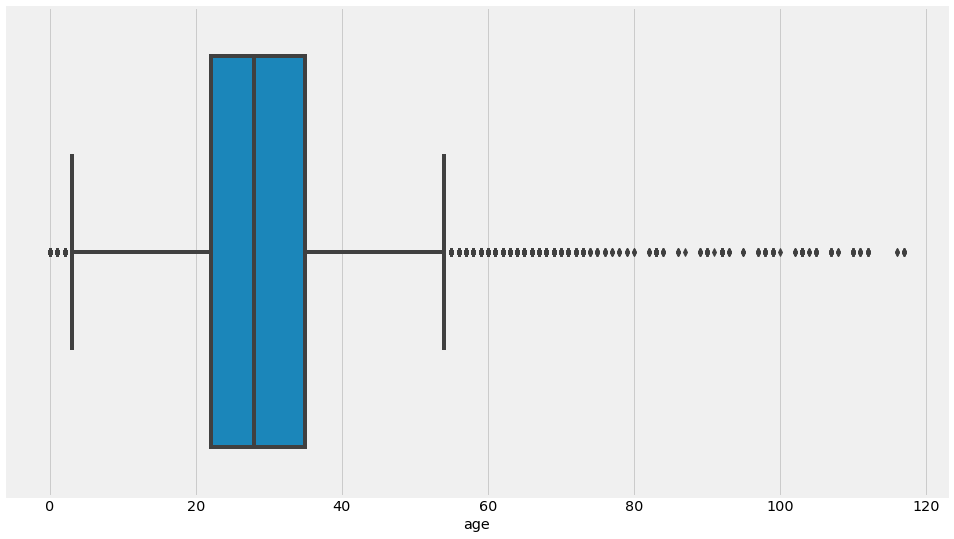

In [41]:
sns.boxplot(df.age)

There are many outliers and fake birthdates, so we will use median age instead of mean age.

### Total sales by cohort

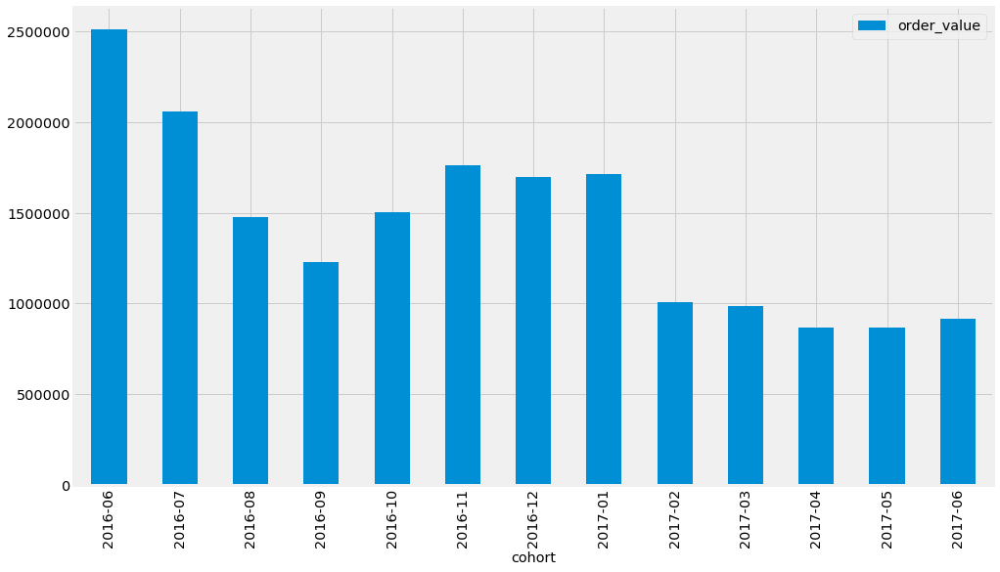

In [42]:
df.groupby('cohort').agg({'order_value': 'sum'}).plot(kind='bar')

### Average Order Value by cohort

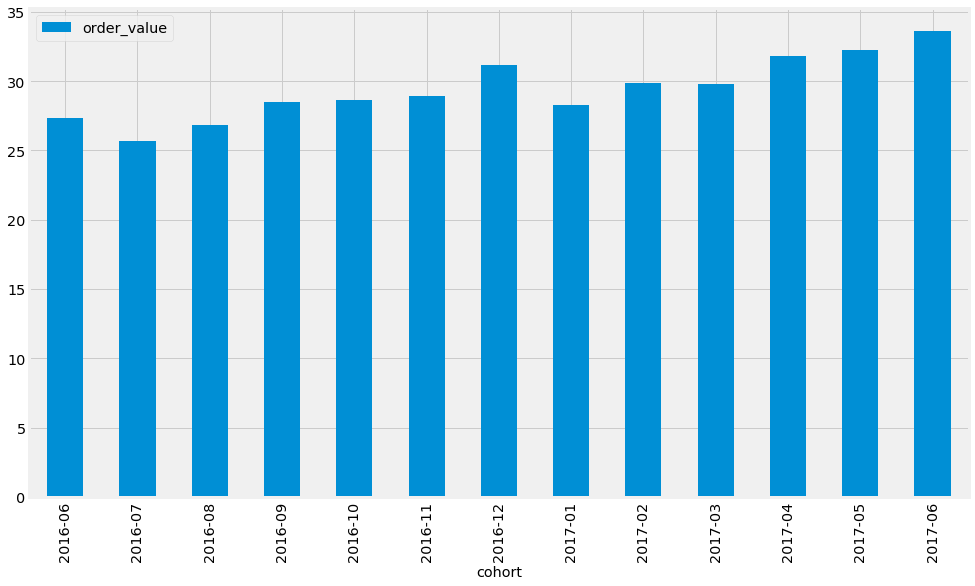

In [43]:
df.groupby('cohort').agg({'order_value': 'mean'}).plot(kind='bar')

### Number of customers in each cohort

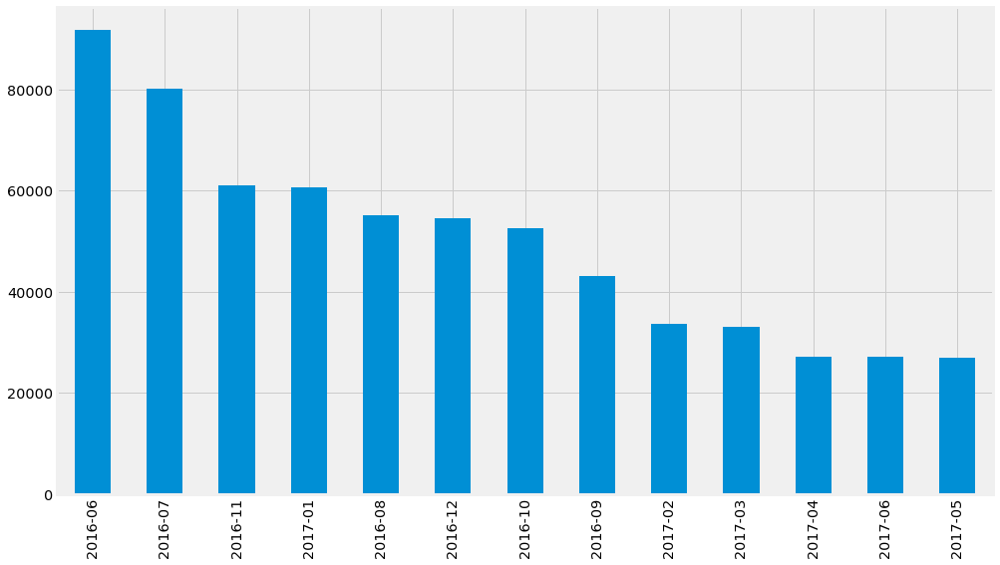

In [44]:
df.cohort.value_counts().plot(kind='bar')

### Gender make-up of customers

In [45]:
# count number of male and female customers
df.groupby('gender').zuid.count()

gender
female    518053
male      127318
Name: zuid, dtype: int64

In [46]:
females = df.groupby('gender').zuid.count()[0]
males = df.groupby('gender').zuid.count()[1]
total = df.groupby('gender').zuid.count().sum()

In [47]:
print('percentage of female customers:', "{:.2f}%".format(females/total*100))
print('percentage of male customers:', "{:.2f}%".format(males/total*100))

percentage of female customers: 80.27%
percentage of male customers: 19.73%


In [48]:
# order value by gender
df.groupby('gender').mean()

,order_value,order_hour,order_month,order_day,age
gender,,,,,
female,28.200806,14.513810,6.160231,2.965092,30.092295
male,31.029860,14.291255,6.502372,3.020838,27.861900


No significant difference in average order value by gender.

### Average order value

In [49]:
# calculate total order value for each order
df_order_value = df.groupby('order_nr').agg({'order_value': 'sum'})

In [50]:
df_order_value.describe()

,order_value
count,267262.000000
mean,69.577323
std,62.471352
min,-445.780000
25%,32.620000
50%,53.080000
75%,88.640000
max,2955.530000


In [51]:
# median order value
df_order_value.median()

order_value    53.08
dtype: float64

### How many orders were made with vouchers?

In [52]:
# for each order, count number of voucher codes used
df_voucher_code = df.groupby('order_nr').agg({'voucher_code': 'count'}).sort_values('voucher_code')

In [53]:
df_voucher_code

,voucher_code
order_nr,
201111135,0
206752655,0
206752675,0
206752725,0
206752737,0
...,...
204345491,60
203639215,60
207875941,61


In [54]:
# find number of orders that had voucher code applied
orders_with_vouchers = len(df_voucher_code[df_voucher_code.voucher_code > 0])
orders_with_vouchers

74656

In [55]:
# percentage of orders with voucher code applied
orders_with_vouchers/len(df_voucher_code)*100

27.93363815282382

### Number of voucher codes

In [56]:
# total number of voucher codes (seen from length of column)
df.voucher_code.value_counts()

ZLAPP15        16764
GRABRWF20       5927
UOBZ520         4733
RED20           4275
BFCM18          4261
               ...  
NL2G39L            1
NLLYG3R            1
NLLYGQ9            1
NLWTO9V            1
THANKS5ZDGQ        1
Name: voucher_code, Length: 13403, dtype: int64

### Average number of orders per voucher

In [57]:
print('on average, the number of orders generated per campaign is:')

# orders with vouchers applied / number of voucher codes
74656 / 13403

on average, the number of orders generated per campaign is:


5.570096247108856

### Top 20 vouchers

In [58]:
df.voucher_code.value_counts().head(20)

ZLAPP15        16764
GRABRWF20       5927
UOBZ520         4733
RED20           4275
BFCM18          4261
BRANDNEW        3586
SHOPDBS20       3552
SALE18          3441
UOBSHOP20       3428
UOBGSS20        2759
BESTEVER        2277
FEVERPITCH      2182
MERRYCITI20     2149
SHOP11NG        2108
PERFECT10       2027
ZBAPQZJ0        1899
MERRYCITI18     1886
FEBTASY         1820
SUMMER17        1701
JULYJOY         1532
Name: voucher_code, dtype: int64

### Worst 20 vouchers

In [59]:
df.voucher_code.value_counts().tail(20)

NLK4FI3          1
SHOPCITIE2L78    1
NL15CSFPW66      1
ZALSGFWK372S     1
PLS5NFCW         1
SHOPCITISTTU9    1
NLKX64Z          1
NLT3YYD          1
NLKMUQ6          1
NL53P1B          1
SHOPCITIYYELW    1
ZSTAFFBD6MF6K    1
SHOPE2L2J        1
NL1566S4Z        1
NLG5IZA          1
NL2G39L          1
NLLYG3R          1
NLLYGQ9          1
NLWTO9V          1
THANKS5ZDGQ      1
Name: voucher_code, dtype: int64

### Which was the best month for sales?

We have data for both June 16 and June 17 sales, so let's keep the June 17 sales for analysis since the rest of the months only have sales data for one year.

In [60]:
# Filter out Jun 16 and use Jun 17 sales for month of June sales.
df_after_jun16 = df[df['order_year_mth'] != '2016-06']

In [61]:
df_after_jun16 

,zuid,gender,birthday,cohort,order_nr,environment,voucher_code,order_value,brand,category,sub_category,order_created_at,order_status,order_time,order_hour,order_year_mth,order_month,order_day,age
1,213794755865817,male,NaT,2016-07,205926117,mobile,NaN,27.10,Burton Menswear London,apparel,Shirts,2016-08-02 00:52:44,net,00:52:44,0,2016-08,8,1,NaN
2,213794755865817,male,NaT,2016-07,207816617,mobile,NaN,23.03,Bellfield,apparel,T-Shirts,2016-07-22 13:06:46,net,13:06:46,13,2016-07,7,4,NaN
3,213794755865817,male,NaT,2016-07,205926117,mobile,NaN,13.93,ZALORA,apparel,T-Shirts,2016-08-02 00:52:44,net,00:52:44,0,2016-08,8,1,NaN
4,213794755865817,male,NaT,2016-07,508943717,NaN,NaN,14.02,ZALORA,apparel,Shorts,2016-07-30 11:07:31,net,11:07:31,11,2016-07,7,5,NaN
5,213794755865817,male,NaT,2016-07,205926117,mobile,NaN,13.93,ZALORA,apparel,T-Shirts,2016-08-02 00:52:44,net,00:52:44,0,2016-08,8,1,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
929469,214674382676104,male,1981-05-05,2017-03,209837635,mobile,5INMARCH,8.05,Something Borrowed,apparel,Tops,2017-03-02 17:02:48,net,17:02:48,17,2017-03,3,3,36.0
929470,214674382676104,male,1981-05-05,2017-03,209837635,mobile,5INMARCH,8.05,ZALORA,apparel,Tops,2017-03-02 17:02:48,net,17:02:48,17,2017-03,3,3,36.0
929474,214674382676104,male,1981-05-05,2017-03,209837635,mobile,5INMARCH,12.93,Penshoppe,apparel,Tops,2017-03-02 17:02:48,net,17:02:48,17,2017-03,3,3,36.0
929475,214674382676104,male,1981-05-05,2017-03,209837635,mobile,5INMARCH,10.49,ZALORA,apparel,Tops,2017-03-02 17:02:48,net,17:02:48,17,2017-03,3,3,36.0


In [62]:
df_monthly = df_after_jun16.groupby('order_month', as_index=False).agg({'order_value':'sum'})
df_monthly

,order_month,order_value
0,1,1961102.74
1,2,1297554.32
2,3,1534976.88
3,4,1463915.85
4,5,1624975.64
5,6,2053440.29
6,7,1154018.03
7,8,987245.24
8,9,909156.64
9,10,1152429.02


#### Currency formatter

In [63]:
# truncate large currency values
def currency(x, pos):
    """The two args are the value and tick position"""
    if x >= 1e6:
        c = '${:1.1f}M'.format(x*1e-6)
    else:
        c = '${:1.0f}K'.format(x*1e-3)
    return c

curr_formatter = FuncFormatter(currency)

#### Large number formatter

In [64]:
# truncate large numbers
def number(x, pos):
    """The two args are the value and tick position"""
    if x >= 1e6:
        c = '{:1.1f}M'.format(x*1e-6)
    else:
        c = '{:1.0f}K'.format(x*1e-3)
    return c

num_formatter = FuncFormatter(number)

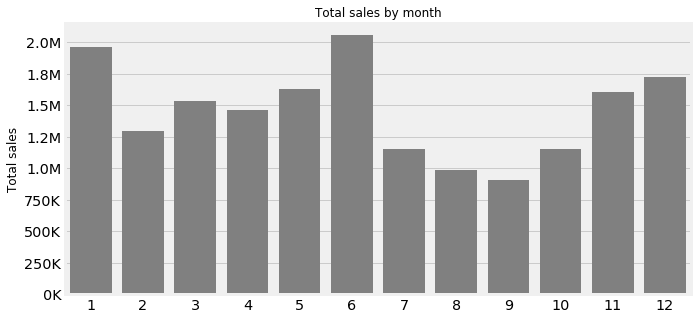

In [65]:
plt.figure(figsize=(10,5))
ax = sns.barplot(data=df_monthly, 
            x='order_month', 
            y='order_value',
            color='grey')
plt.xlabel(None)
plt.ylabel('Total sales', size='large')
plt.title('Total sales by month', size='large')
ax.yaxis.set_major_formatter(num_formatter)

### Try a rolling average for more granular trend

In [66]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 646680 entries, 1 to 929476
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   zuid              646680 non-null  object        
 1   gender            645371 non-null  object        
 2   birthday          397118 non-null  datetime64[ns]
 3   cohort            646680 non-null  object        
 4   order_nr          646680 non-null  object        
 5   environment       631877 non-null  object        
 6   voucher_code      238108 non-null  object        
 7   order_value       646680 non-null  float64       
 8   brand             646561 non-null  object        
 9   category          628265 non-null  object        
 10  sub_category      646574 non-null  object        
 11  order_created_at  646680 non-null  datetime64[ns]
 12  order_status      646680 non-null  object        
 13  order_time        646680 non-null  object        
 14  orde

In [67]:
df_dateindex = df.set_index('order_created_at', drop=True)
df_dateindex

,zuid,gender,birthday,cohort,order_nr,environment,voucher_code,order_value,brand,category,sub_category,order_status,order_time,order_hour,order_year_mth,order_month,order_day,age
order_created_at,,,,,,,,,,,,,,,,,,
2016-08-02 00:52:44,213794755865817,male,NaT,2016-07,205926117,mobile,NaN,27.10,Burton Menswear London,apparel,Shirts,net,00:52:44,0,2016-08,8,1,NaN
2016-07-22 13:06:46,213794755865817,male,NaT,2016-07,207816617,mobile,NaN,23.03,Bellfield,apparel,T-Shirts,net,13:06:46,13,2016-07,7,4,NaN
2016-08-02 00:52:44,213794755865817,male,NaT,2016-07,205926117,mobile,NaN,13.93,ZALORA,apparel,T-Shirts,net,00:52:44,0,2016-08,8,1,NaN
2016-07-30 11:07:31,213794755865817,male,NaT,2016-07,508943717,NaN,NaN,14.02,ZALORA,apparel,Shorts,net,11:07:31,11,2016-07,7,5,NaN
2016-08-02 00:52:44,213794755865817,male,NaT,2016-07,205926117,mobile,NaN,13.93,ZALORA,apparel,T-Shirts,net,00:52:44,0,2016-08,8,1,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-03-02 17:02:48,214674382676104,male,1981-05-05,2017-03,209837635,mobile,5INMARCH,8.05,Something Borrowed,apparel,Tops,net,17:02:48,17,2017-03,3,3,36.0
2017-03-02 17:02:48,214674382676104,male,1981-05-05,2017-03,209837635,mobile,5INMARCH,8.05,ZALORA,apparel,Tops,net,17:02:48,17,2017-03,3,3,36.0
2017-03-02 17:02:48,214674382676104,male,1981-05-05,2017-03,209837635,mobile,5INMARCH,12.93,Penshoppe,apparel,Tops,net,17:02:48,17,2017-03,3,3,36.0


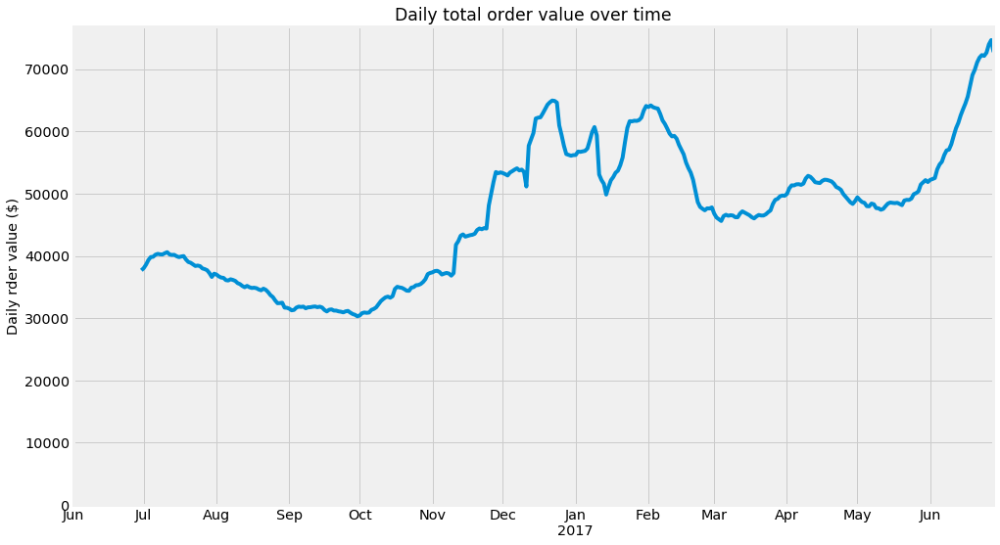

In [68]:
ax = df_dateindex.resample('D').sum().rolling(30).mean()['order_value'].plot()
plt.xlabel(None)
plt.ylabel('Daily rder value ($)')
plt.title('Daily total order value over time')
ax.set_ylim(0, None)
plt.savefig('rolling_aov.png', transparent=True, dpi=300);

### Which day of the week receives the most orders?

In [69]:
df_dayweek = df.groupby('order_day', as_index=False).order_nr.count().sort_values('order_day')
df_dayweek.T

,0,1,2,3,4,5,6
order_day,0,1,2,3,4,5,6
order_nr,103312,93684,86289,87531,87268,84829,103767


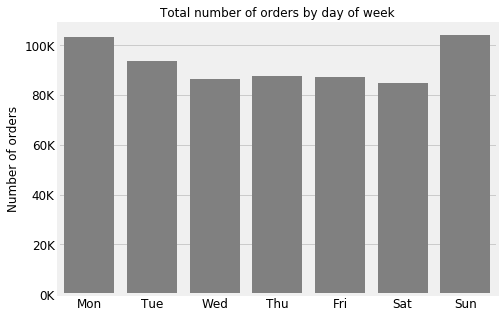

In [70]:
plt.figure(figsize=(7,5))
ax = sns.barplot(data=df_dayweek, 
            x='order_day', 
            y='order_nr',
            color='grey')
plt.xlabel(None)
plt.ylabel('Number of orders', size='large')
plt.title('Total number of orders by day of week', size='large')
bars = ('Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun')
y_pos = np.arange(len(bars))
plt.xticks(y_pos, bars, size='large')
plt.yticks(size='large')
ax.yaxis.set_major_formatter(num_formatter)
plt.savefig('order_by_weekday.png', transparent=True, dpi=300, pad_inches=0.1);

### Orders by hour of day

In [71]:
# get the number of unique orders in each hour
df_hour = df.groupby('order_hour').agg({'order_nr': pd.Series.nunique}).reset_index()
df_hour.T

,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
order_hour,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
order_nr,14681,8023,4174,2238,1389,1432,1966,3426,5832,9159,...,14879,14983,15161,14119,12724,11604,14869,20009,22342,21871


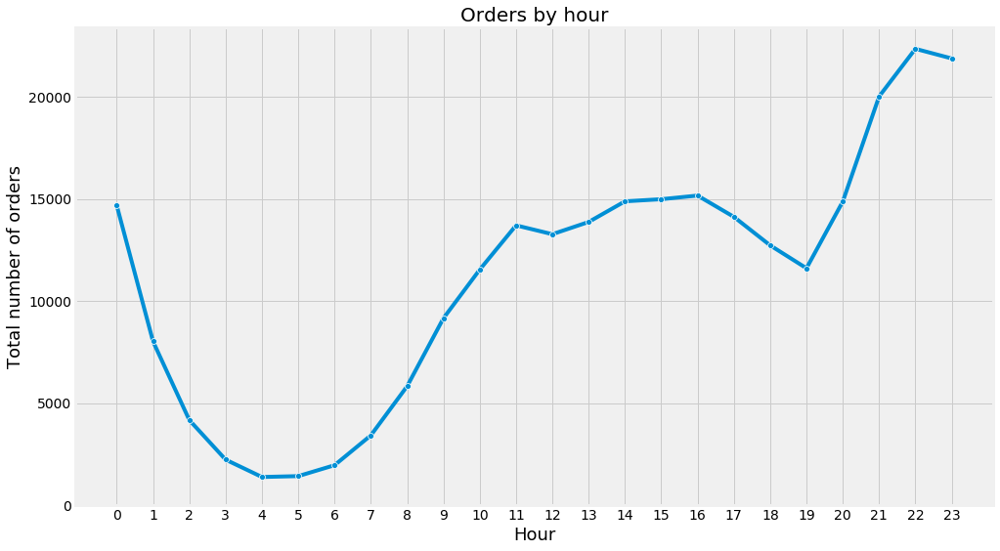

In [72]:
ax = sns.lineplot(data=df_hour, x='order_hour', y='order_nr', marker='o')
x = df_hour.order_hour   # show all the xticks in graph
plt.xticks(x, size=14)
plt.ylim(0, None)
plt.yticks(size=14)
plt.xlabel('Hour', size=18)
plt.ylabel('Total number of orders', size=18)
plt.title('Orders by hour', size=20);

### Which environment did the most number of sales come from?

In [73]:
# find number of unique orders made in each environment
df_env = df.groupby('environment', as_index=False).agg({'order_nr': pd.Series.nunique})

In [74]:
df_env

,environment,order_nr
0,desktop,83737
1,mobile,165210
2,tablet,6174


In [75]:
df_env.columns= ['environment', 'total orders']

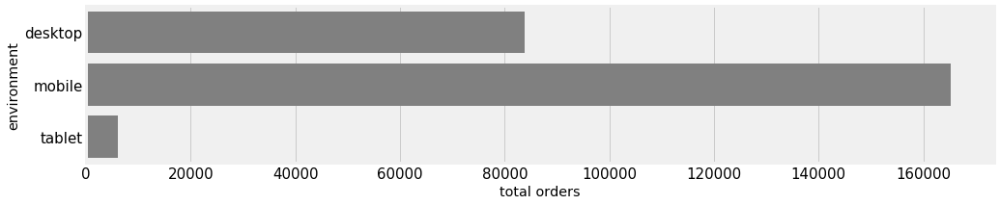

In [76]:
plt.figure(figsize=(15, 3))
sns.barplot(data=df_env, x='total orders', y='environment', color='grey')
plt.yticks(size=15)
plt.xticks(size=15);

Orders made on mobile app are almost twice of tablet and desktop orders combined.

### Which category is most popular?

In [77]:
df_cat = df.groupby('category', as_index=False).agg({'order_value': 'sum'}).sort_values('order_value', ascending=False)

In [78]:
df_cat

,category,order_value
1,apparel,8.784352e+06
0,accessories,2.974620e+06
3,footwear,2.957283e+06
5,sports,1.507744e+06
6,traditional,1.486579e+06
2,beauty,4.174349e+05
4,kids,3.064810e+03


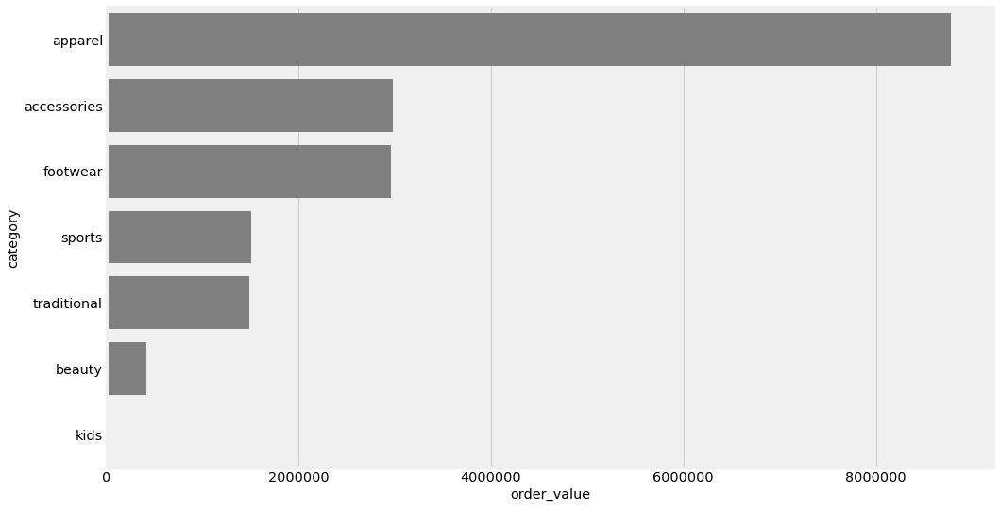

In [79]:
sns.barplot(data=df_cat, 
            x='order_value', 
            y='category', 
            color='grey', 
            saturation=.5)


### Which sub-category is most popular?

In [80]:
df_subcat = df.groupby('sub_category', as_index=False).agg({'order_value': 'sum'}).sort_values('order_value', ascending=False)

In [81]:
df_subcat = df_subcat.head(20)
df_subcat

,sub_category,order_value
12,Dresses,3.419438e+06
76,Tops,1.321077e+06
80,Traditional Dresses,9.233018e+05
0,Backpacks,7.275165e+05
86,Watches,6.962357e+05
54,Sneakers,6.396705e+05
73,T-Shirts,5.996371e+05
22,Heels,5.820643e+05
45,Sandals & Flip Flops,5.485055e+05
61,Sports Lifestyle Shoes,5.168263e+05


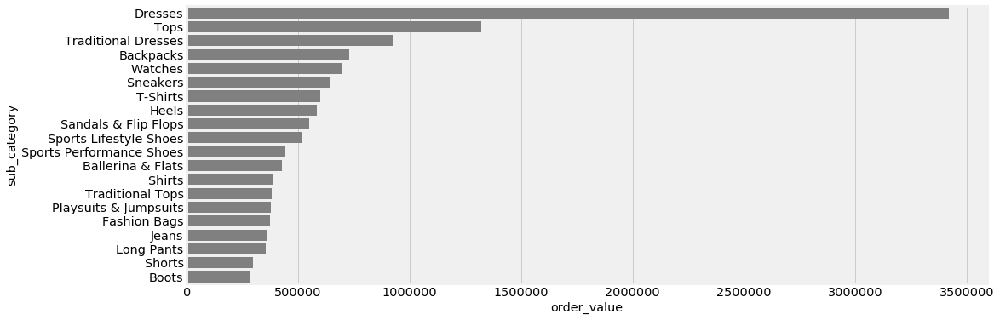

In [82]:
plt.figure(figsize=(15, 6))
sns.barplot(data=df_subcat, 
            x='order_value', 
            y='sub_category', 
            color='grey', 
            saturation=.5);

### Most popular brands

In [83]:
df_brand = df.groupby('brand', as_index=False).agg({'order_value': 'sum'}).sort_values('order_value', ascending=False)

In [91]:
df_brand = df_brand.head(20)

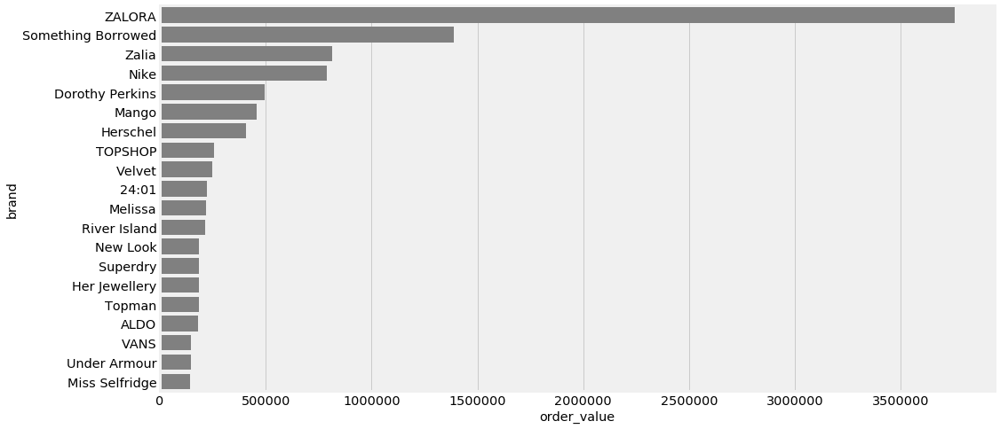

In [92]:
plt.figure(figsize=(15, 8))
sns.barplot(data=df_brand, 
            x='order_value', 
            y='brand', 
            color='grey', 
            saturation=.5);

### Sales of Zalora's private label goods vs. the rest

In [86]:
# Retrieve the value in the first row (index=0), second column
zalora_sales = df_brand.iloc[0][1]

In [87]:
# find total order_value by summing up numbers in order_value column
total_sales = df.order_value.sum()

print('ZALORA brand contribution to total sales')
zalora_sales/total_sales

ZALORA brand contribution to total sales


0.20183709180438367

#### Inspect ZALORA's most popular sub-categories

In [94]:
df_zalora = df[df['brand'] == 'ZALORA']

In [95]:
df_zal_subcat = df_zalora.groupby('sub_category', as_index=False).agg({'order_value': 'sum'}).sort_values('order_value', ascending=False)

In [96]:
# use the top 10 sub-categories
df_zal_subcat = df_zal_subcat.head(10)
df_zal_subcat

,sub_category,order_value
8,Dresses,1429324.42
36,Tops,423627.97
11,Heels,238230.29
22,Sandals & Flip Flops,229120.61
30,Sneakers,141042.19
20,Playsuits & Jumpsuits,121781.47
1,Ballerina & Flats,120823.65
23,Shirts,110682.22
15,Long Pants,77199.64
3,Blouses & Tunics,77156.91


In [97]:
dresses = df_zal_subcat.iloc[0,1]
tops = df_zal_subcat.iloc[1,1]

In [98]:
dresses/tops

3.374008614209534

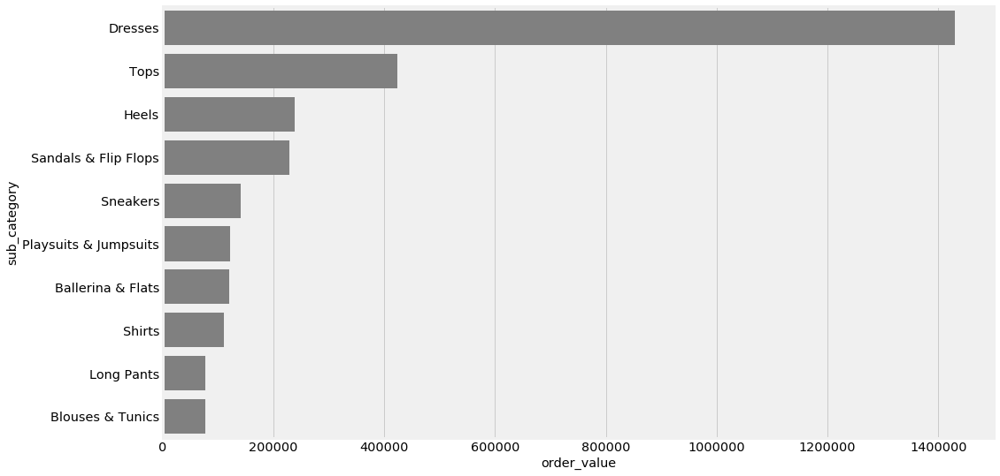

In [99]:
sns.barplot(data=df_zal_subcat, 
            x='order_value', 
            y='sub_category', 
            color='grey', 
            saturation=.5);

The most popular sub-categories for Zalora's label are slightly different from the whole subset

# RFM analysis

### Formulas

- Recency: **number of days** between present date and date of last purchase for each customer.<br>
- Frequency: **number of orders** for each customer.<br>
- Monetary: **total sum of order value** for each customer.

There are three basic steps to RFM analysis:
1. Sort all customers in ascending order based on Recency, Frequency and Monetary Value.
2. Split customers into 4 or 5 for each factor.
3. Combine factors to group customers into RFM segments for targeted marketing.

In [100]:
# Timeframe of the data
print('We will do our RFM analysis from {} to {}.'.format(df['order_created_at'].min(),
                                    df['order_created_at'].max()))

We will do our RFM analysis from 2016-06-01 00:00:39 to 2017-06-28 01:12:33.


## Find the last purchase date of each customer

In [101]:
df.head()

,zuid,gender,birthday,cohort,order_nr,environment,voucher_code,order_value,brand,category,sub_category,order_created_at,order_status,order_time,order_hour,order_year_mth,order_month,order_day,age
1,213794755865817,male,NaT,2016-07,205926117,mobile,NaN,27.10,Burton Menswear London,apparel,Shirts,2016-08-02 00:52:44,net,00:52:44,0,2016-08,8,1,NaN
2,213794755865817,male,NaT,2016-07,207816617,mobile,NaN,23.03,Bellfield,apparel,T-Shirts,2016-07-22 13:06:46,net,13:06:46,13,2016-07,7,4,NaN
3,213794755865817,male,NaT,2016-07,205926117,mobile,NaN,13.93,ZALORA,apparel,T-Shirts,2016-08-02 00:52:44,net,00:52:44,0,2016-08,8,1,NaN
4,213794755865817,male,NaT,2016-07,508943717,NaN,NaN,14.02,ZALORA,apparel,Shorts,2016-07-30 11:07:31,net,11:07:31,11,2016-07,7,5,NaN
5,213794755865817,male,NaT,2016-07,205926117,mobile,NaN,13.93,ZALORA,apparel,T-Shirts,2016-08-02 00:52:44,net,00:52:44,0,2016-08,8,1,NaN


In [102]:
# Group by customer ID and retrieve last date of purchase
recency_df = df.groupby(by='zuid', as_index=False)['order_created_at'].max()
recency_df.columns = ['zuid','last_purchase_date']
recency_df.head()

,zuid,last_purchase_date
0,213794753493298,2016-11-08 23:55:39
1,213794753493443,2017-02-08 13:40:21
2,213794753494558,2017-02-12 11:21:44
3,213794753495092,2017-05-02 19:51:26
4,213794753495236,2016-09-06 21:24:11


To simulate an analysis in real time, we can set the CURRENT date at one day after the last purchase.<br> 
This date will be used as a reference to calculate the Recency score.

In [103]:
CURRENT = df['order_created_at'].max() + timedelta(days=1)
CURRENT

Timestamp('2017-06-29 01:12:33')

In [104]:
rfm = df.groupby('zuid').agg({'order_created_at': lambda date: (CURRENT - date.max()).days, # days since last order
                                        'order_nr': lambda num: len(num), # number of orders made
                                        'order_value': lambda value: value.sum()}) # sum of all order values

In [105]:
rfm.columns = ['recency', 'frequency', 'monetary']

In [106]:
rfm

,recency,frequency,monetary
zuid,,,
213794753493298,232,2,107.87
213794753493443,140,5,244.85
213794753494558,136,1,45.79
213794753495092,57,1,12.06
213794753495236,295,1,46.64
...,...,...,...
214985636584498,1,1,69.07
214985637789865,1,3,42.71
214985642890441,1,4,72.80


## Histogram based on Frequency

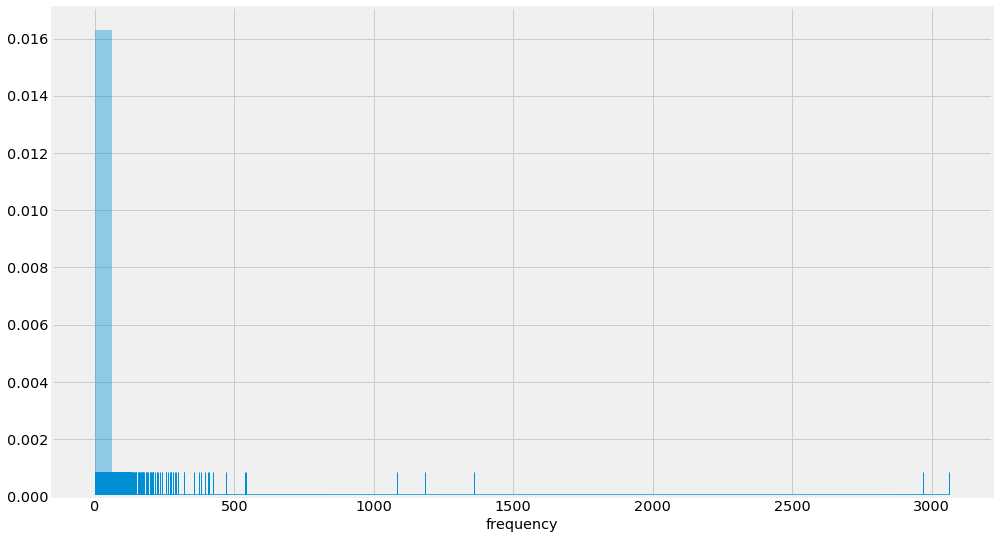

In [107]:
sns.distplot(rfm.frequency, rug=True);

### Inspect distribution of frequency

In [108]:
freq_list = []
cust_count_list = []
cust_count_pct_list = []

for i in range(1,6):
    cust_count = rfm[rfm['frequency'] == i]['frequency'].count()
    cust_count_pct = cust_count/len(rfm)
    
    freq_list.append(i)
    cust_count_list.append(cust_count)
    cust_count_pct_list.append(cust_count_pct)
    
    print(cust_count, 'customers purchased', i, 'time(s)')
    print("{:.2f}%".format(cust_count_pct*100), 'customers purchased', i, 'time(s)\n')

38120 customers purchased 1 time(s)
29.24% customers purchased 1 time(s)

25375 customers purchased 2 time(s)
19.46% customers purchased 2 time(s)

16636 customers purchased 3 time(s)
12.76% customers purchased 3 time(s)

11243 customers purchased 4 time(s)
8.62% customers purchased 4 time(s)

7888 customers purchased 5 time(s)
6.05% customers purchased 5 time(s)



In [109]:
df_freq = pd.DataFrame(list(zip(freq_list, cust_count_list, cust_count_pct_list)), 
               columns =['purchase_count', 'cust_count', 'cust_pct']) 
df_freq

,purchase_count,cust_count,cust_pct
0,1,38120,0.292365
1,2,25375,0.194616
2,3,16636,0.127591
3,4,11243,0.086229
4,5,7888,0.060498


In [110]:
df_freq.cust_pct.cumsum()

0    0.292365
1    0.486981
2    0.614572
3    0.700801
4    0.761299
Name: cust_pct, dtype: float64

## Histogram based on Recency

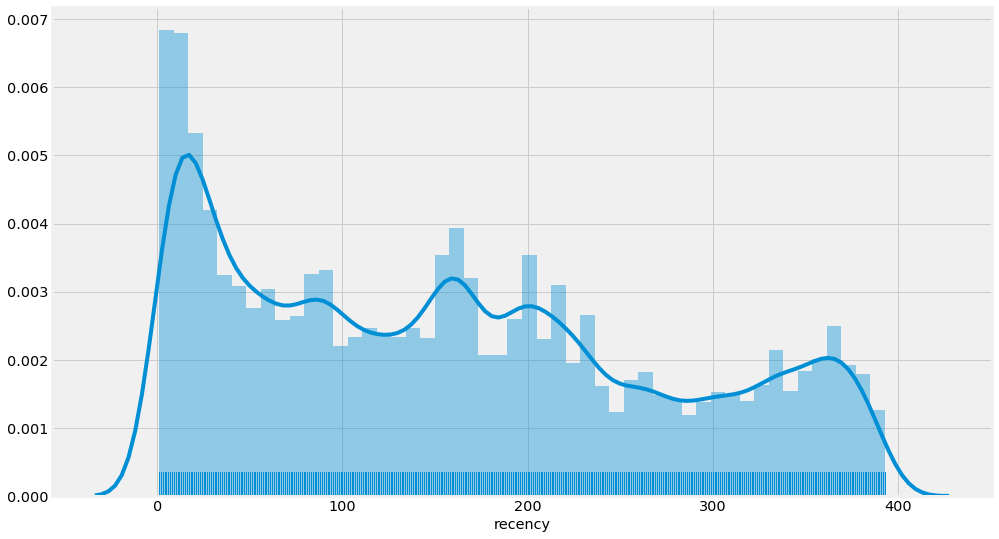

In [111]:
sns.distplot(rfm.recency, rug=True);

In [112]:
rfm.recency.quantile([.2, .4, .6, .8]).to_list()

[38.0, 108.0, 182.0, 273.0]

## Histogram based on Monetary value

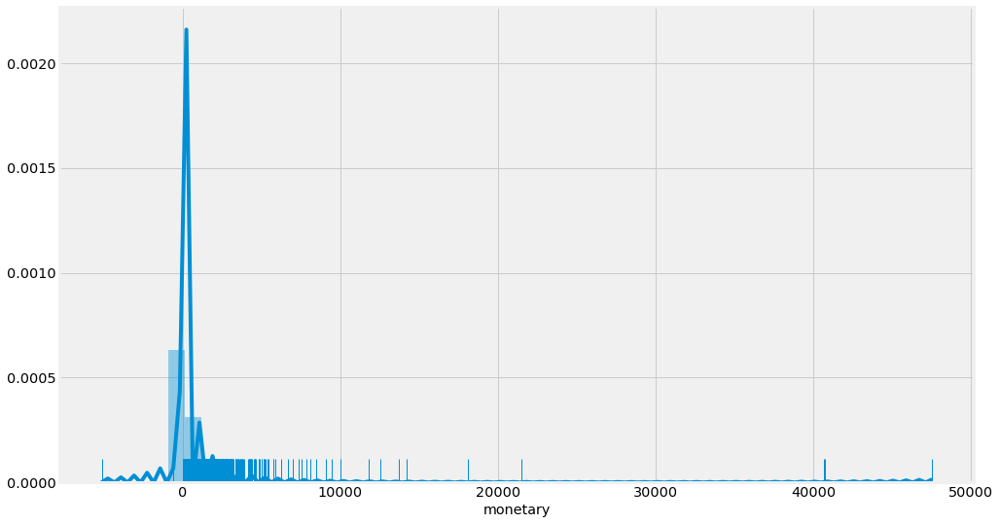

In [113]:
sns.distplot(rfm.monetary, rug=True);

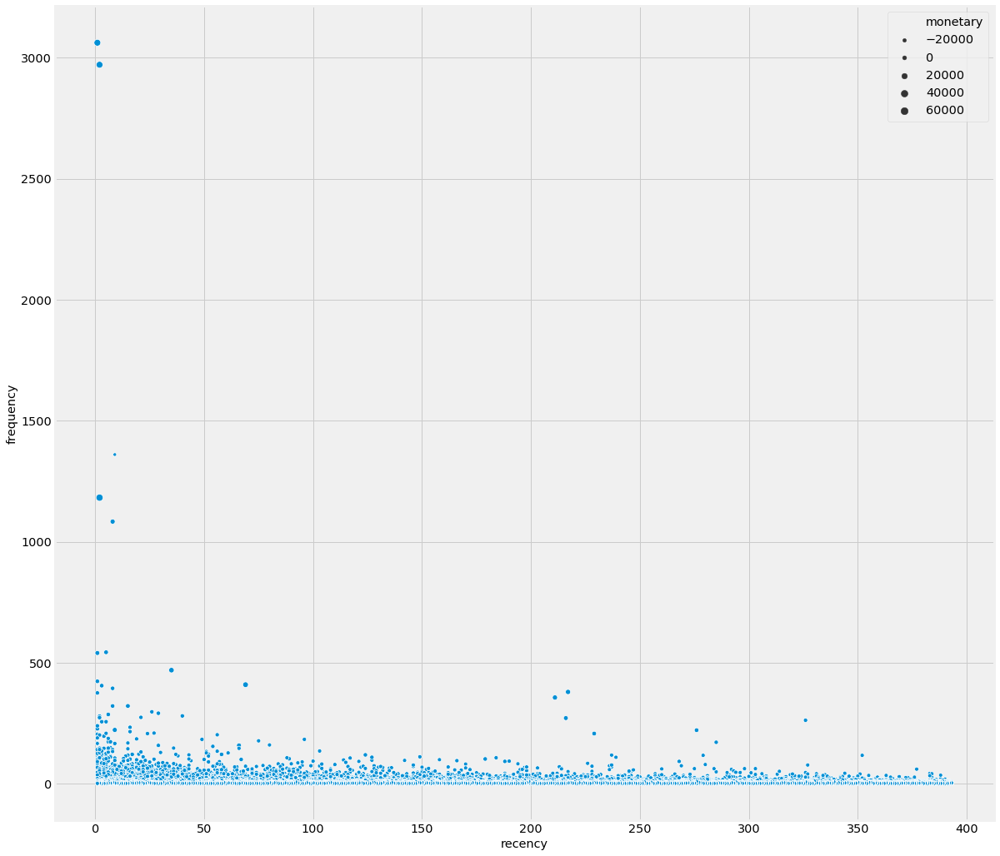

In [114]:
plt.figure(figsize=(18, 18))
sns.scatterplot(data=rfm, 
                x='recency', 
                y='frequency',
                size='monetary')

## Computing Quantile of RFM values

    
The common practice is to divide the customers into 4 or 5 bins. We will go with 5 bins here for more granular analysis and also because the time frame is slightly longer than the conventional one-year timeframe for RFM analysis.

In [115]:
quintiles = rfm.quantile([.2, .4, .6, .8]).to_dict()
pd.DataFrame(quintiles)

,recency,frequency,monetary
0.2,38.0,1.0,41.870
0.4,108.0,2.0,68.210
0.6,182.0,3.0,107.404
0.8,273.0,6.0,185.750


In [116]:
# For Recency, the label is inverse that of Frequency and Monetary.
# This is because a smaller value for Recency is better while larger value for Frequency and Monetary are better.

def r_score(x):
    if x <= quintiles['recency'][.2]:
        return 5
    elif x <= quintiles['recency'][.4]:
        return 4
    elif x <= quintiles['recency'][.6]:
        return 3
    elif x <= quintiles['recency'][.8]:
        return 2
    else:
        return 1
    
def fm_score(x, column):
    if x <= quintiles[column][.2]:
        return 1
    elif x <= quintiles[column][.4]:
        return 2
    elif x <= quintiles[column][.6]:
        return 3
    elif x <= quintiles[column][.8]:
        return 4
    else:
        return 5

In [117]:
rfm['R'] = rfm['recency'].apply(lambda x: r_score(x))
rfm['F'] = rfm['frequency'].apply(lambda x: fm_score(x, 'frequency'))
rfm['M'] = rfm['monetary'].apply(lambda x: fm_score(x, 'monetary'))

In [118]:
rfm.info()

<class 'pandas.core.frame.DataFrame'>
Index: 130385 entries, 213794753493298 to 214985648339920
Data columns (total 6 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   recency    130385 non-null  int64  
 1   frequency  130385 non-null  int64  
 2   monetary   130385 non-null  float64
 3   R          130385 non-null  int64  
 4   F          130385 non-null  int64  
 5   M          130385 non-null  int64  
dtypes: float64(1), int64(5)
memory usage: 12.0+ MB


In [119]:
rfm['RFM_score'] = rfm['R'].apply(str) + rfm['F'].apply(str) + rfm['M'].apply(str)

In [120]:
rfm # 5 is the best score

,recency,frequency,monetary,R,F,M,RFM_score
zuid,,,,,,,
213794753493298,232,2,107.87,2,2,4,224
213794753493443,140,5,244.85,3,4,5,345
213794753494558,136,1,45.79,3,1,2,312
213794753495092,57,1,12.06,4,1,1,411
213794753495236,295,1,46.64,1,1,2,112
...,...,...,...,...,...,...,...
214985636584498,1,1,69.07,5,1,3,513
214985637789865,1,3,42.71,5,3,2,532
214985642890441,1,4,72.80,5,4,3,543


### Divide customers into segments based on Recency and Frequency

In [121]:
segt_map = {
    r'[1-2][1-2]': 'Hibernating',
    r'[1-2][3-4]': 'Churn risk',
    r'[1-2]5': 'Cannot lose them',
    r'3[1-2]': 'About to sleep',
    r'33': 'Require attention',
    r'[3-4][4-5]': 'Loyal customers',
    r'41': 'Recent customer',
    r'51': 'New customer',
    r'[4-5][2-3]': 'Potential loyalists',
    r'5[4-5]': 'Champions'
}

rfm['Segment'] = rfm['R'].map(str) + rfm['F'].map(str)
rfm['Segment'] = rfm['Segment'].replace(segt_map, regex=True)
rfm.head()

,recency,frequency,monetary,R,F,M,RFM_score,Segment
zuid,,,,,,,,
213794753493298,232,2,107.87,2,2,4,224,Hibernating
213794753493443,140,5,244.85,3,4,5,345,Loyal customers
213794753494558,136,1,45.79,3,1,2,312,About to sleep
213794753495092,57,1,12.06,4,1,1,411,Recent customer
213794753495236,295,1,46.64,1,1,2,112,Hibernating


In [122]:
pd.DataFrame(rfm.Segment.value_counts())

,Segment
Hibernating,30506
Loyal customers,21460
Churn risk,16034
Potential loyalists,14661
Champions,14248
About to sleep,12793
Recent customer,6568
Cannot lose them,5502
New customer,5072
Require attention,3541
